In [1]:
import sys
sys.path.append('../')
from xd import *
from utils import *
import esutil
import healpy as hp
from systematics import *
from systematics_module import *

%matplotlib inline

%load_ext autoreload
%autoreload 2

## systematic test 

In [2]:
import numpy as np
import healpy as hp

In [3]:
from systematics import sys_iteration, fitting_SP, sys_ngal

In [4]:
def weightmultiply( weightDic ):
    
    length = weightDic['noweight'].size
    w0 = np.ones(length)
    names = weightDic.keys()
    print names
    n = len(names)
    for i in range(n):
        print names[i]
        w0 *= weightDic[names[i]]
        
    return w0
    

In [26]:
def fitting_allSP( suffix, inputdir = None, kind = 'SPT' ):
    filters = ['g', 'r', 'i', 'z']
    fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = kind, 
               suffix=suffix, plot=True, function = 'linear',
                    path = inputdir )

    fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = kind, 
               suffix=suffix, plot=True, function = 'linear',
                    path = inputdir )

    fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = kind, 
               suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

    fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = kind, 
               suffix=suffix, plot=True, function = 'linear',
                    path = inputdir )

    fitting_SP( property = ['GE'], filter=['g'], kind = kind, suffix=suffix, plot=True, function = 'log',
                    path = inputdir )
    


In [6]:
# calling catalog
#from systematics import GalaxyDensity_Systematics,loadSystematicMaps, chisquare_dof, MatchHPArea, SysMapBadRegionMask, callingEliGoldMask

def calling_sysMap( properties=None, kind='SPT', nside=4096, path = None ):
    # Calling maps
    from systematics import callingEliGoldMask,callingY1GoldMask
    GoldMask = callingEliGoldMask()
    #GoldMask = callingY1GoldMask(nside)
    
    MaskDic = {}
    for i,p in enumerate(properties):
        if p == 'NSTARS_allband':
            filename =  'y1a1_gold_1.0.2_stars_nside1024.fits'
            sysMap = loadSystematicMaps( filename = filename, property = p, filter = 'g', nside = 1024 , kind = kind, path = path)
            if kind is 'STRIPE82': sysMap = sysMap[sysMap['DEC'] > -3]
            elif kind is 'SPT': sysMap = sysMap[sysMap['DEC'] < -3]
            mapname = 'sys_'+p+'_'+'g'+'_'+kind
            MaskDic[mapname] = sysMap
            
        elif p == 'GE':
            sysMap = loadSystematicMaps( property = p, filter = 'g', nside = 512 , kind = kind, path = path)
            if kind is 'STRIPE82': sysMap = sysMap[sysMap['DEC'] > -3]
            elif kind is 'SPT': sysMap = sysMap[sysMap['DEC'] < -3]
            mapname = 'sys_'+p+'_'+'g'+'_'+kind
            MaskDic[mapname] = sysMap
            
         
        else :
            filter = ['g', 'r', 'i', 'z']
            
            if p =='EXPTIME':
                filename = ['Y1A1NEW_COADD_'+kind+'_band_'+f+'_nside4096_oversamp4_EXPTIME__total.fits.gz'\
                             for f in filter ]
            elif p =='DEPTH' :
                filename = ['Y1A1NEW_COADD_'+kind+'_band_'+f+'_nside4096_oversamp4_maglimit3__.fits.gz'\
                             for f in filter ]
            elif p == 'NSTARS' : 
                filename = ['Y1A1NEW_COADD_'+kind+'_band_'+f+'_nside4096_oversamp4_NSTARS_ACCEPTED_MEAN_coaddweights3_mean.fits.gz'\
                             for f in filter ]
            else : filename = [None for f in filter]

            for j,f in enumerate(filter):
                sysMap = loadSystematicMaps( filename = filename[j], property = p, filter = f, nside = nside , kind = kind, path = path)
                mapname = 'sys_'+p+'_'+f+'_'+kind
                keep = np.in1d(sysMap['PIXEL'], GoldMask['PIXEL'])
                MaskDic[mapname] = sysMap[keep]
                
    return MaskDic

In [7]:
def maskingCatalogSP(catalog=None, sysMap=None):
    
    
    exp_i_hpind = sysMap['sys_EXPTIME_i_SPT']['PIXEL'][(sysMap['sys_EXPTIME_i_SPT']['SIGNAL'] < 500)]
    fwhm_r_hpind = sysMap['sys_FWHM_r_SPT']['PIXEL'][(sysMap['sys_FWHM_r_SPT']['SIGNAL'] < 4.5)]
    #ge_hpind = sysMap['sys_GE_g_SPT']['PIXEL'][(sysMap['sys_GE_g_SPT']['SIGNAL'] < 0.09)]
    #ge_hpind = sysMap['sys_GE_g_SPT']['PIXEL'][(sysMap['sys_GE_g_SPT']['SIGNAL'] < 100000)]
    #skybrite_g_hpind = sysMap['sys_SKYBRITE_g_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_g_SPT']['SIGNAL'] < 170)]
    #skybrite_i_hpind = sysMap['sys_SKYBRITE_i_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_i_SPT']['SIGNAL'] < 1400)]
    skybrite_g_hpind = sysMap['sys_SKYBRITE_g_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_g_SPT']['SIGNAL'] < 1700000)]
    skybrite_i_hpind = sysMap['sys_SKYBRITE_i_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_i_SPT']['SIGNAL'] < 14000000)]  
    
    all_mask1 = np.zeros( hp.nside2npix(4096), dtype=bool )
    all_mask2 = np.zeros( hp.nside2npix(4096),dtype=bool )
    all_mask3 = np.zeros( hp.nside2npix(4096),dtype=bool )
    all_mask4 = np.zeros( hp.nside2npix(4096),dtype=bool )
    
    all_mask512 = np.zeros( hp.nside2npix(512),dtype=bool )
    
    all_mask1[exp_i_hpind] = 1
    all_mask2[fwhm_r_hpind] = 1
    all_mask3[skybrite_g_hpind] = 1
    all_mask4[skybrite_i_hpind] = 1
    
    #all_mask512[ge_hpind] = 1
    all_mask512 = np.ones( hp.nside2npix(512),dtype=bool )
    all_mask4096 = all_mask1 * all_mask2 * all_mask3* all_mask4


    all_ind4096 = np.arange( hp.nside2npix(4096) )
    all_ind512 = np.arange( hp.nside2npix(512) )
    goodindices4096 = all_ind4096[all_mask4096]
    goodindices512 = all_ind512[all_mask512]
  
    
    #goodindices = np.hstack([exp_i_hpind, fwhm_r_hpind, ge_hpind])
    
    #exp_mask =  (sysMap['sys_EXPTIME_i_SPT']['SIGNAL'] < 500) &  (sysMap['sys_EXPTIME_r_SPT']['SIGNAL'] < 500)
    #fwhm_mask = ((sysMap['sys_FWHM_g_SPT']['SIGNAL'] < 500) & (sysMap['sys_FWHM_r_SPT']['SIGNAL'] < 500) 
    #            & (sysMap['sys_FWHM_i_SPT']['SIGNAL'] < 500) & (sysMap['sys_FWHM_z_SPT']['SIGNAL'] < 500))

    fwhm_mask = (sysMap['sys_FWHM_r_SPT']['SIGNAL'] < 4.5) 
    skybrite_mask = (sysMap['sys_SKYBRITE_g_SPT']['SIGNAL'] < 160) & (sysMap['sys_SKYBRITE_i_SPT']['SIGNAL'] < 1400) \
    &(sysMap['sys_SKYBRITE_z_SPT']['SIGNAL'] < 3000) 
    
    #ge_mask = (sysMap['sys_GE_g_SPT']['SIGNAL'] < 0.08)  
    #all_mask = fwhm_mask*exp_mask*skybrite_mask
    #print 'exp mask ', 1. - np.sum(exp_mask) *1./exp_mask.size
    #print 'fwhm mask', 1. - np.sum(fwhm_mask) *1./fwhm_mask.size
    #print 'skybrite mask', 1. - np.sum(skybrite_mask) *1./skybrite_mask.size
    #print 'all mask', 1. - np.sum(fwhm_mask*exp_mask*skybrite_mask) *1./fwhm_mask.size   

    catHpInd4096 = hpRaDecToHEALPixel(catalog['RA'], catalog['DEC'], nside=4096, nest=False)
    catHpInd512 = hpRaDecToHEALPixel(catalog['RA'], catalog['DEC'], nside=512, nest=False)
    HpIdxInsys_mask4096 = np.in1d(catHpInd4096, goodindices4096)
    HpIdxInsys_mask512 = np.in1d(catHpInd512, goodindices512)
    
    HpIdxInsys_mask = HpIdxInsys_mask4096 * HpIdxInsys_mask512
    
    print HpIdxInsys_mask.size, np.sum(HpIdxInsys_mask)
    print 'mask ', np.sum(HpIdxInsys_mask) * 1./catalog.size
    return catalog[HpIdxInsys_mask]
    

In [8]:
# calling map 
GoldMask = callingEliGoldMask()
#GoldMask_st82 = Cuts.SpatialCuts(GoldMask, ra=320, ra2=360, dec=-2, dec2=2)
GoldMask_st82 = GoldMask[ GoldMask['DEC'] > -3.0 ]
GoldMask_spt = GoldMask[ GoldMask['DEC'] < -3.0 ]
#GoldMask_spt = cutcat20(GoldMask_spt)
#GoldMask_spt = Cuts.SpatialCuts(GoldMask_spt, ra=0, ra2 = 100, dec=-52, dec2 = -48)

pixarea = hp.nside2pixarea( 4096, degrees = True)
sptnpix = GoldMask_spt['PIXEL'].size #hp.get_map_size( GoldMask_spt['PIXEL'] )
st82npix =  GoldMask_st82['PIXEL'].size # hp.get_map_size( GoldMask_st82 )
SPTMaparea = pixarea * sptnpix
ST82Maparea = pixarea * st82npix

In [58]:
# import DMASS

dmass = fitsio.read('../output/n2_2/dmass_spt.fits')
#dmass = cutcat20(dmass)
#cmass = fitsio.read('../output/n2/dmass_st82.fits')
#cmass = fitsio.read('../output/ge_low/train_sample_des.fits')
cmass = fitsio.read('../output/n2/cmass_in_st82.fits')
print 'dmass sample size :', dmass.size
print 'cmass sample size :', cmass.size

dmass sample size : 112398
cmass sample size : 11908


In [55]:
#rand_bg = uniform_random_on_sphere(dmass_spt2, size = 100 * dmass_spt2.size)
#rand_bg = Cuts.keepGoodRegion(rand_bg)
#rand_bg_train = uniform_random_on_sphere(clean_cmass_data_des, size = 100 * clean_cmass_data_des.size)
#rand_bg_train = Cuts.keepGoodRegion(rand_bg_train)

rand = uniform_random_on_sphere(dmass, size = 10 * dmass.size)
rand = Cuts.keepGoodRegion(rand)
#rand = Cuts.keepY1GoldRegion(rand)
rand = rand[ rand['DEC'] < -3.0 ]
#rand = cutcat20(rand)

rand2 = uniform_random_on_sphere(dmass, size = 50 * dmass.size)
rand2 = Cuts.keepGoodRegion(rand2)
#rand = Cuts.keepY1GoldRegion(rand)
rand2 = rand2[ rand2['DEC'] < -3.0 ]
#rand2 = cutcat20(rand2)

rand_cmass = uniform_random_on_sphere(cmass, size = 200 * cmass.size)
rand_cmass = Cuts.keepGoodRegion(rand_cmass)
rand_cmass = rand_cmass[ rand_cmass['DEC'] > -3.0 ]

rand2_cmass = uniform_random_on_sphere(cmass, size = 500 * cmass.size)
rand2_cmass = Cuts.keepGoodRegion(rand2_cmass)
rand2_cmass = rand2_cmass[ rand2_cmass['DEC'] > -3.0 ]

print rand.size, dmass.size
print rand_cmass.size, cmass.size
#rand_train = uniform_random_on_sphere(clean_cmass_data_des, size = 10 * clean_cmass_data_des.size)
#rand_train = Cuts.keepGoodRegion(rand_train)

510271 112398
190174 11698


In [66]:
kind = 'STRIPE82'
FullArea = ST82Maparea
#properties = ['DEPTH','EXPTIME']
#properties = ['DEPTH', 'EXPTIME', 'AIRMASS', 'SKYBRITE', 'FWHM', 'NSTARS']
properties = ['GE']
#properties = ['DEPTH', 'EXPTIME', 'AIRMASS', 'SKYBRITE', 'FWHM', 'NSTARS_allband', 'GE']
#properties = ['FWHM']
suffix='mock'
# calculating galaxy density and weights iterately

In [34]:
sysMap = calling_sysMap( properties=properties, kind='SPT', nside=4096 )


PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_g_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_r_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_i_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_z_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_g_nside4096_oversamp4_EXPTIME__total.fits.gz

KeyboardInterrupt: 

In [67]:
sysMap_st82 = calling_sysMap( properties=properties, kind=kind, nside=4096 )

In [ ]:
dmass_masked = maskingCatalogSP(catalog=dmass, sysMap=sysMap)
rand_masked = maskingCatalogSP(catalog=rand, sysMap=sysMap)
rand2_masked = maskingCatalogSP(catalog=rand, sysMap=sysMap)

In [72]:
inputdir = '../data_txt/systematics/mock_st82/'
figoutdir = inputdir+'/figure/'
os.system('mkdir '+inputdir)
os.system('mkdir '+figoutdir)
os.system('mkdir '+inputdir+'/weights/')
#os.system('cp ../data_txt/systematics/4th/systematic*_no_weight.txt '+inputdir+'/.')

256

11683
saving data to  ../data_txt/systematics/mock_st82/systematic_GE_g_STRIPE82_mock_0001.txt
saving fig to  ../data_txt/systematics/mock_st82//figure/systematic_GE_STRIPE82_mock_0001.png
11683
saving data to  ../data_txt/systematics/mock_st82/systematic_GE_g_STRIPE82_mock_0002.txt
saving fig to  ../data_txt/systematics/mock_st82//figure/systematic_GE_STRIPE82_mock_0002.png
11683
saving data to  ../data_txt/systematics/mock_st82/systematic_GE_g_STRIPE82_mock_0003.txt
saving fig to  ../data_txt/systematics/mock_st82//figure/systematic_GE_STRIPE82_mock_0003.png
11683
saving data to  ../data_txt/systematics/mock_st82/systematic_GE_g_STRIPE82_mock_0004.txt
saving fig to  ../data_txt/systematics/mock_st82//figure/systematic_GE_STRIPE82_mock_0004.png
11683
saving data to  ../data_txt/systematics/mock_st82/systematic_GE_g_STRIPE82_mock_0005.txt
saving fig to  ../data_txt/systematics/mock_st82//figure/systematic_GE_STRIPE82_mock_0005.png
11683
saving data to  ../data_txt/systematics/mock_st82

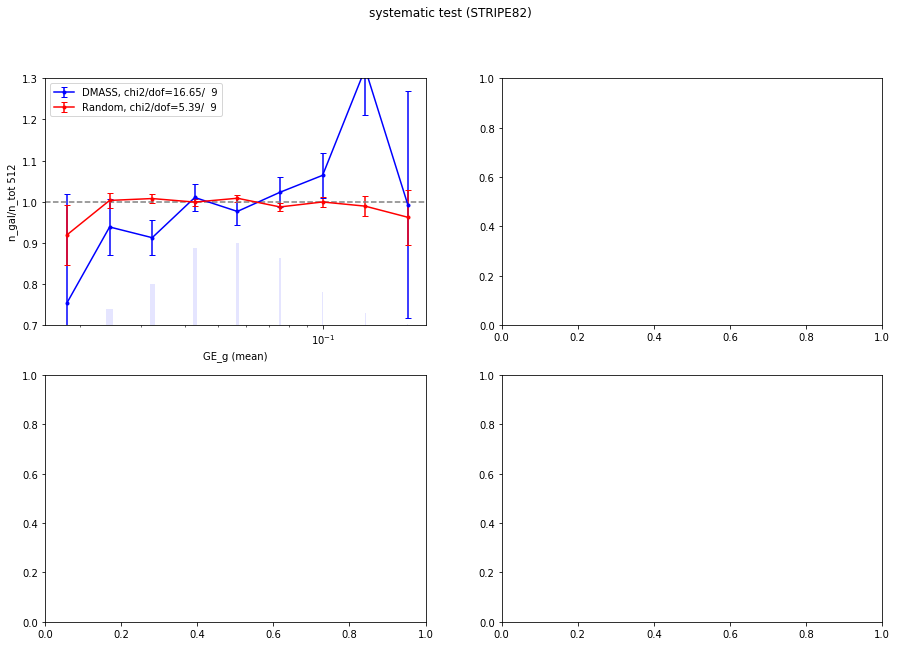

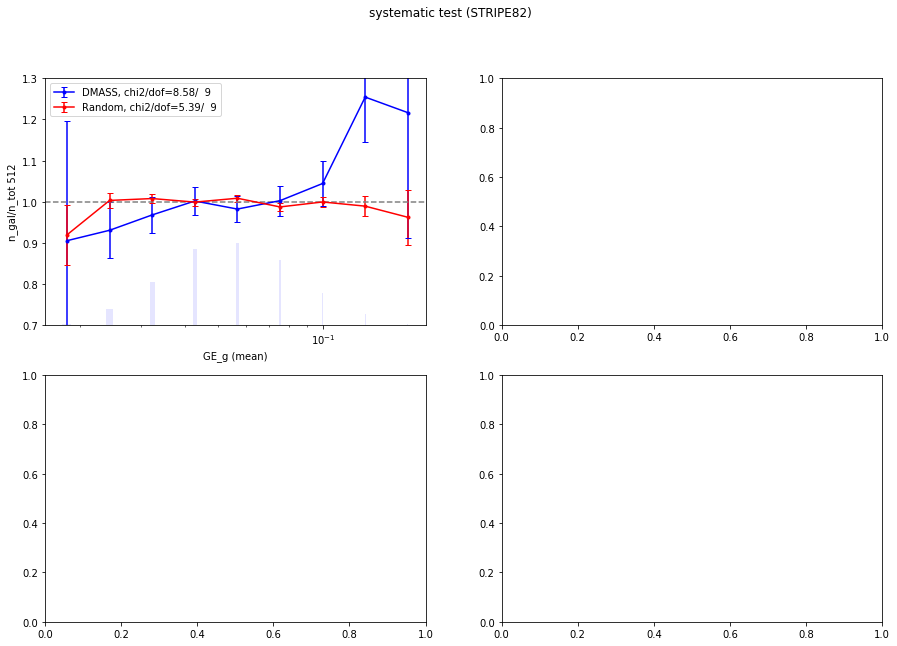

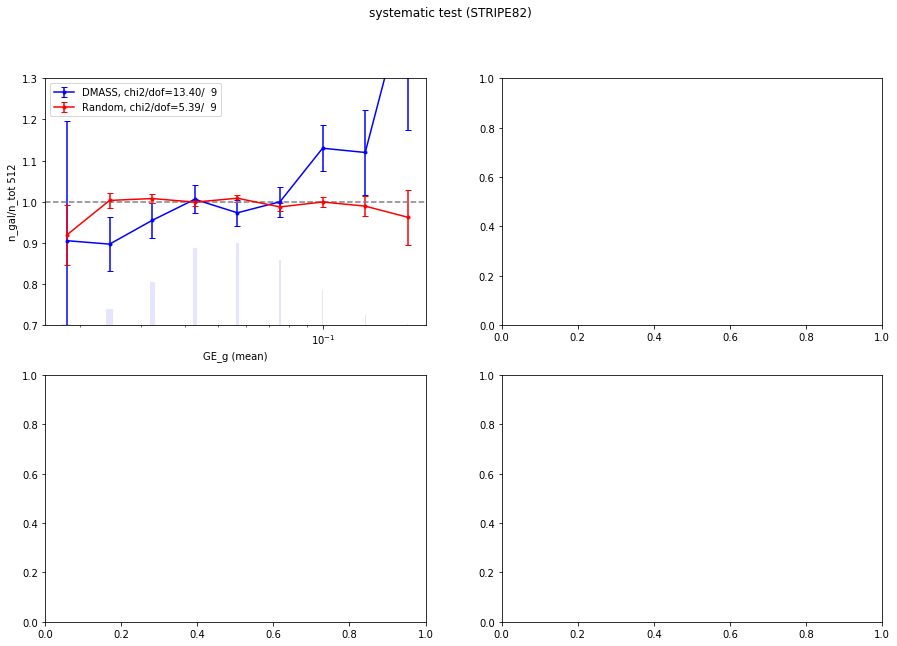

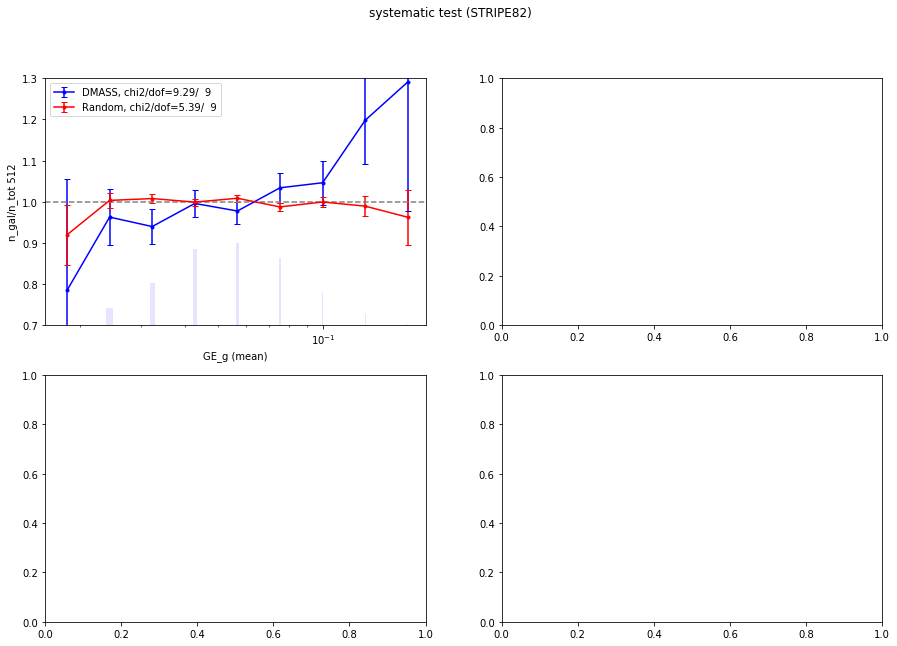

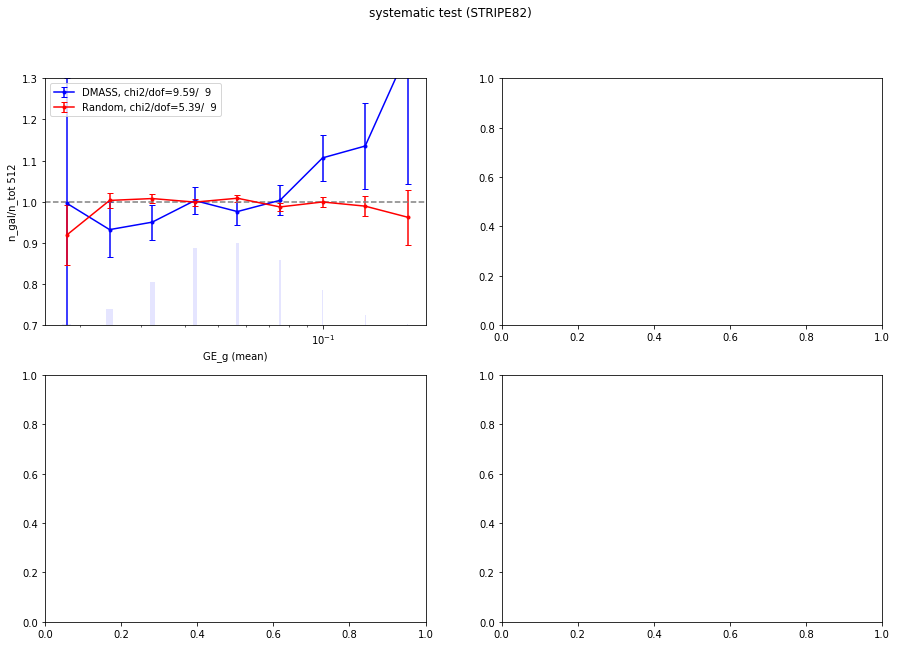

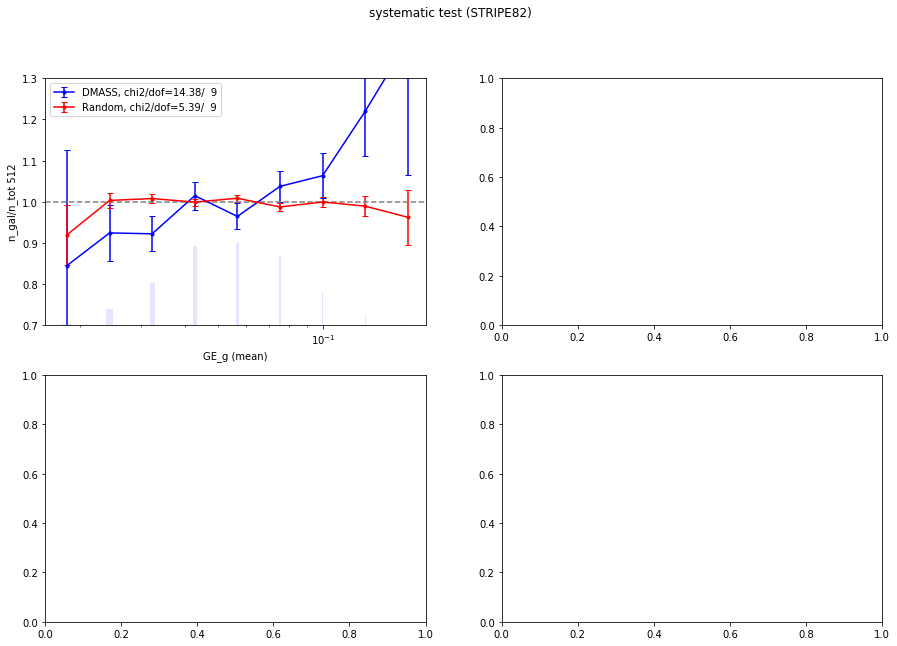

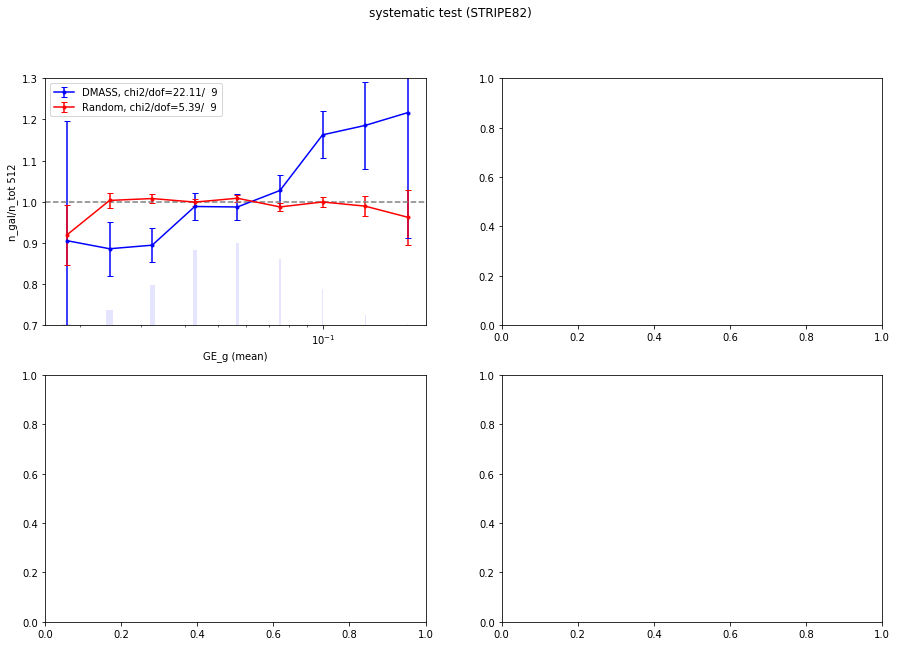

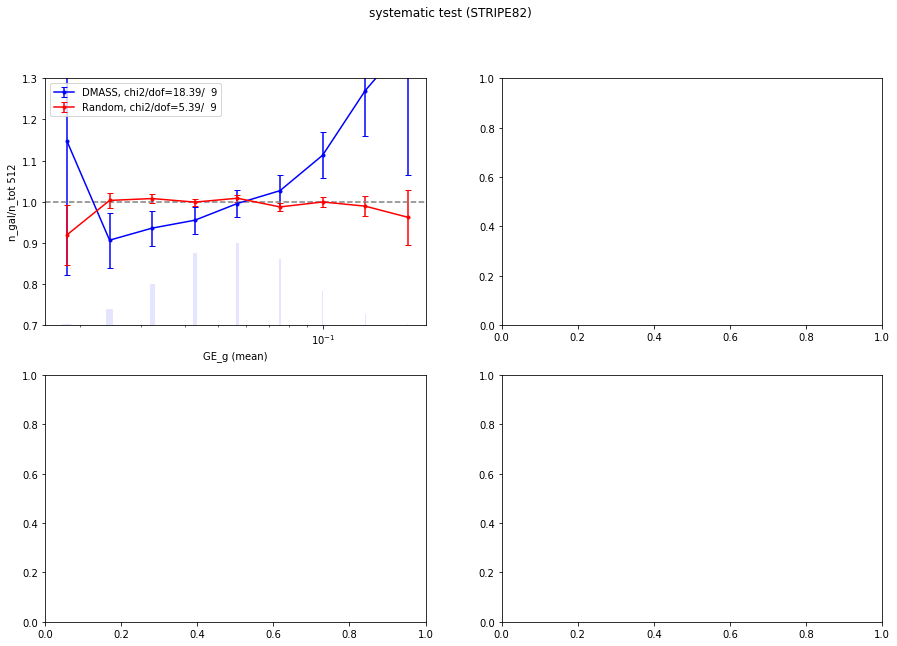

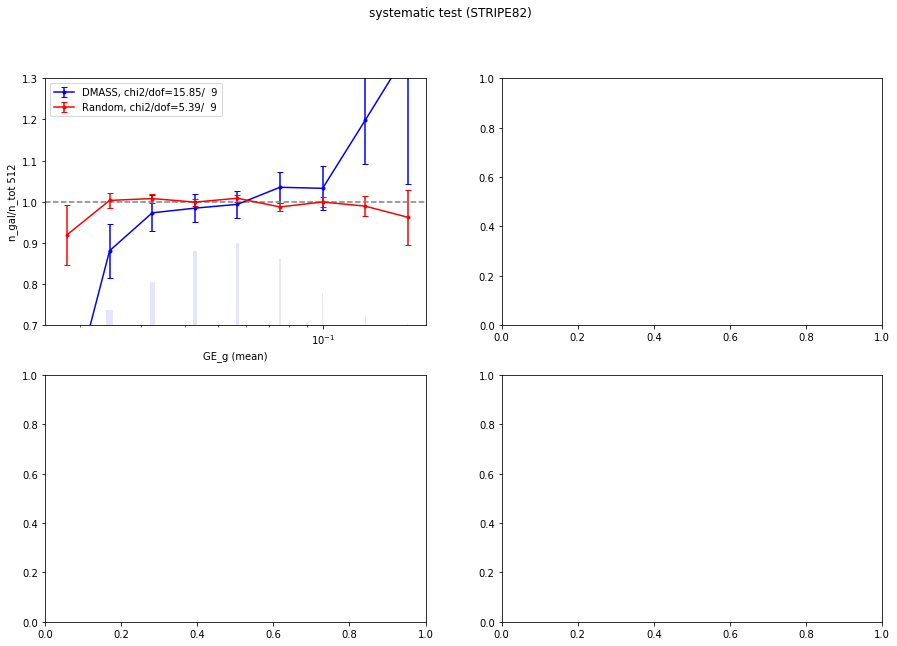

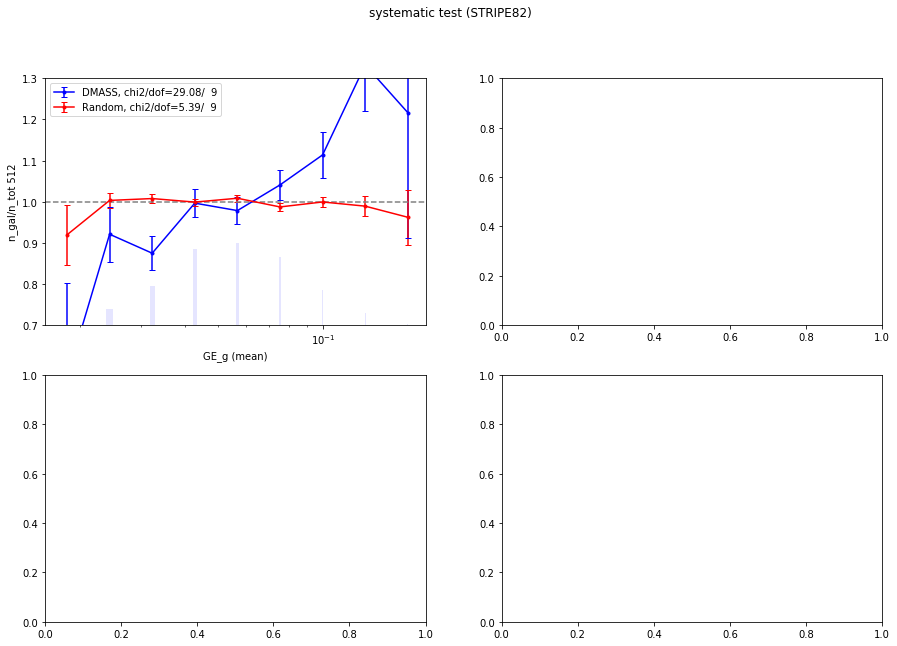

In [75]:
for i in range(1, 11):
    cmass = fitsio.read('../output/mock/dmass_st82_{:04}.fits'.format(i))
    print cmass.size
    sys_ngal(cat1 = cmass, cat2=rand_cmass, rand1 = rand2_cmass, rand2 = rand2_cmass, sysmap = sysMap_st82, 
             FullArea = FullArea, properties = ['GE'], kind='SPT', nbins =15, 
             reweight= None, nside = 4096,
             suffix='mock_{:04}'.format(i), outdir=inputdir)
    doVisualization_ngal(property = 'GE', nside = 4096, kind = kind, suffix='mock_{:04}'.format(i), \
                     inputdir=inputdir, outdir=figoutdir)

In [ ]:
doVisualization_ngal(property = 'GE', nside = 4096, kind = kind, suffix='no_weight', \
                     inputdir=inputdir, outdir=figoutdir)

In [62]:
sys_ngal(cat1 = cmass, cat2=rand_cmass, rand1 = rand2_cmass, rand2 = rand2_cmass, sysmap = sysMap_st82, 
         FullArea = FullArea, properties = ['GE'], kind=kind, nbins =15, 
         reweight= None, nside = 4096,
         suffix='no_weight', outdir=inputdir)

saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_GE_g_STRIPE82_no_weight.txt


saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_GE_STRIPE82_no_weight.png


0

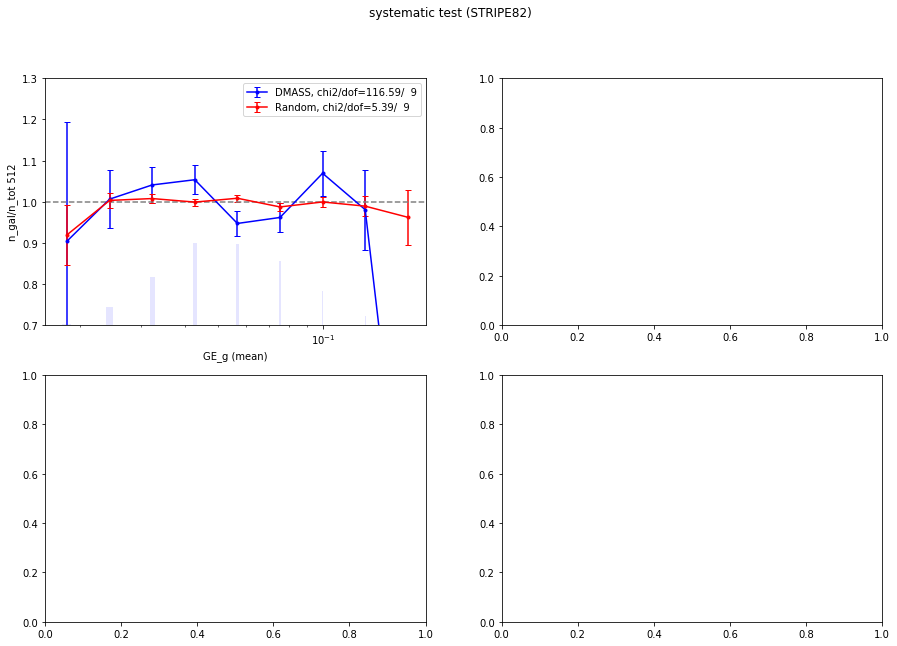

In [57]:
doVisualization_ngal(property = 'GE', nside = 4096, kind = kind, suffix='no_weight', \
                     inputdir=inputdir, outdir=figoutdir)

saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_GE_STRIPE82_no_weight.png


0

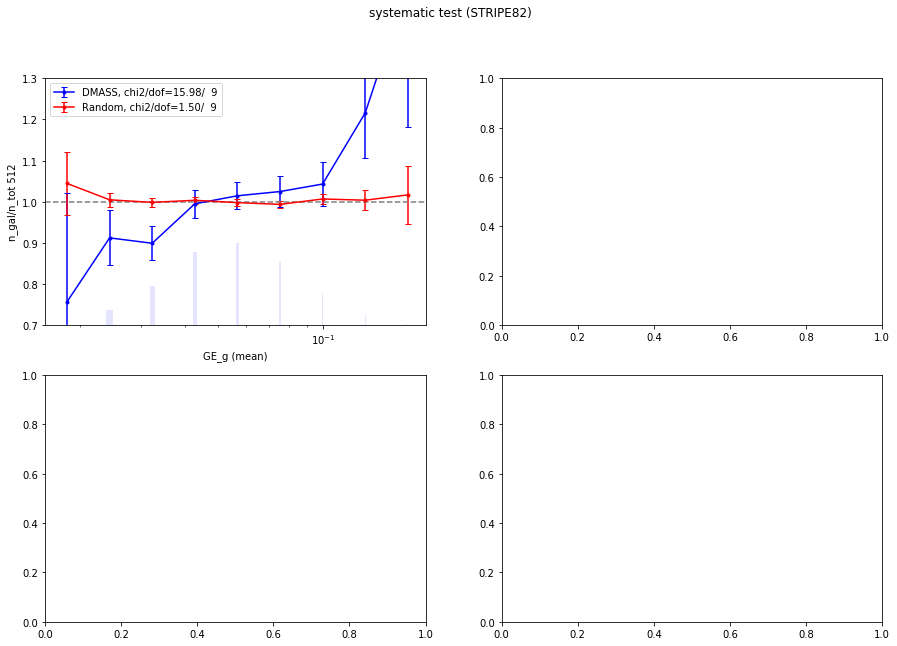

In [41]:
doVisualization_ngal(property = 'GE', nside = 4096, kind = kind, suffix='no_weight', \
                     inputdir=inputdir, outdir=figoutdir)

In [30]:
sys_ngal(cat1 = cmass, cat2=rand_cmass, rand1 = rand2_cmass, rand2 = rand2_cmass, sysmap = sysMap_st82, 
         FullArea = FullArea, properties = properties, kind=kind, nbins =10, 
         reweight= None, nside = 4096,
         suffix='no_weight', outdir=inputdir)

../systematics.py:456: RuntimeWarning: divide by zero encountered in divide
  #nanmask = np.ma.masked_invalid(err).mask
../systematics.py:456: RuntimeWarning: invalid value encountered in multiply
  #nanmask = np.ma.masked_invalid(err).mask


saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_g_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_r_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_i_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_z_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_EXPTIME_g_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_EXPTIME_r_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_EXPTIME_i_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_EXPTIME_z_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_AIRMASS_g_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_AIRMASS_r_S

../systematics.py:452: RuntimeWarning: invalid value encountered in divide
  ratio = Ngal_total * 1./Nrand_total


saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_AIRMASS_z_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_SKYBRITE_g_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_SKYBRITE_r_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_SKYBRITE_i_STRIPE82_no_weight.txt


../systematics.py:452: RuntimeWarning: divide by zero encountered in divide
  ratio = Ngal_total * 1./Nrand_total


saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_SKYBRITE_z_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_FWHM_g_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_FWHM_r_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_FWHM_i_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_FWHM_z_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_NSTARS_allband_g_STRIPE82_no_weight.txt
saving data to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_GE_g_STRIPE82_no_weight.txt


chi2_null =  9.287274752785956
chi2_mod. =  6.207023154858504
Delta chi2 (sample) = 3.080251597927452
output save to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_g_STRIPE82_no_weight.txt.model

chi2_null =  5.835722194785633
chi2_mod. =  3.6116063110450916
Delta chi2 (sample) = 2.224115883740541
output save to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_r_STRIPE82_no_weight.txt.model

chi2_null =  9.478751310485569
chi2_mod. =  8.626997313195197
Delta chi2 (sample) = 0.8517539972903716
output save to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_i_STRIPE82_no_weight.txt.model

chi2_null =  5.27850723562437
chi2_mod. =  2.7598347073254734
Delta chi2 (sample) = 2.5186725282988967
output save to  ../data_txt/systematics/6th_ignore_ge_st82/systematic_DEPTH_z_STRIPE82_no_weight.txt.model

chi2_null =  18.106851664133117
chi2_mod. =  8.016745426581938
Delta chi2 (sample) = 10.09010623755118
output save to  ../data_txt/systematics/6th_ignore_ge_

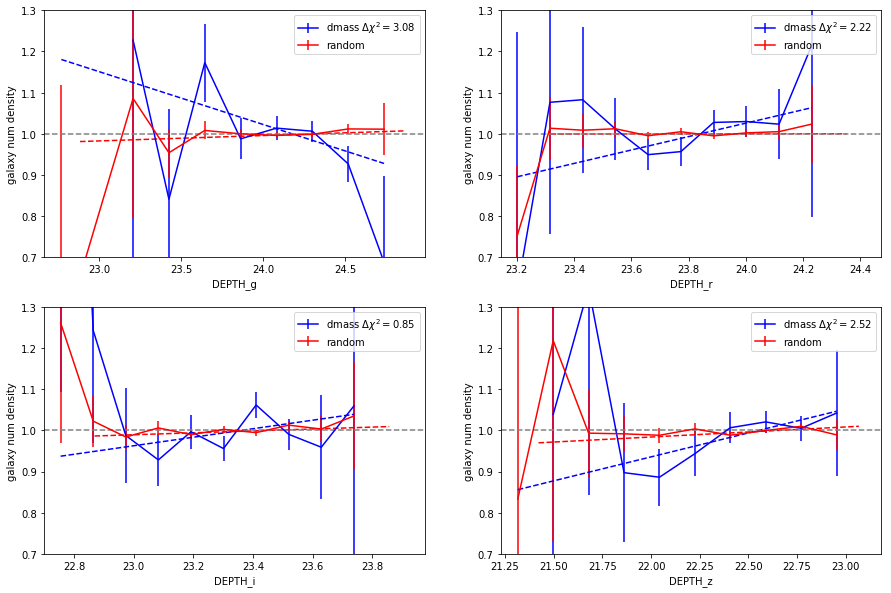

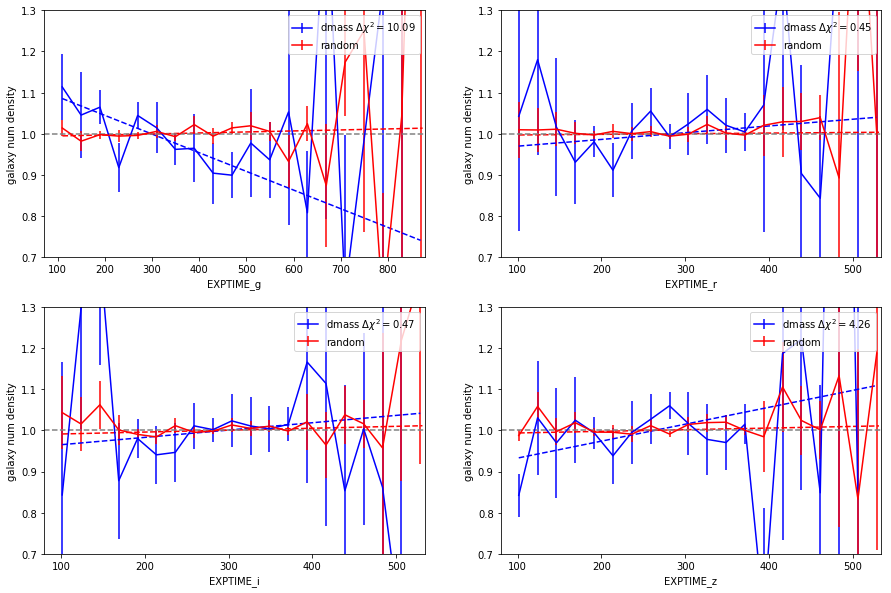

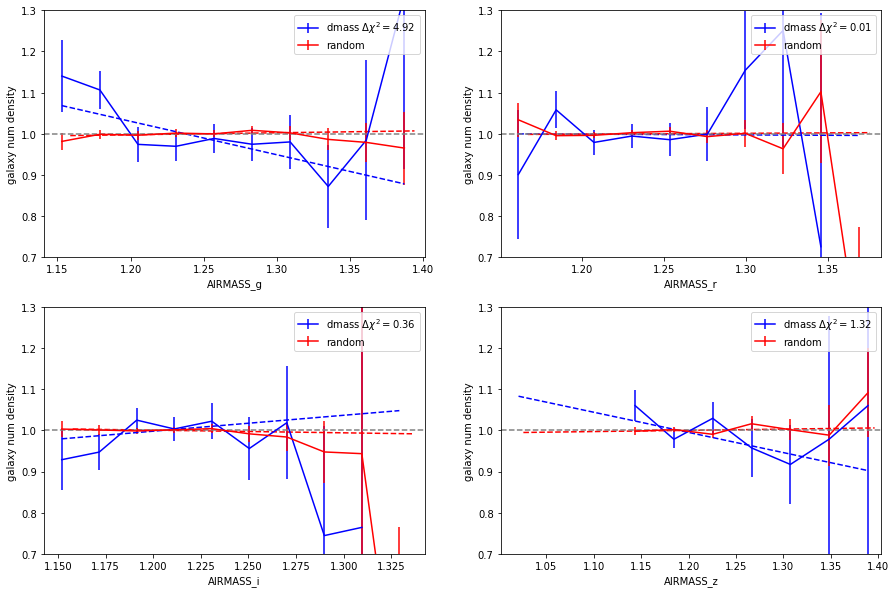

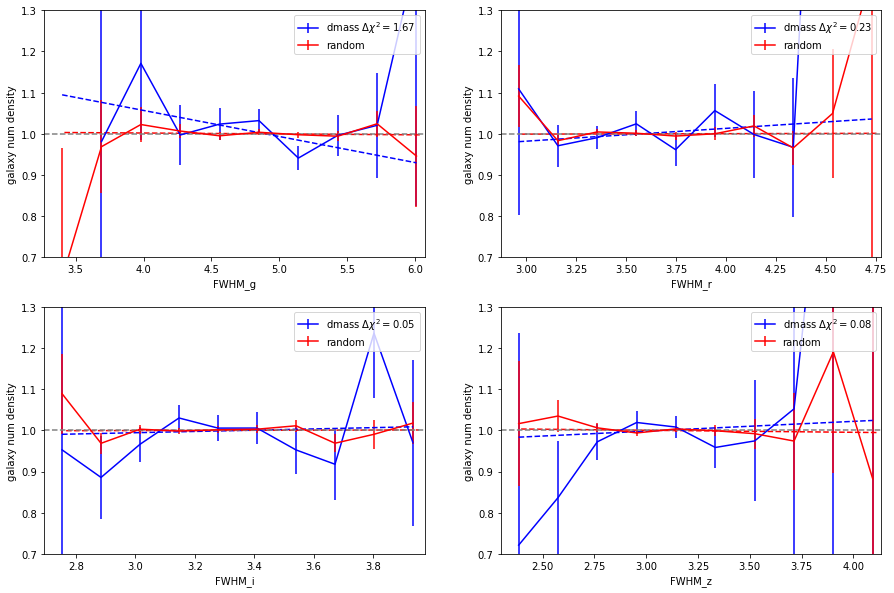

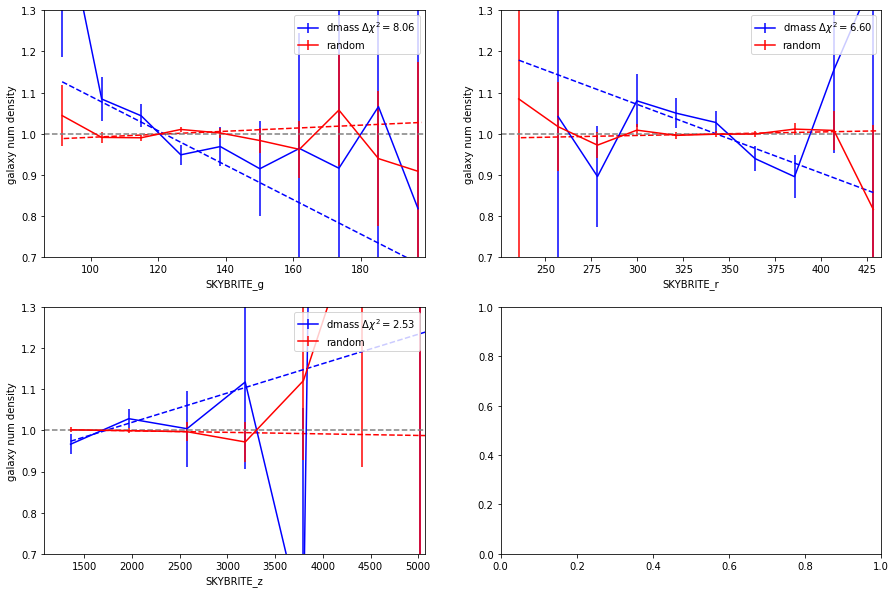

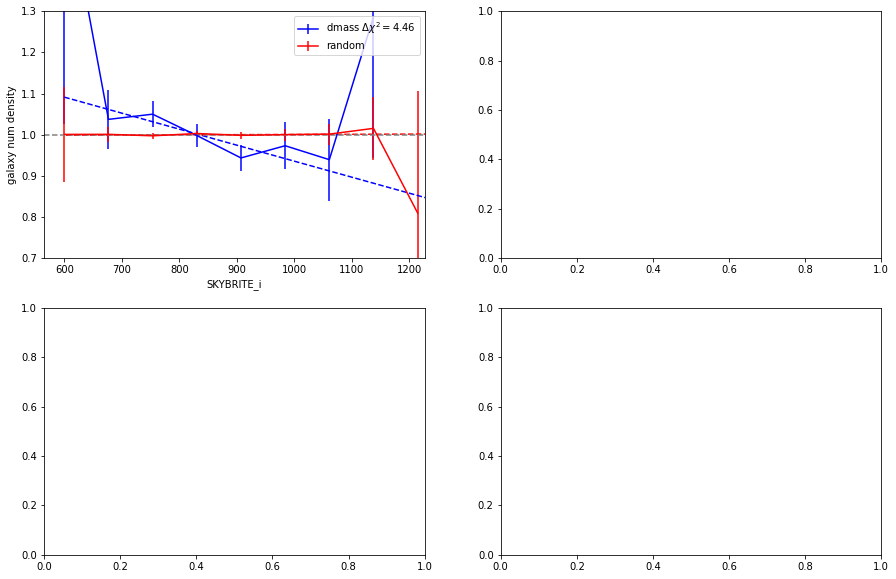

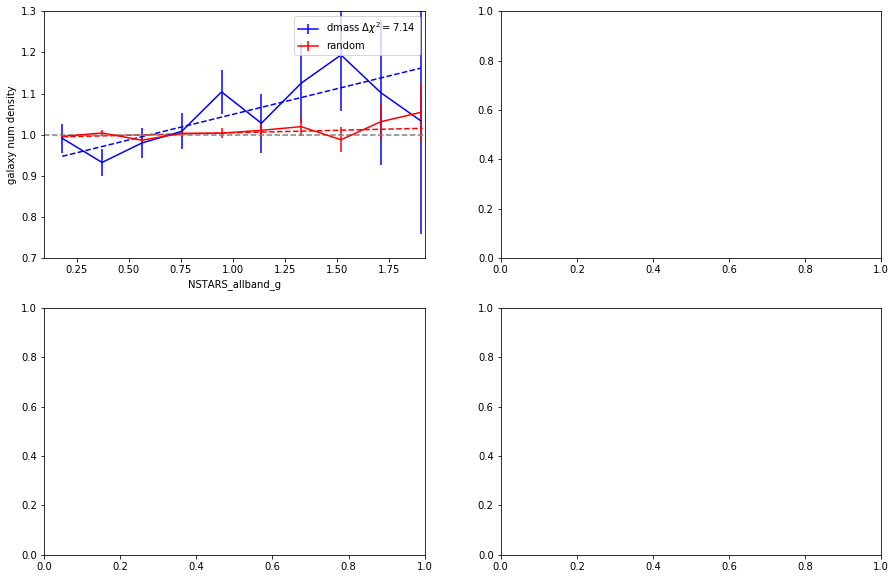

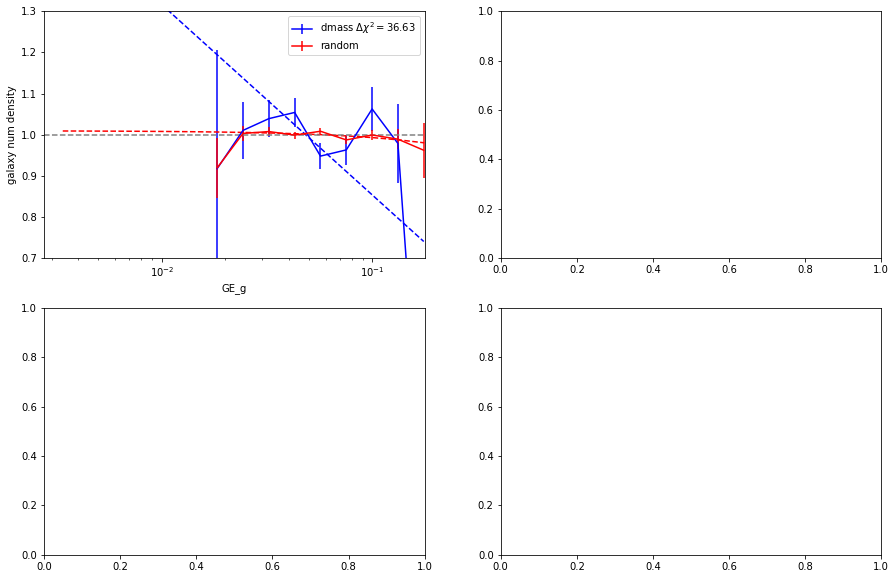

In [64]:
fitting_allSP( 'no_weight', inputdir = inputdir , kind=kind)

saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_DEPTH_STRIPE82_no_weight.png
saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_EXPTIME_STRIPE82_no_weight.png
saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_AIRMASS_STRIPE82_no_weight.png
saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_SKYBRITE_STRIPE82_no_weight.png
saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_FWHM_STRIPE82_no_weight.png
saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_NSTARS_allband_STRIPE82_no_weight.png
saving fig to  ../data_txt/systematics/6th_ignore_ge_st82//figure/systematic_GE_STRIPE82_no_weight.png


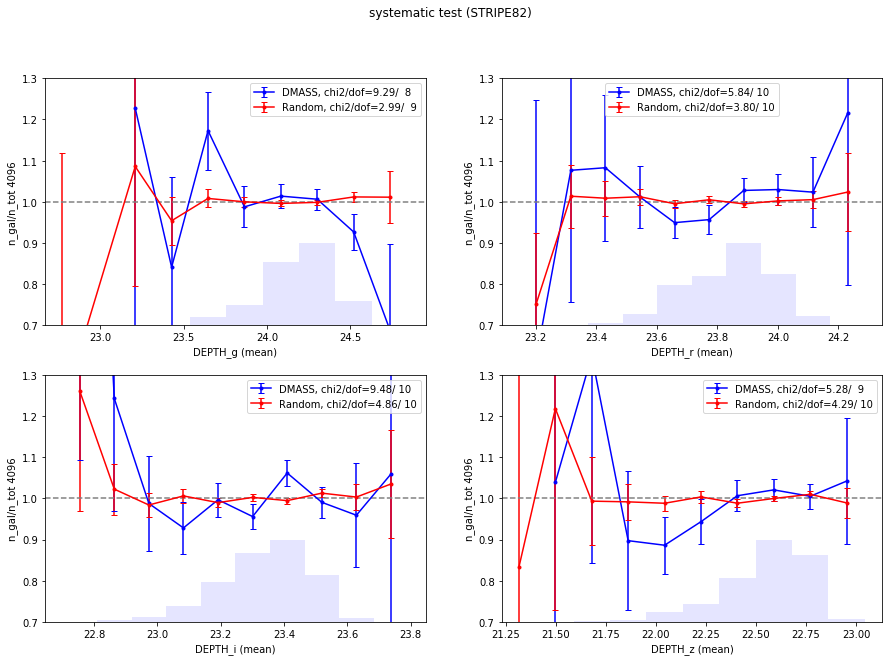

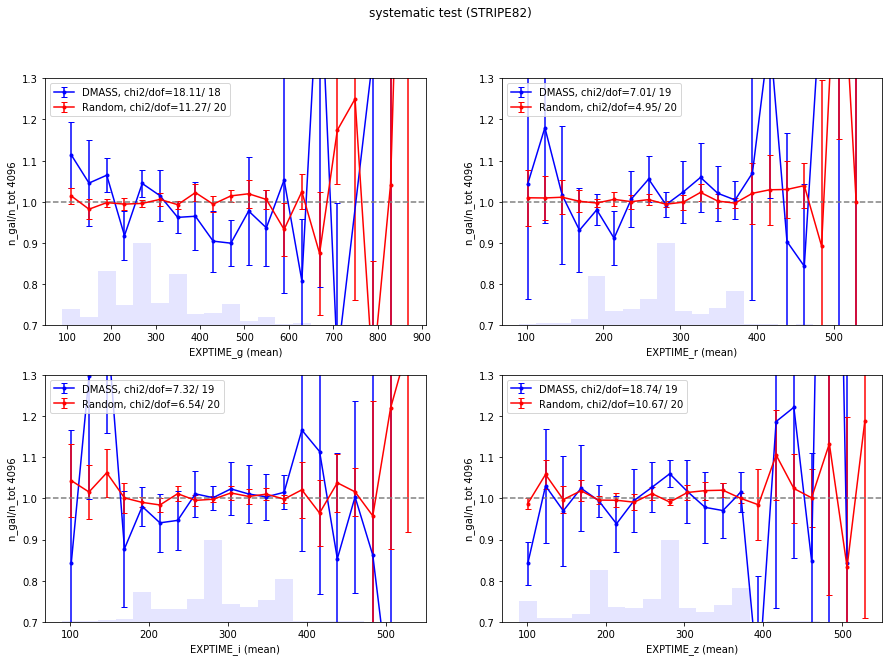

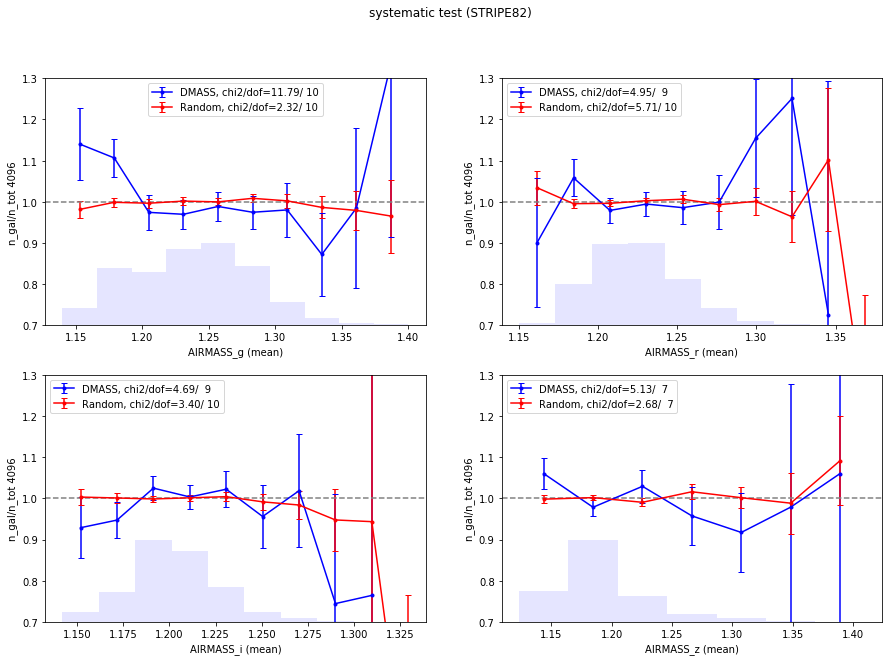

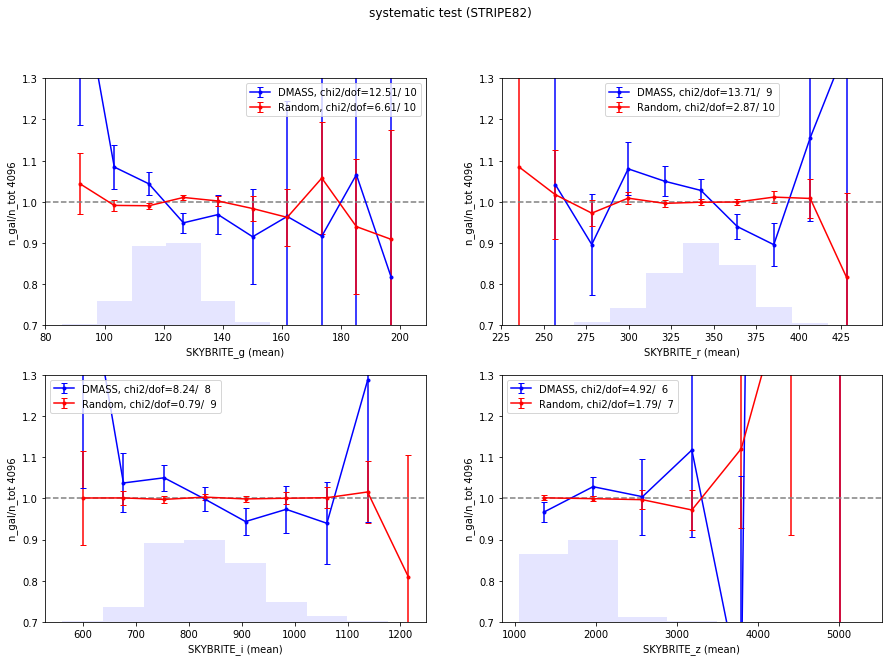

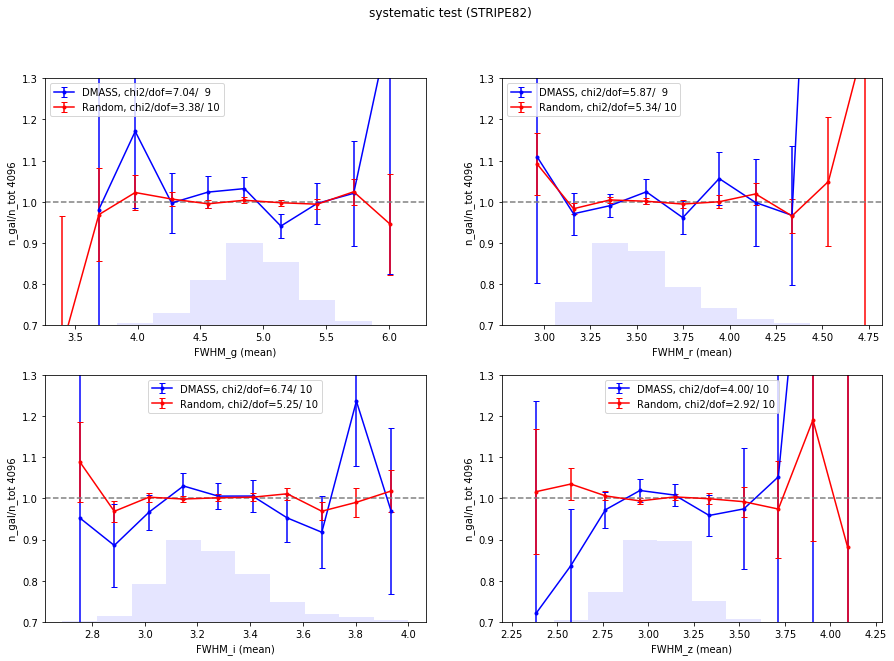

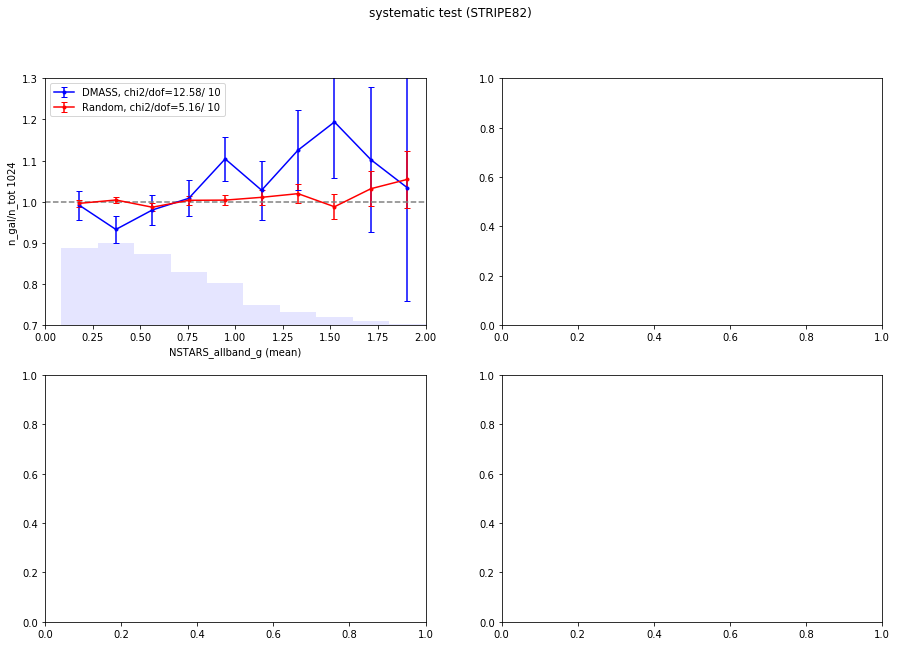

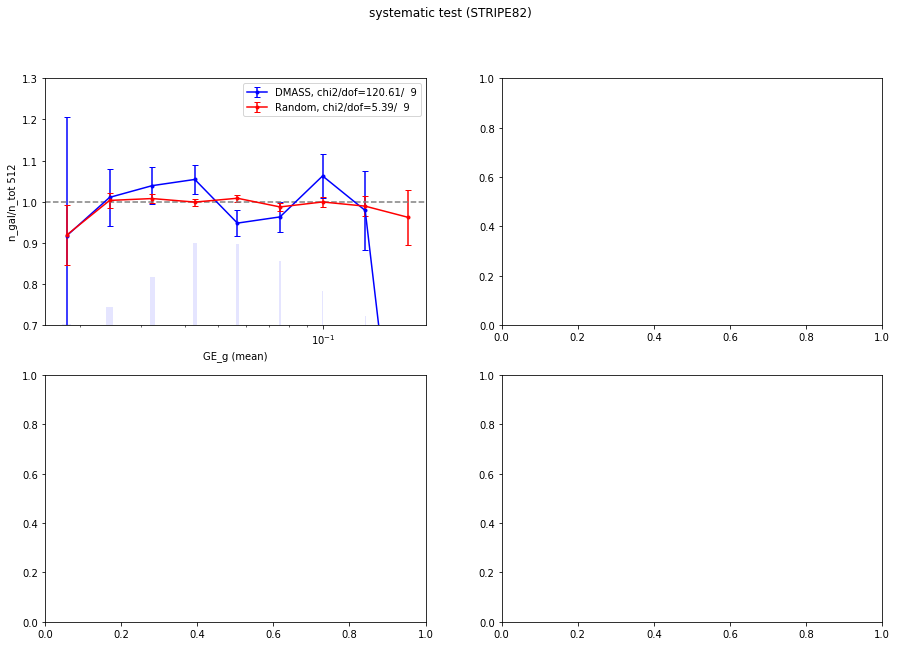

In [63]:
from systematics_module.contCorrection import doVisualization_ngal

for p in properties : 
    doVisualization_ngal(property = p, nside = 4096, kind = kind, suffix='no_weight', \
                         inputdir=inputdir, outdir=figoutdir)

# Correction ! 

### Galactic Extinction

In [83]:
weightDic = {}
weightDic['noweight'] = np.ones(dmass_masked.size)
all_weight = weightmultiply(weightDic)
suffix = 'no_weight'
nextweight = 'FWHM_r'

['noweight']
noweight


-------------------------
 iteration - 0
 nextweight FWHM_r
-------------------------
['noweight']
noweight
----------------------------------
initialize function  FWHM_r
linear


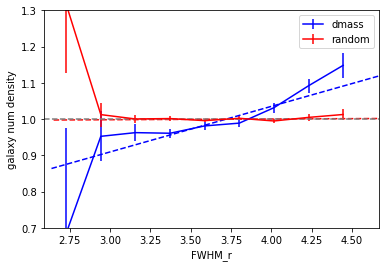

store weight  FWHM_r
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_fwhm_r_SPT.fits
suffix =  wg_fwhm_r
chi2_null =  5.871294651160414
chi2_mod. =  3.976790834867444
Delta chi2 (sample) = 1.8945038162929704
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r.txt.model

chi2_null =  4.190740713380861
chi2_mod. =  2.365663706266617
Delta chi2 (sample) = 1.8250770071142441
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r.txt.model

chi2_null =  4.692735937550853
chi2_mod. =  2.688061979053562
Delta chi2 (sample) = 2.004673958497291
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r.txt.model

chi2_null =  6.892143524993663
chi2_mod. =  6.820300580957116
Delta chi2 (sample) = 0.0718429440365469
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_z_SPT_wg_fwhm_r.txt.model

chi2_null =  7.491904417075956
chi2_mod. =  5.33822679025374
Delta chi

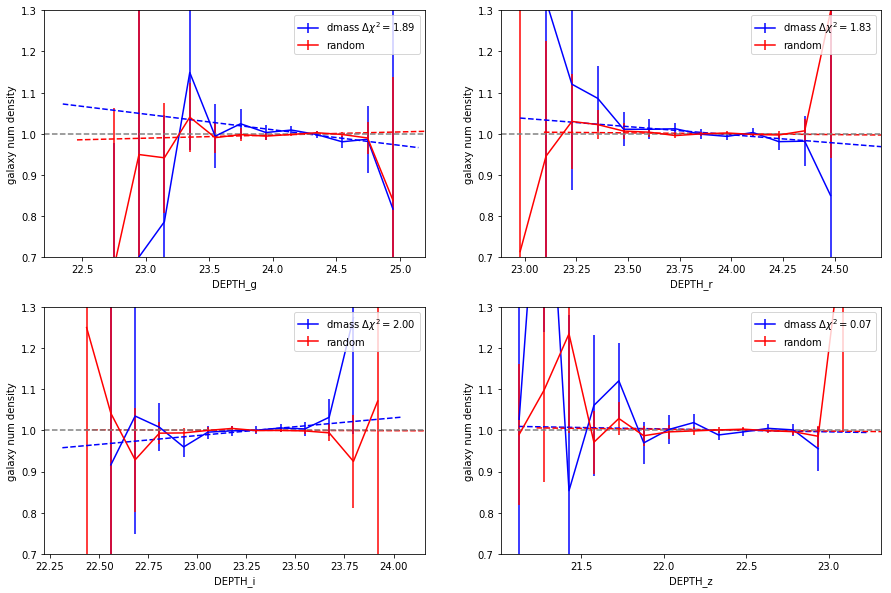

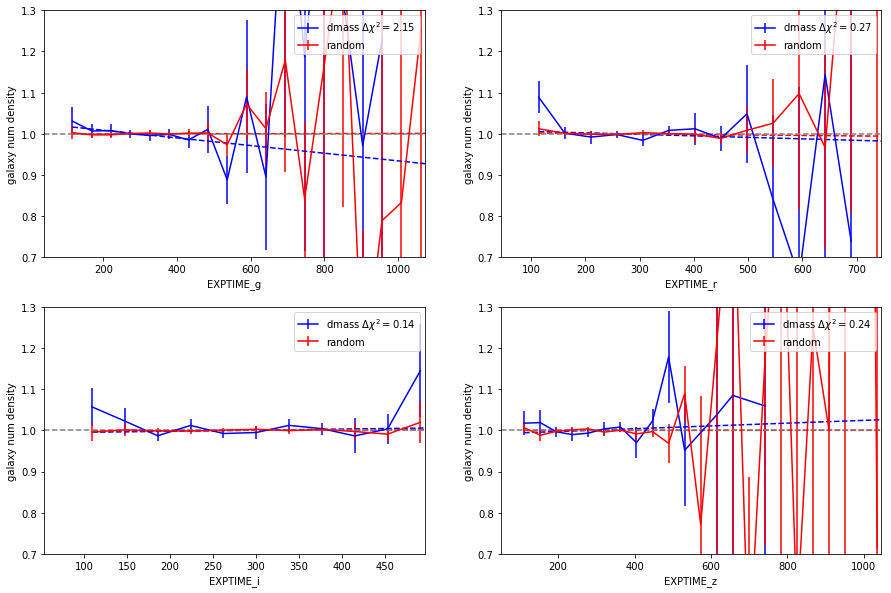

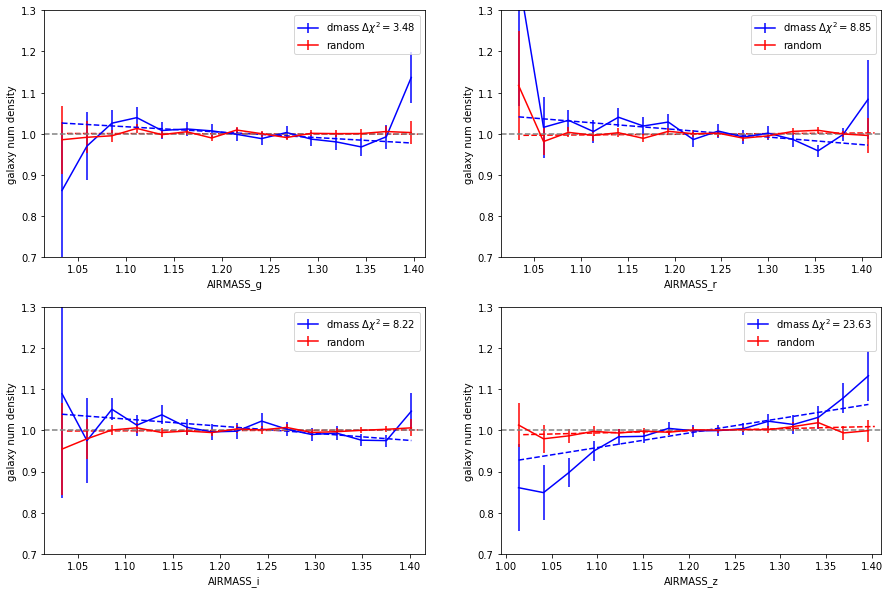

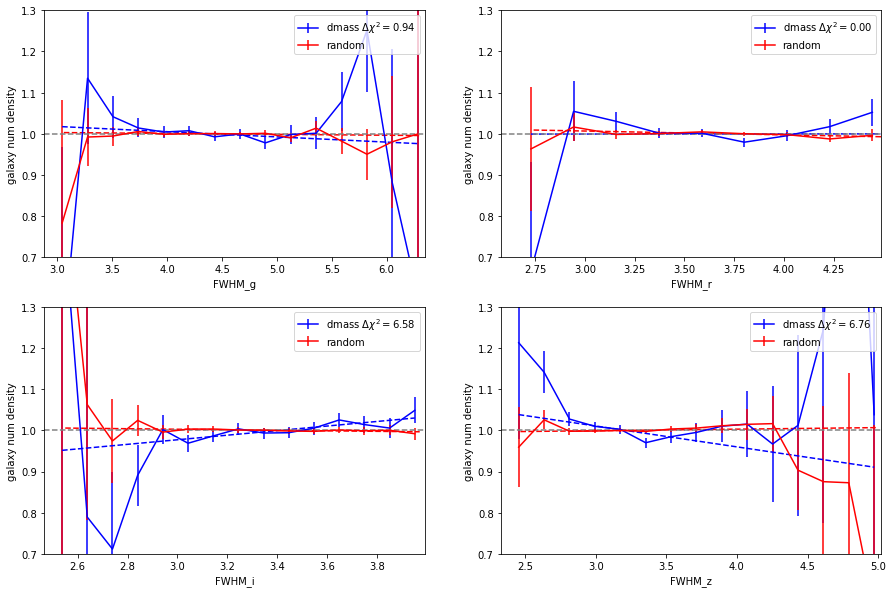

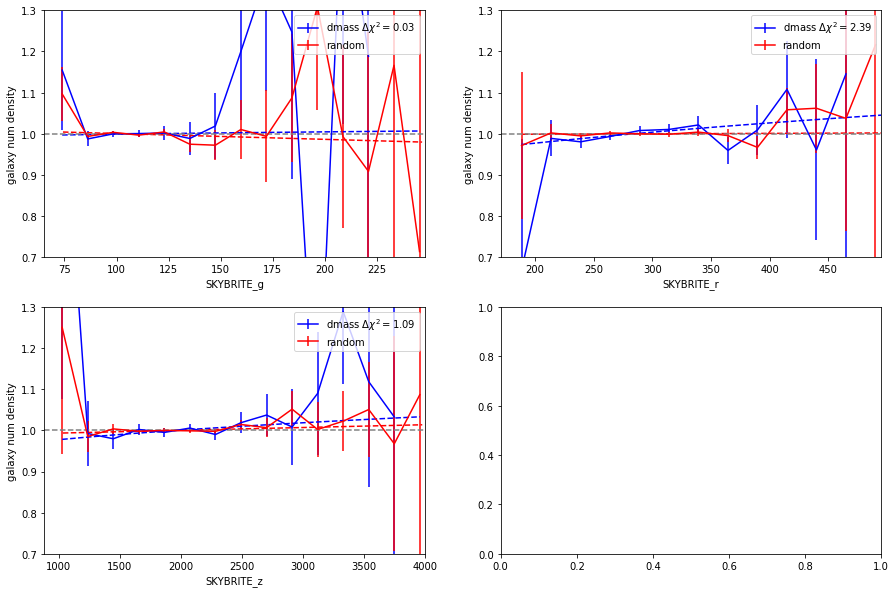

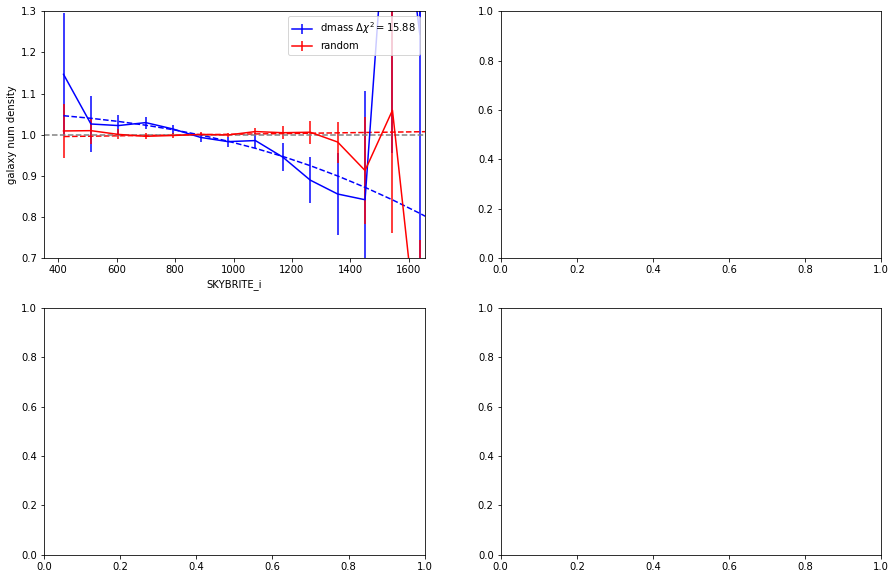

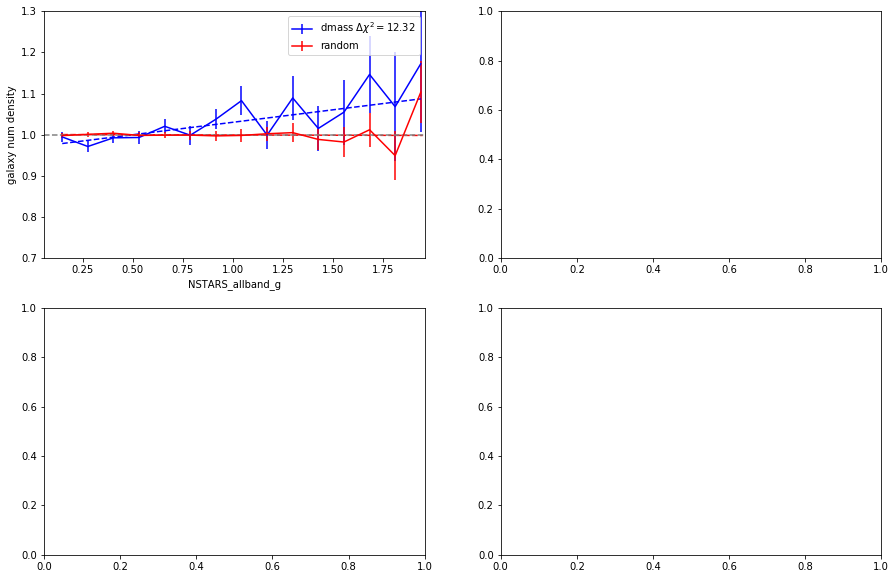

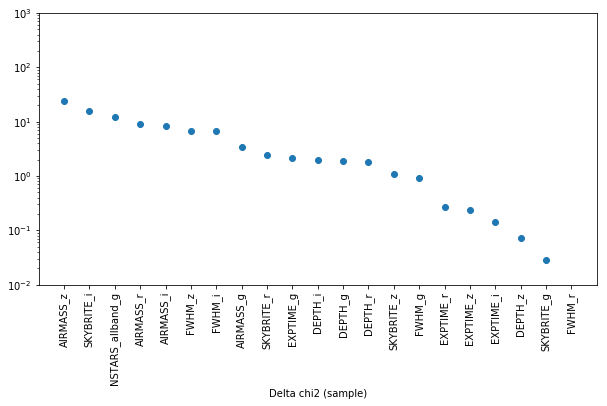

-------------------------
 iteration - 1
 nextweight AIRMASS_z
-------------------------
['noweight', 'FWHM_r']
noweight
FWHM_r
----------------------------------
initialize function  AIRMASS_z
linear


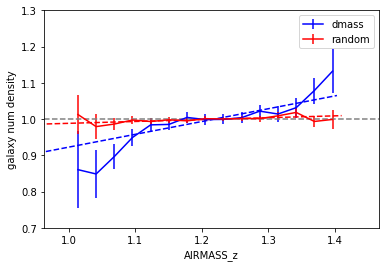

store weight  AIRMASS_z
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_airmass_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z
chi2_null =  7.086088480070617
chi2_mod. =  4.56146111809125
Delta chi2 (sample) = 2.524627361979367
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  5.4163338915643875
chi2_mod. =  1.9423919545977149
Delta chi2 (sample) = 3.4739419369666726
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  4.76935857981427
chi2_mod. =  2.71843213587449
Delta chi2 (sample) = 2.05092644393978
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  7.086984535550509
chi2_mod. =  6.344987741844671
Delta chi2 (sample) = 0.7419967937058383
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  8.06

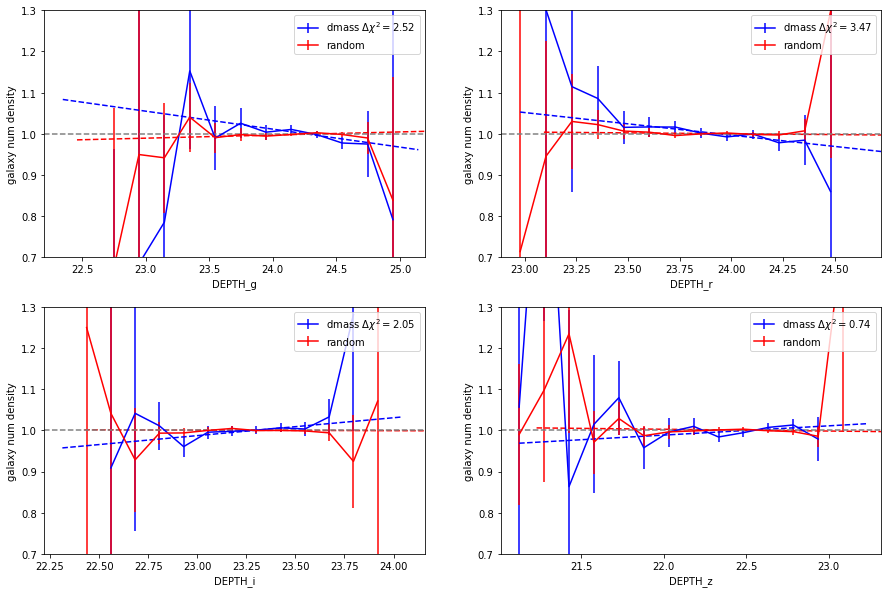

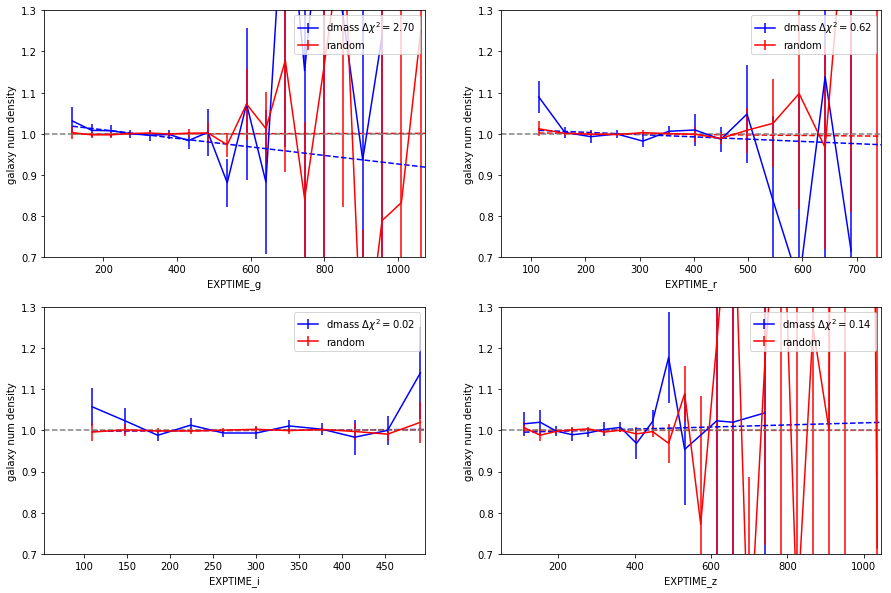

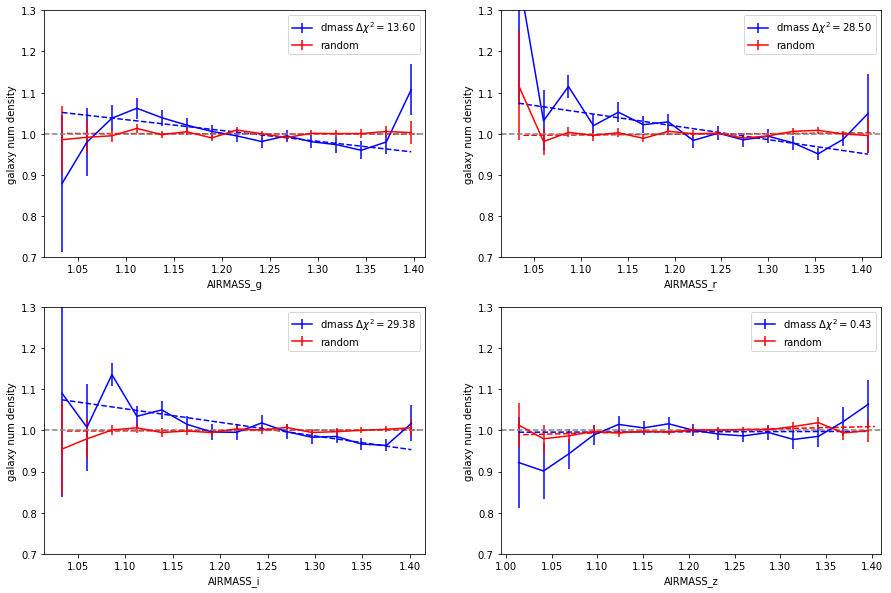

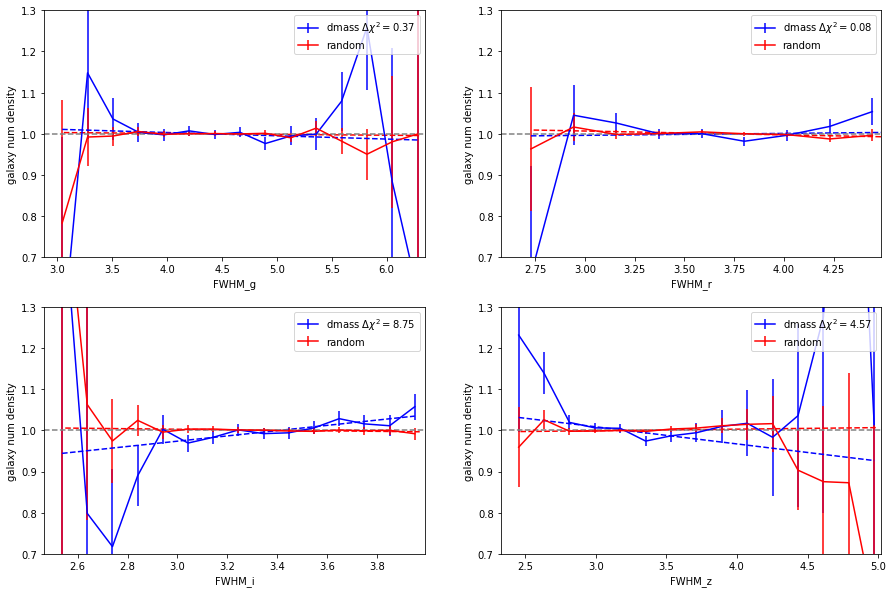

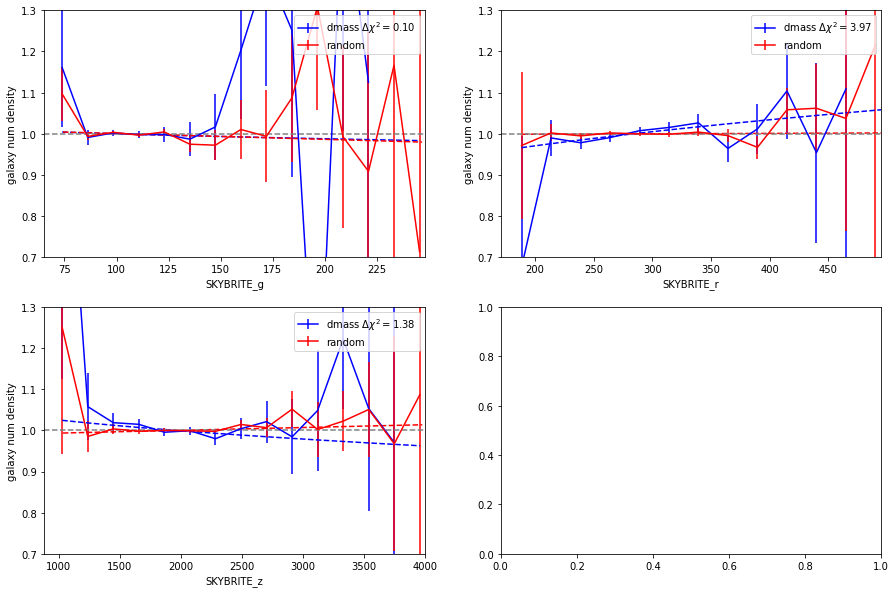

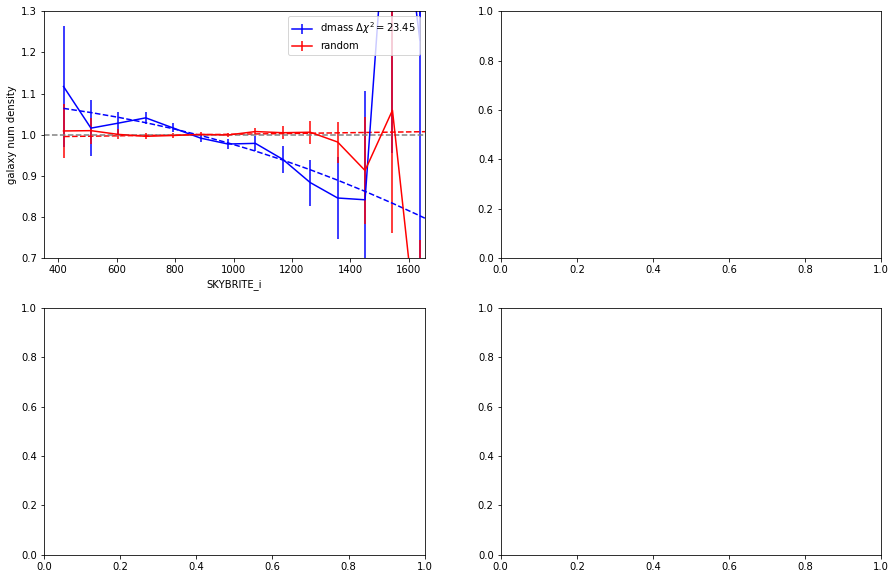

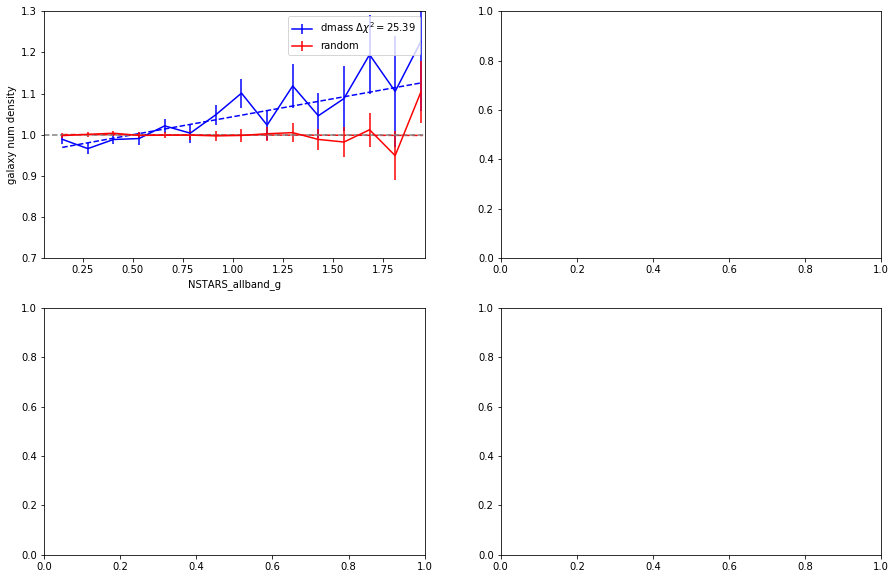

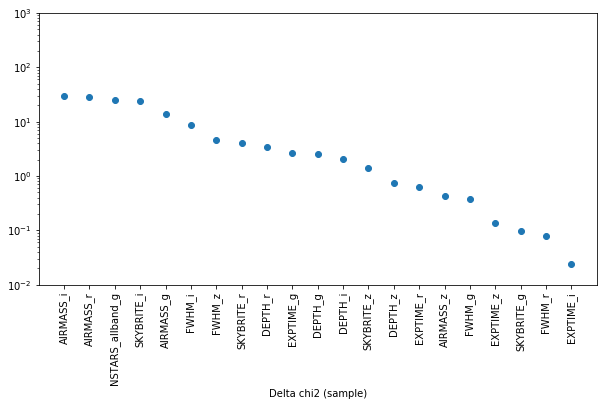

-------------------------
 iteration - 2
 nextweight AIRMASS_i
-------------------------
['noweight', 'AIRMASS_z', 'FWHM_r']
noweight
AIRMASS_z
FWHM_r
----------------------------------
initialize function  AIRMASS_i
linear


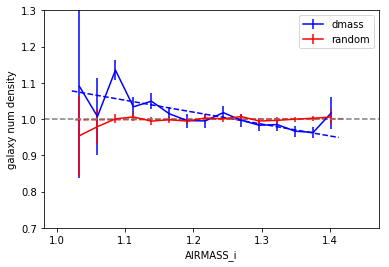

store weight  AIRMASS_i
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_airmass_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i
chi2_null =  5.282464199871892
chi2_mod. =  4.24580425195175
Delta chi2 (sample) = 1.0366599479201426
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i.txt.model

chi2_null =  3.4070808438010585
chi2_mod. =  2.0719281188716194
Delta chi2 (sample) = 1.335152724929439
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i.txt.model

chi2_null =  3.352372782057051
chi2_mod. =  2.664212157578379
Delta chi2 (sample) = 0.6881606244786722
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i.txt.model

chi2_null =  6.503431563741226
chi2_mod. =  6.273196235708901
Delta chi2 (sample) = 0.23023532803232527
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_z_SPT_wg_

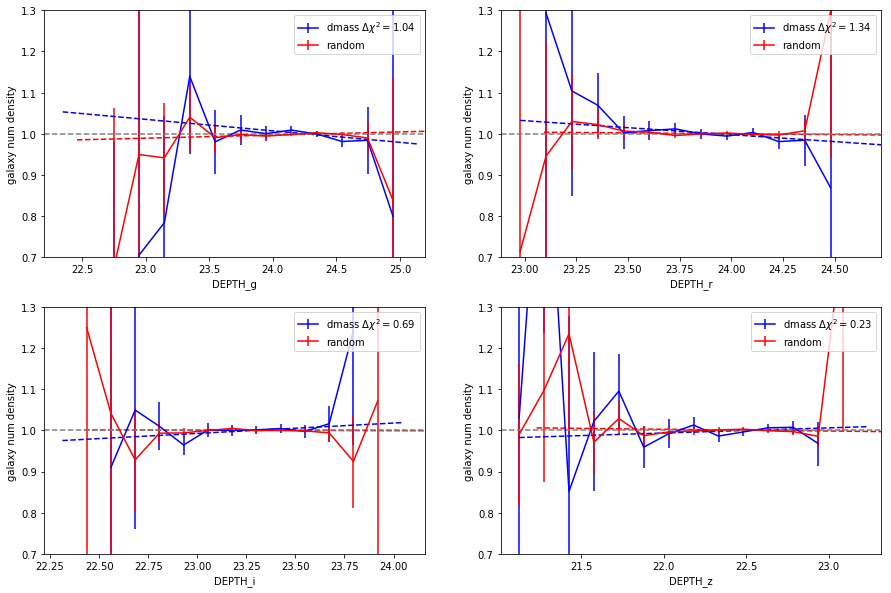

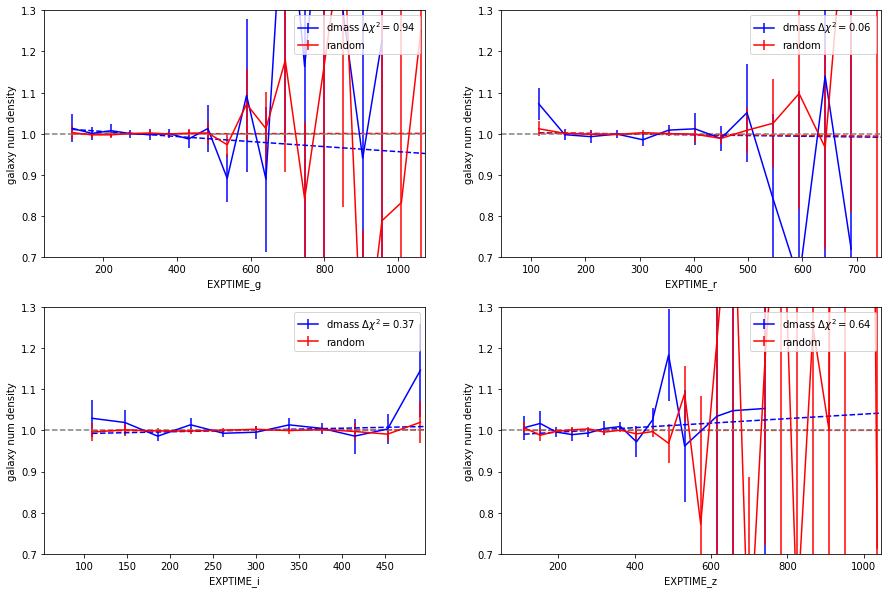

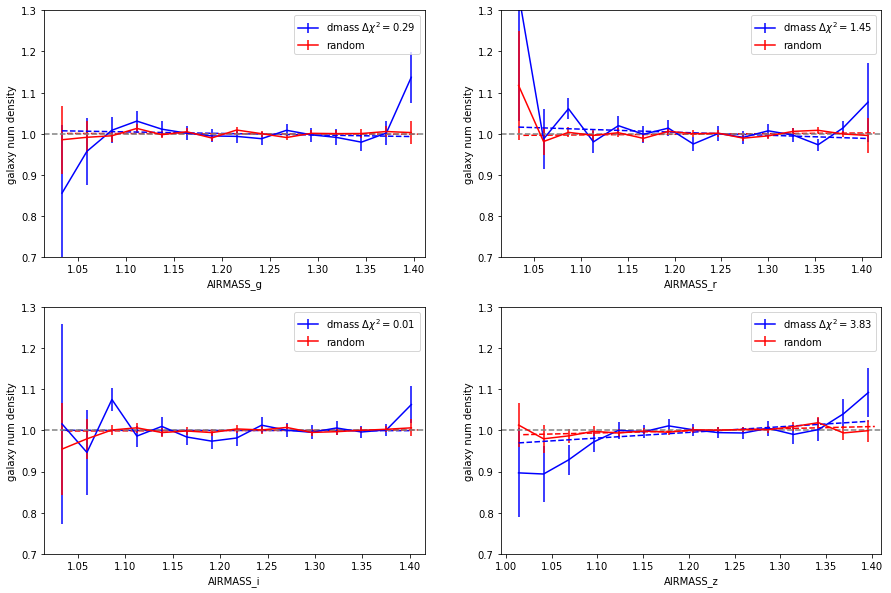

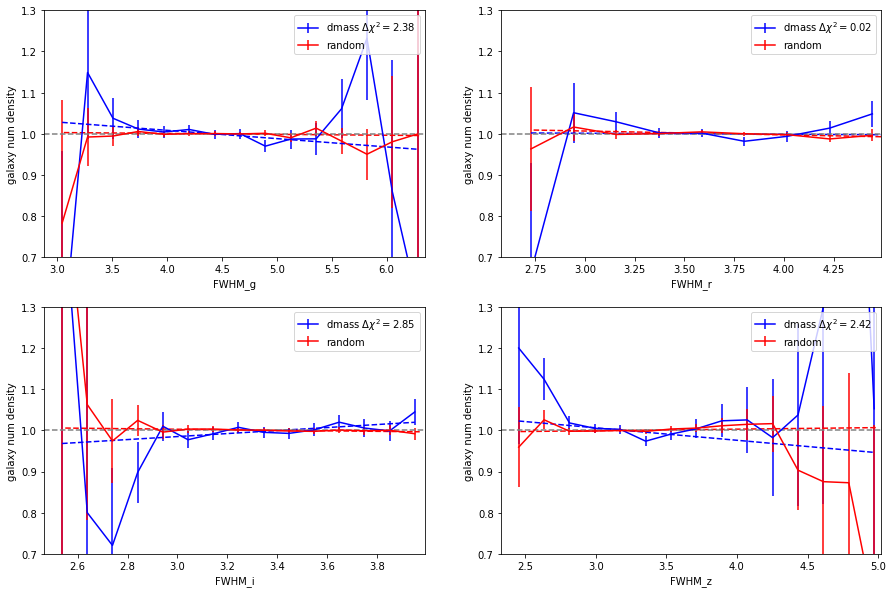

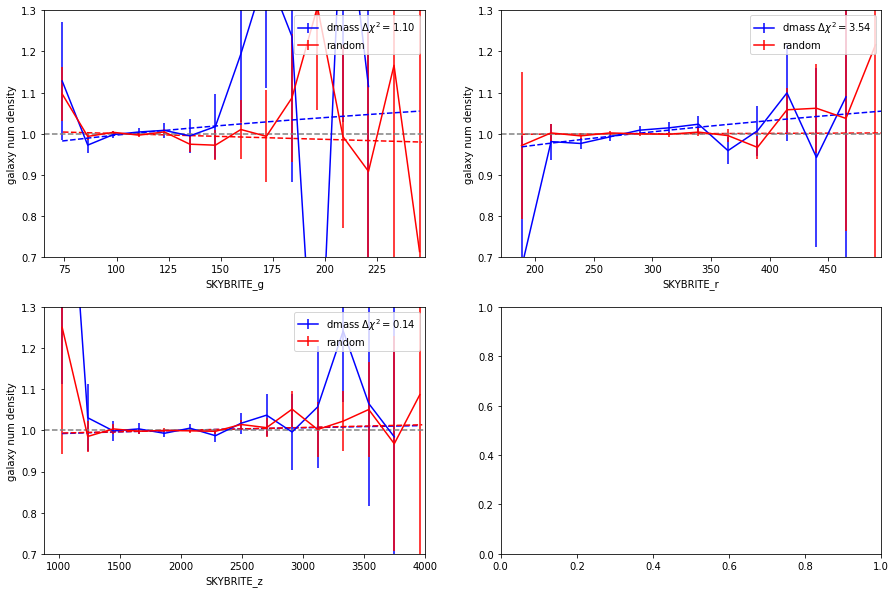

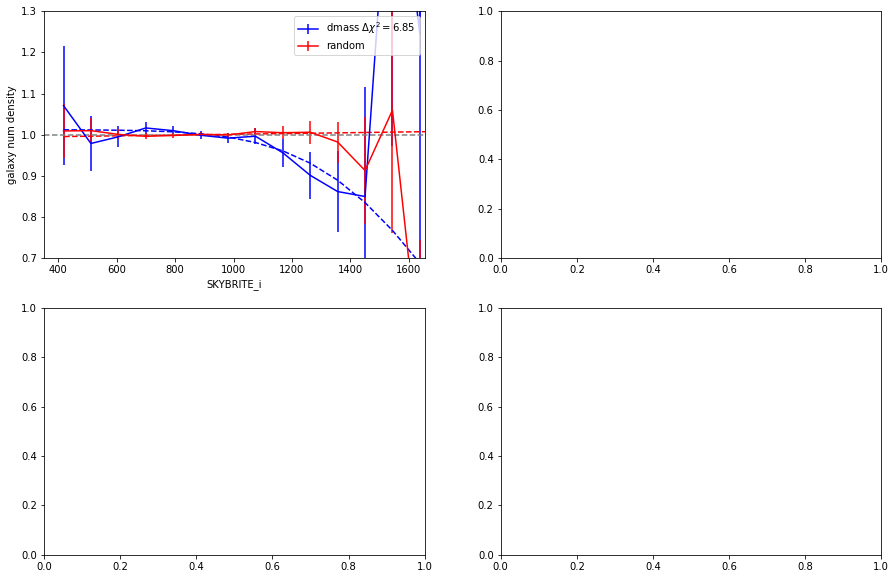

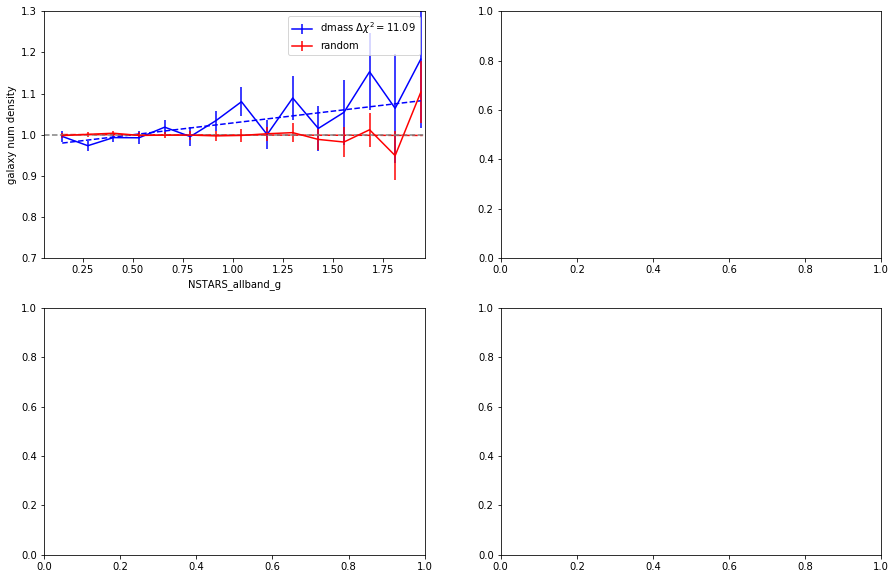

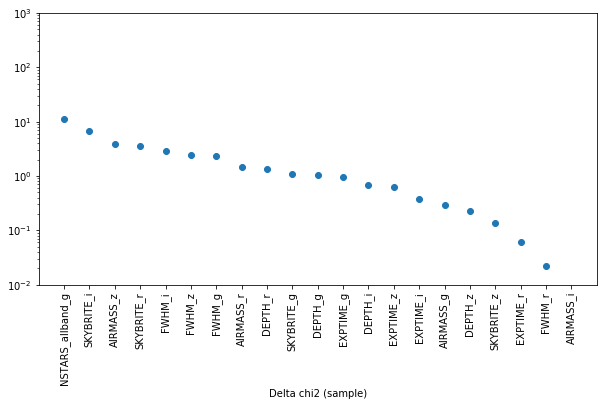

-------------------------
 iteration - 3
 nextweight NSTARS_allband_g
-------------------------
['noweight', 'AIRMASS_z', 'AIRMASS_i', 'FWHM_r']
noweight
AIRMASS_z
AIRMASS_i
FWHM_r
----------------------------------
initialize function  NSTARS_allband_g
linear


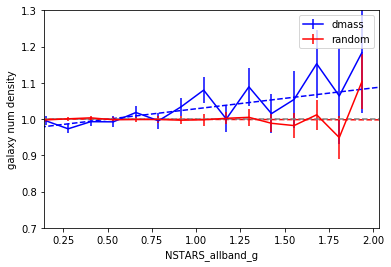

store weight  NSTARS_allband_g
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_nstars_allband_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g
chi2_null =  5.290993220377446
chi2_mod. =  5.11524967968201
Delta chi2 (sample) = 0.17574354069543663
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g.txt.model

chi2_null =  2.807438313684321
chi2_mod. =  2.805378973057493
Delta chi2 (sample) = 0.00205934062682811
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g.txt.model

chi2_null =  10.411930894567277
chi2_mod. =  2.9719700044205055
Delta chi2 (sample) = 7.4399608901467715
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g.txt.model

chi2_null =  9.701771104869605
chi2_mod. =  6.29439736366116
Delta chi2 (sample) = 3.40737374120844

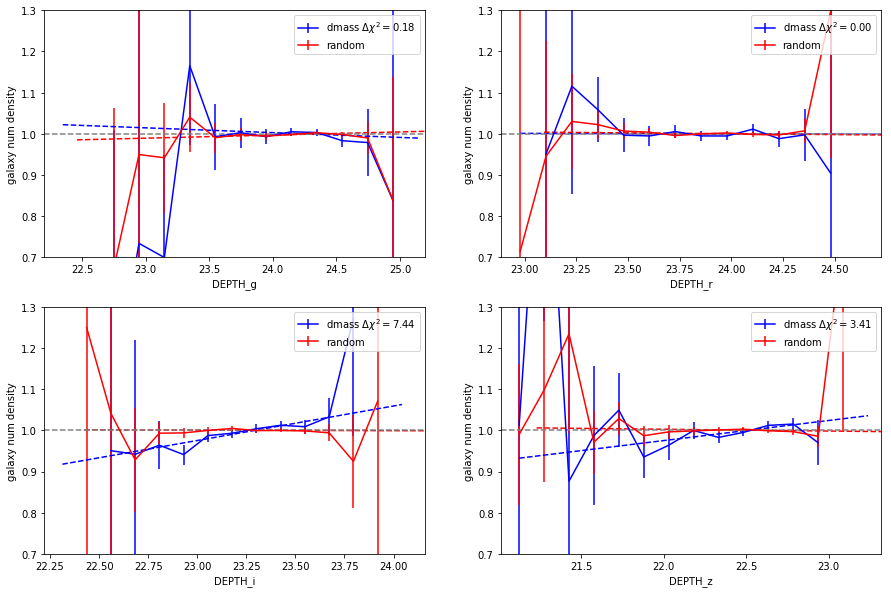

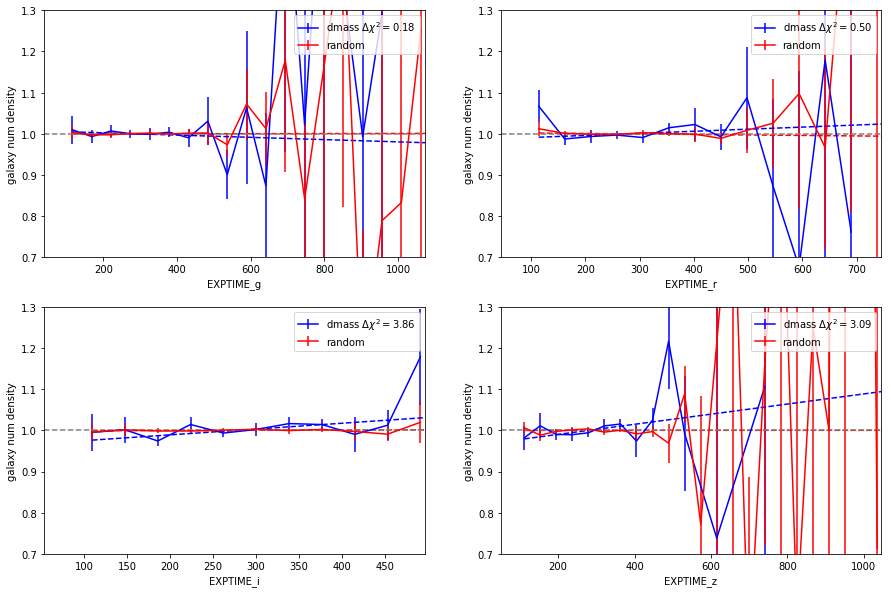

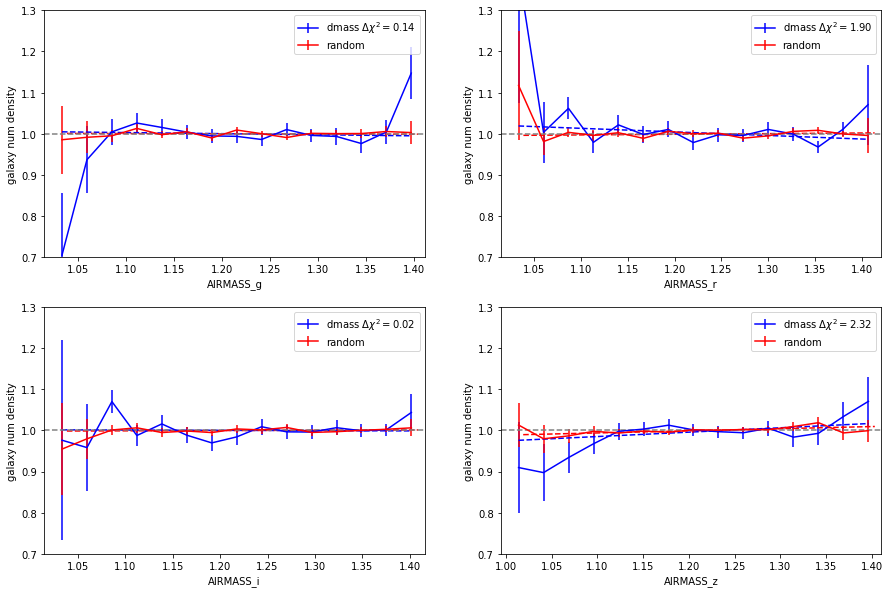

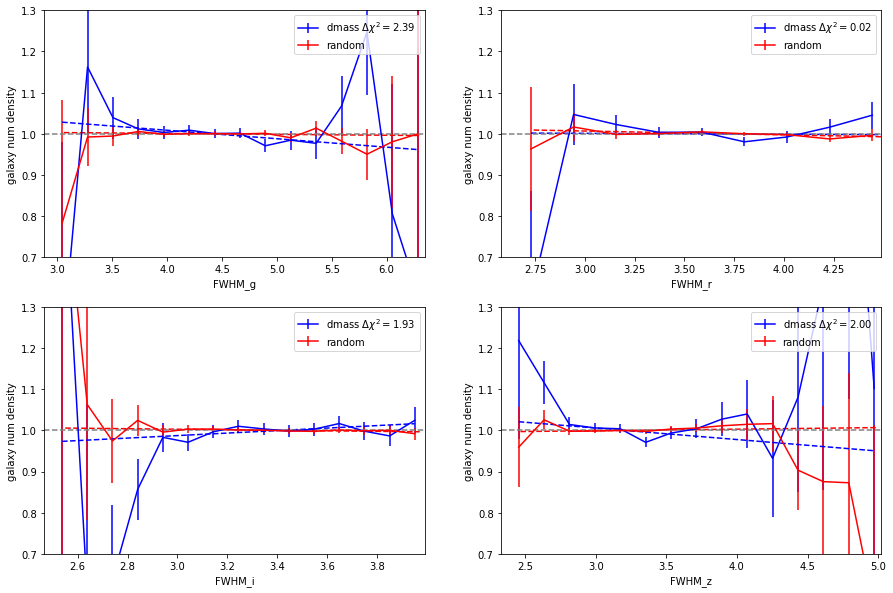

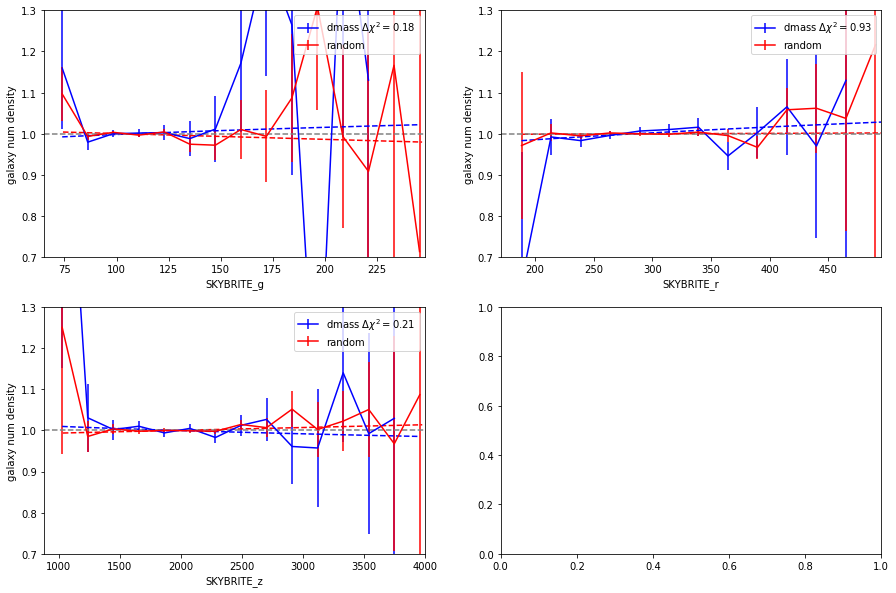

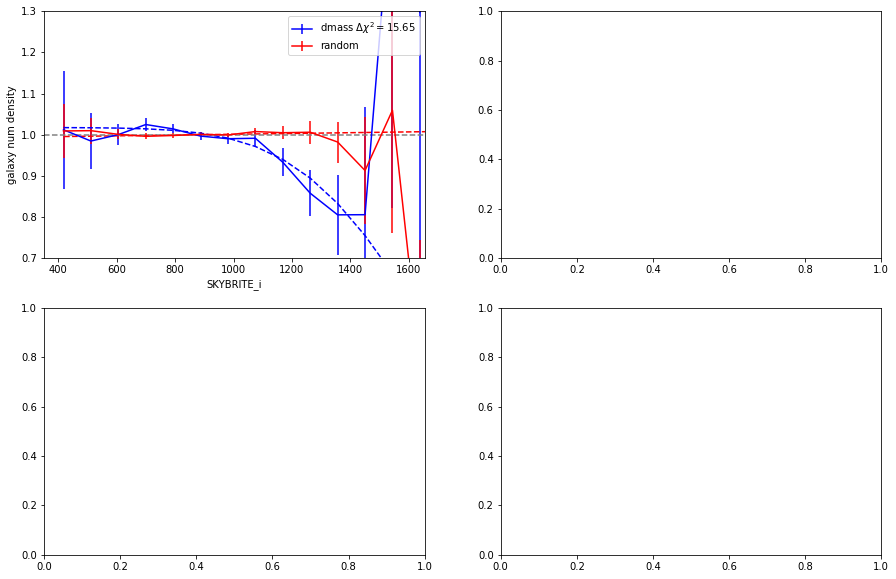

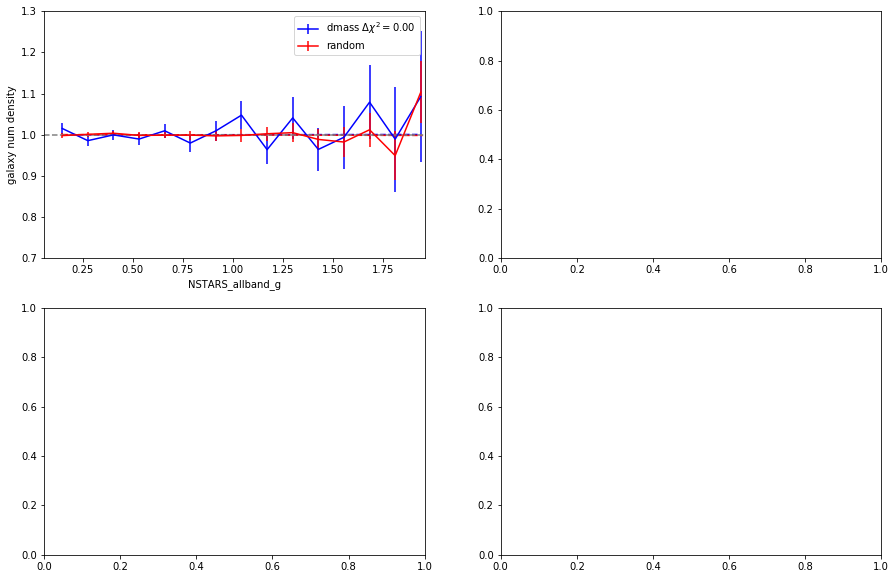

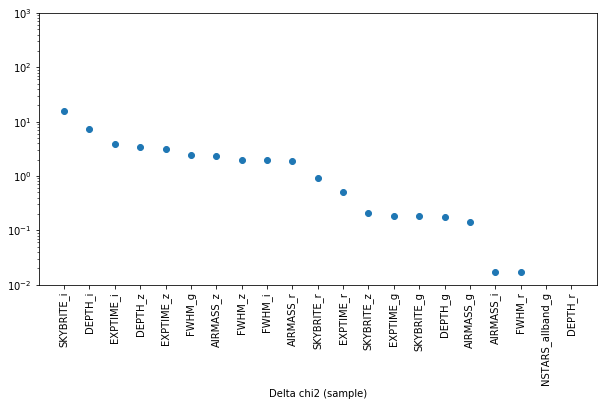

-------------------------
 iteration - 4
 nextweight SKYBRITE_i
-------------------------
['noweight', 'AIRMASS_z', 'NSTARS_allband_g', 'AIRMASS_i', 'FWHM_r']
noweight
AIRMASS_z
NSTARS_allband_g
AIRMASS_i
FWHM_r
----------------------------------
initialize function  SKYBRITE_i
errftn


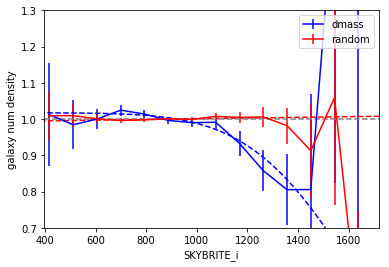

store weight  SKYBRITE_i
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_skybrite_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i
chi2_null =  5.3012542757106065
chi2_mod. =  5.097977723276177
Delta chi2 (sample) = 0.20327655243442955
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i.txt.model

chi2_null =  2.6805691748911538
chi2_mod. =  2.6234853782262126
Delta chi2 (sample) = 0.05708379666494112
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i.txt.model

chi2_null =  3.7727101149635955
chi2_mod. =  2.120614493040814
Delta chi2 (sample) = 1.6520956219227814
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i.txt.model

chi2_null =  8.265485389421599
chi2_mod. =  6.0541940075937015
D

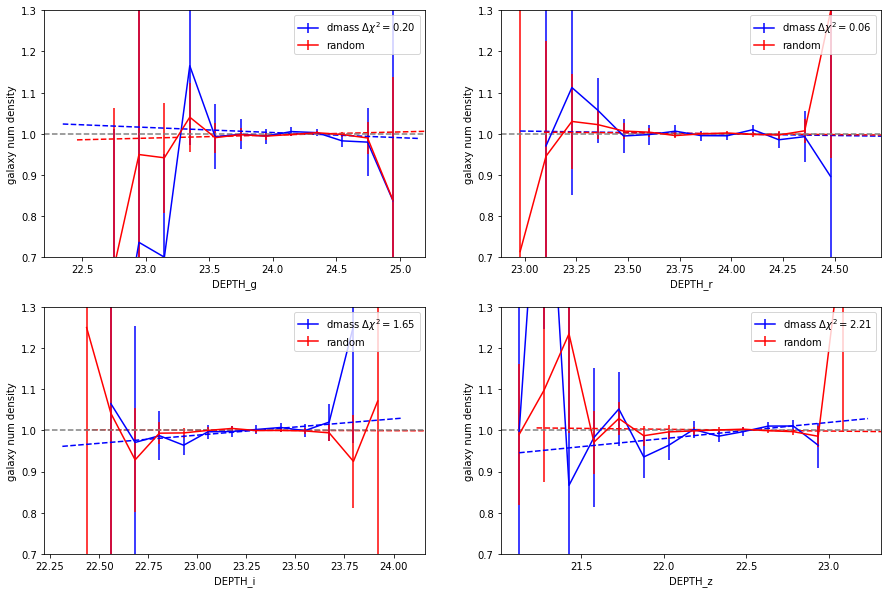

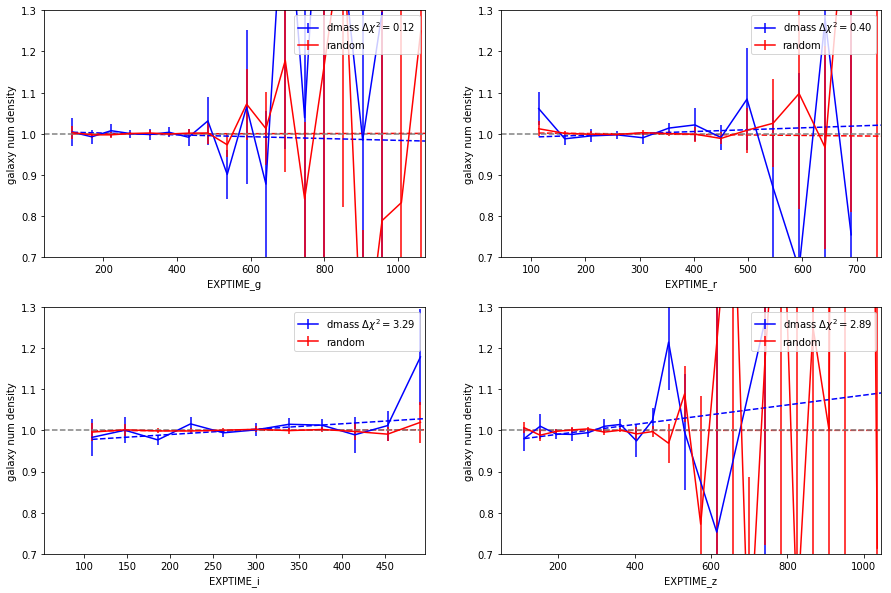

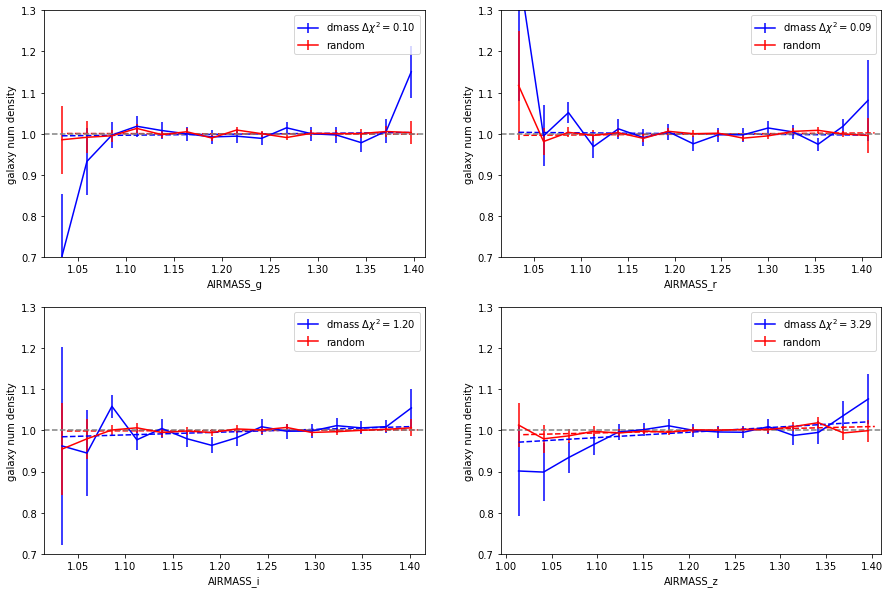

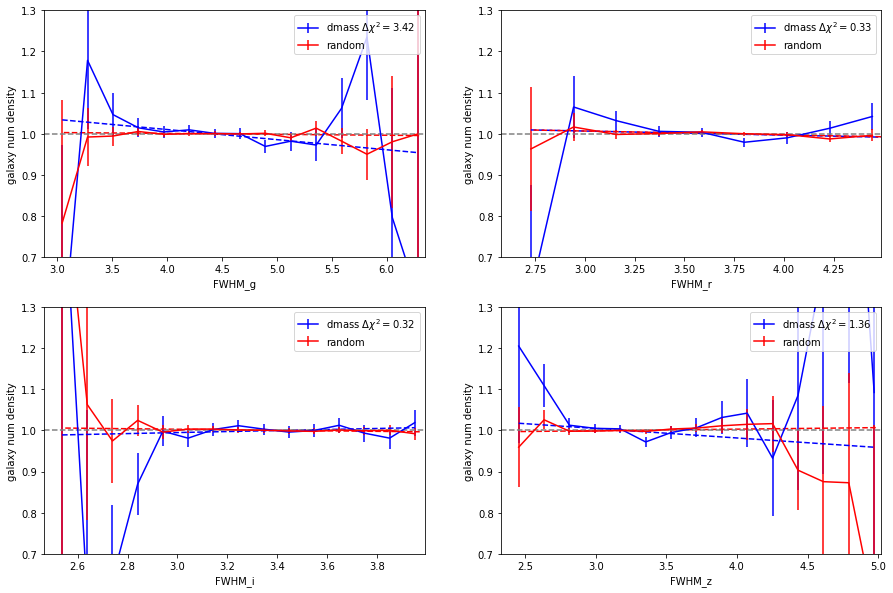

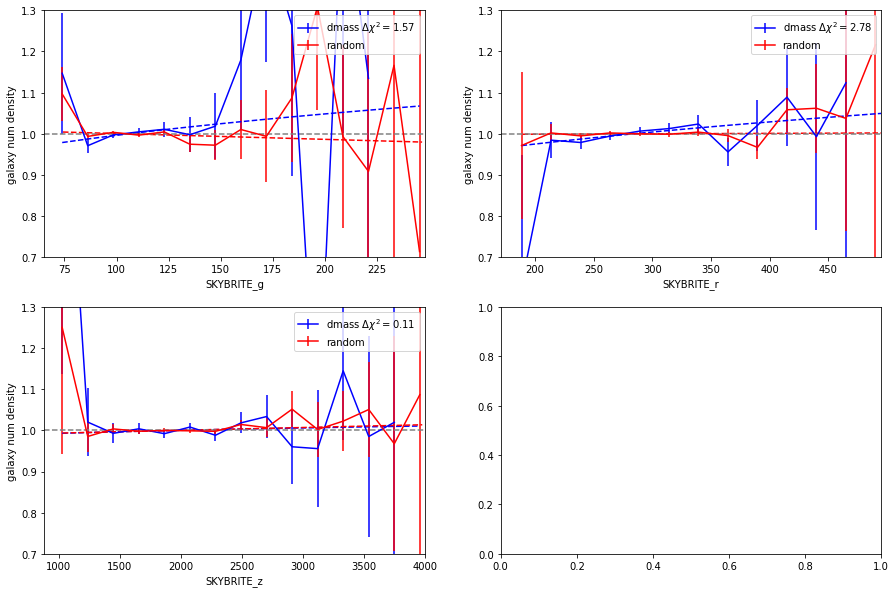

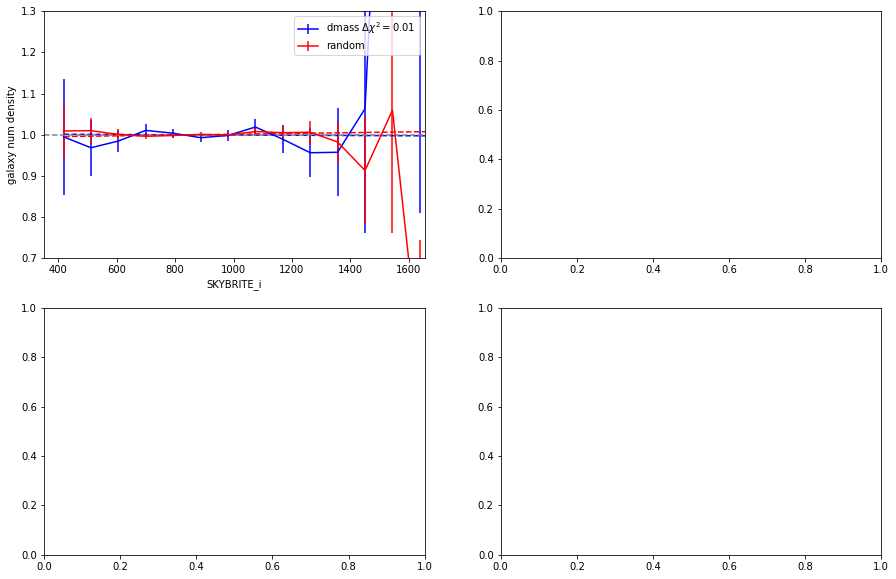

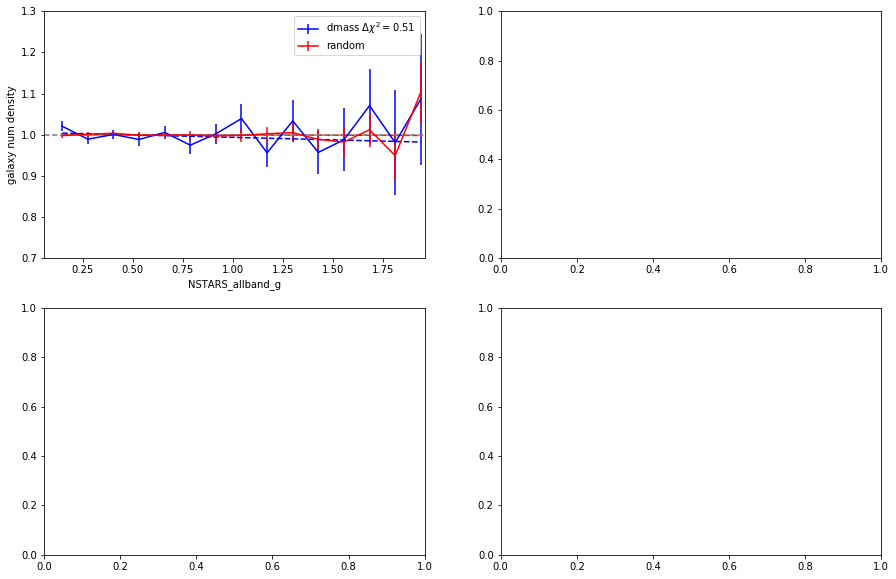

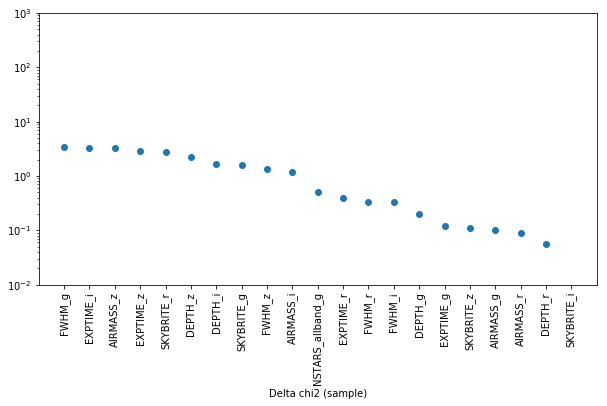

-------------------------
 iteration - 5
 nextweight FWHM_g
-------------------------
['FWHM_r', 'AIRMASS_z', 'noweight', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
FWHM_r
AIRMASS_z
noweight
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  FWHM_g
linear


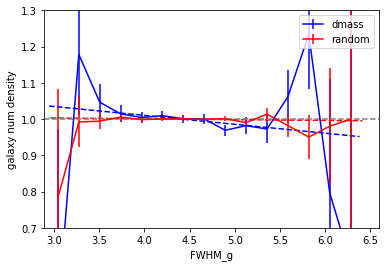

store weight  FWHM_g
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_fwhm_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g
chi2_null =  4.73567463021783
chi2_mod. =  4.612678748731796
Delta chi2 (sample) = 0.12299588148603391
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g.txt.model

chi2_null =  2.7828444594966926
chi2_mod. =  2.5883202267138152
Delta chi2 (sample) = 0.19452423278287734
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g.txt.model

chi2_null =  3.6702234445769486
chi2_mod. =  2.1941246540040646
Delta chi2 (sample) = 1.476098790572884
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g.txt.model

chi2_null =  8.239189637923042
chi2_mod. =  6.

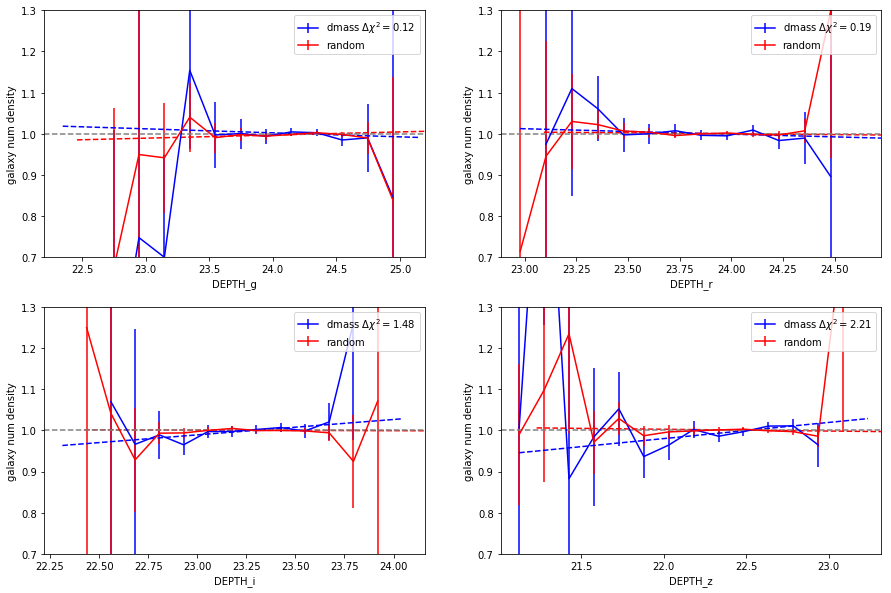

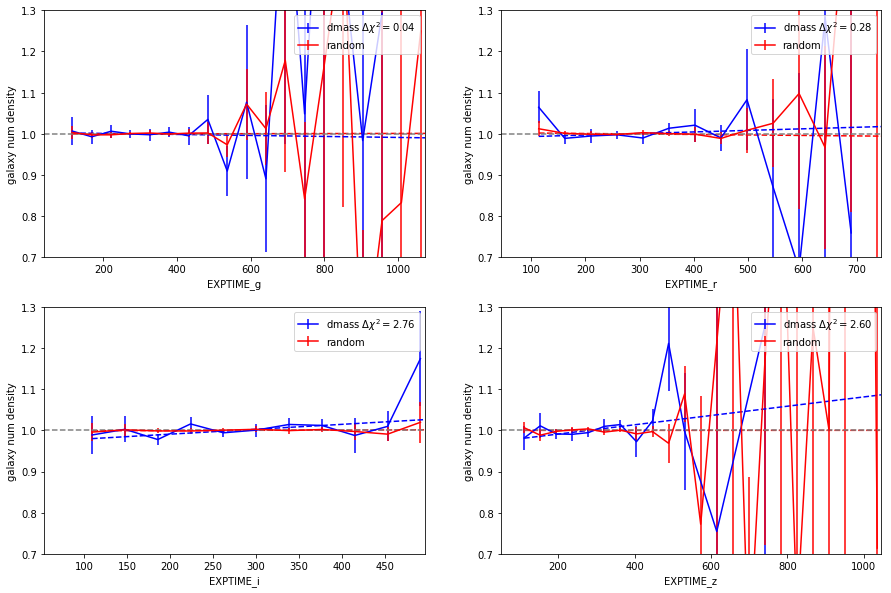

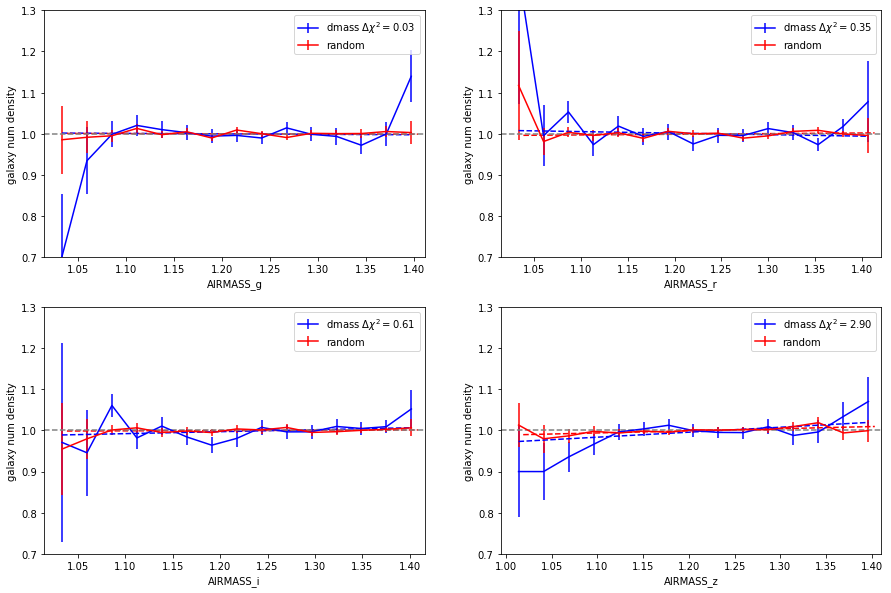

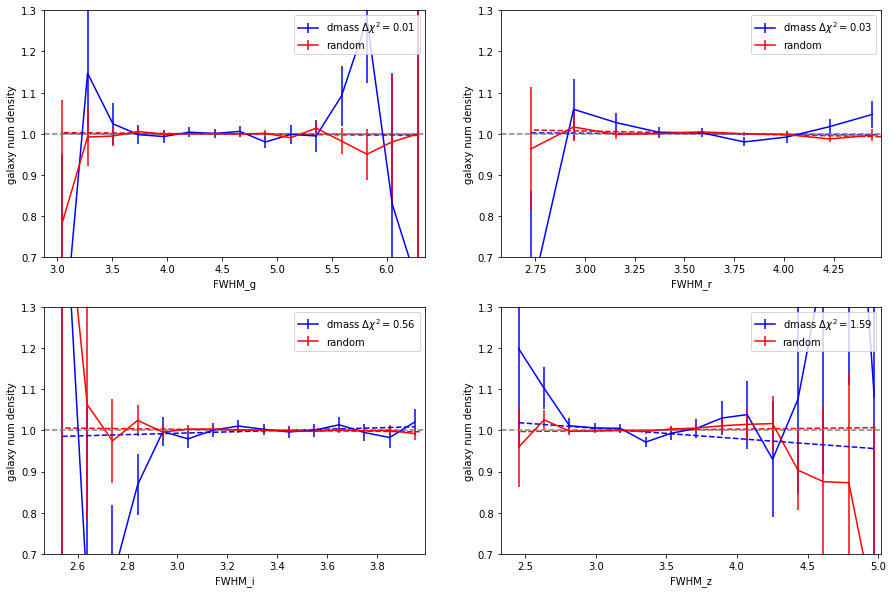

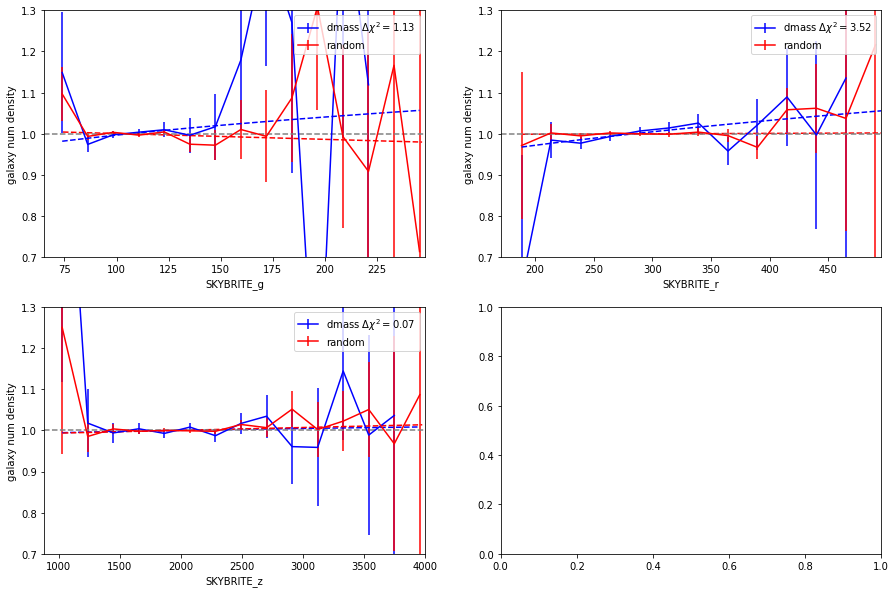

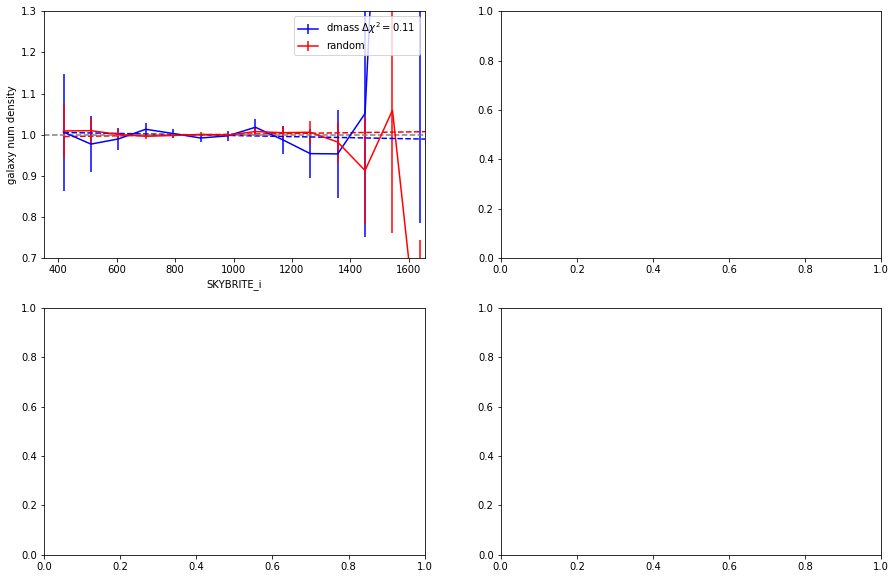

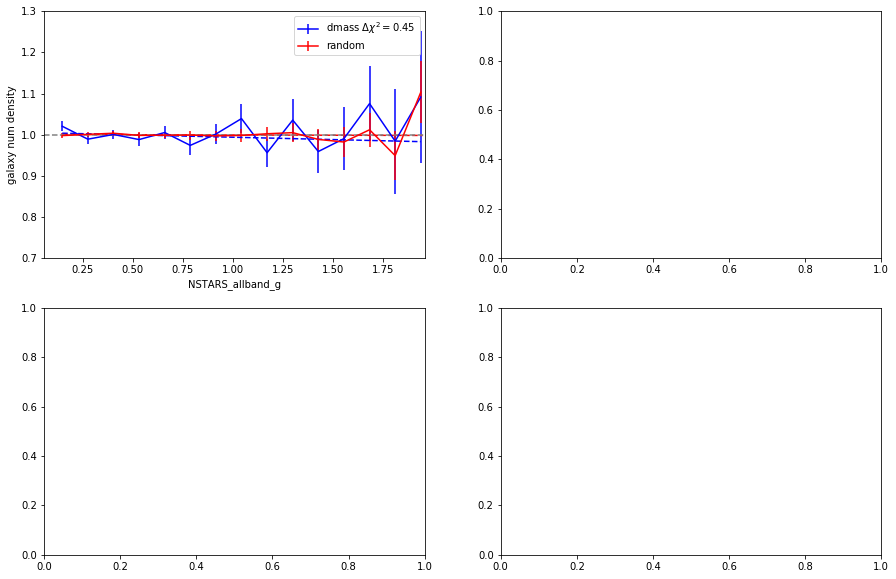

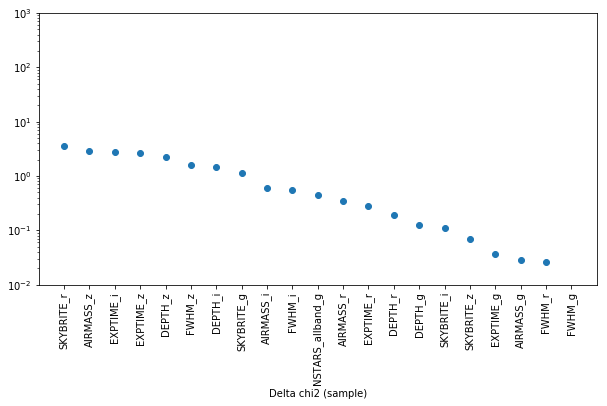

-------------------------
 iteration - 6
 nextweight SKYBRITE_r
-------------------------
['FWHM_g', 'FWHM_r', 'AIRMASS_z', 'noweight', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
FWHM_g
FWHM_r
AIRMASS_z
noweight
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  SKYBRITE_r
linear


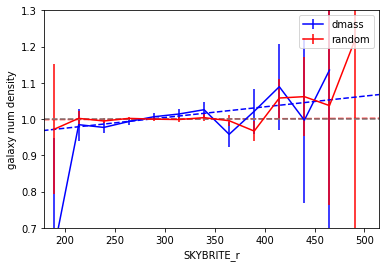

store weight  SKYBRITE_r
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_skybrite_r_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r
chi2_null =  4.6955458438516615
chi2_mod. =  4.693774832104842
Delta chi2 (sample) = 0.001771011746819262
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r.txt.model

chi2_null =  2.620300071061428
chi2_mod. =  2.522803130558269
Delta chi2 (sample) = 0.09749694050315894
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r.txt.model

chi2_null =  4.953626714746038
chi2_mod. =  2.1982868860372147
Delta chi2 (sample) = 2.7553398287088235
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r.txt.

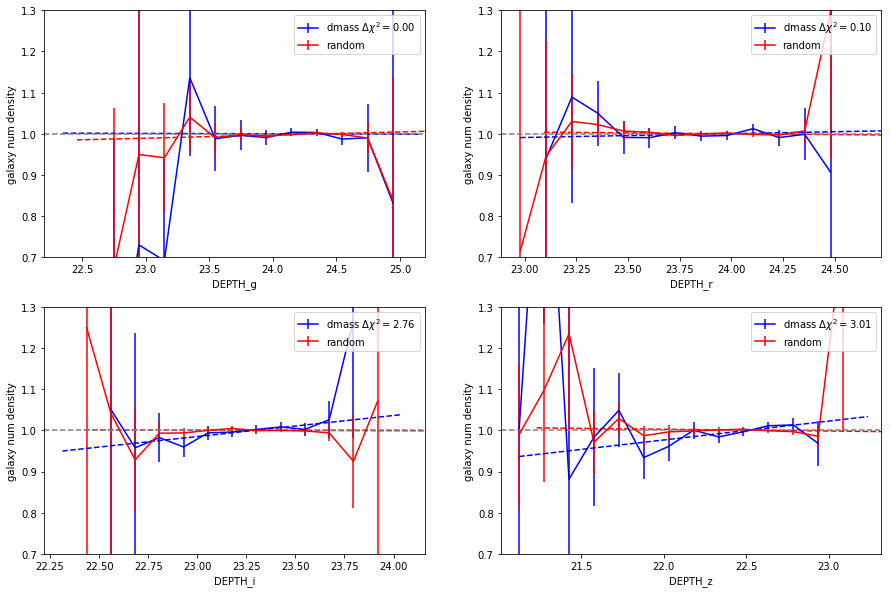

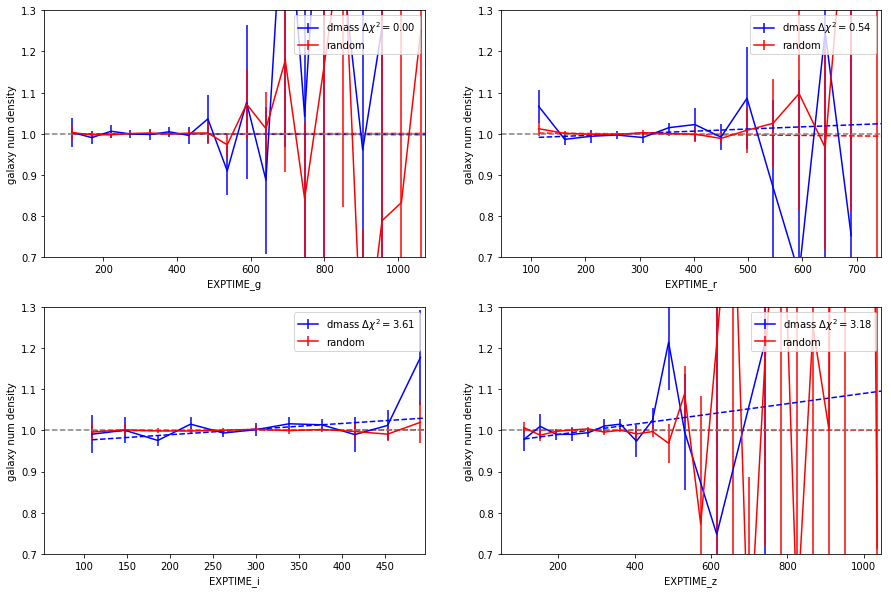

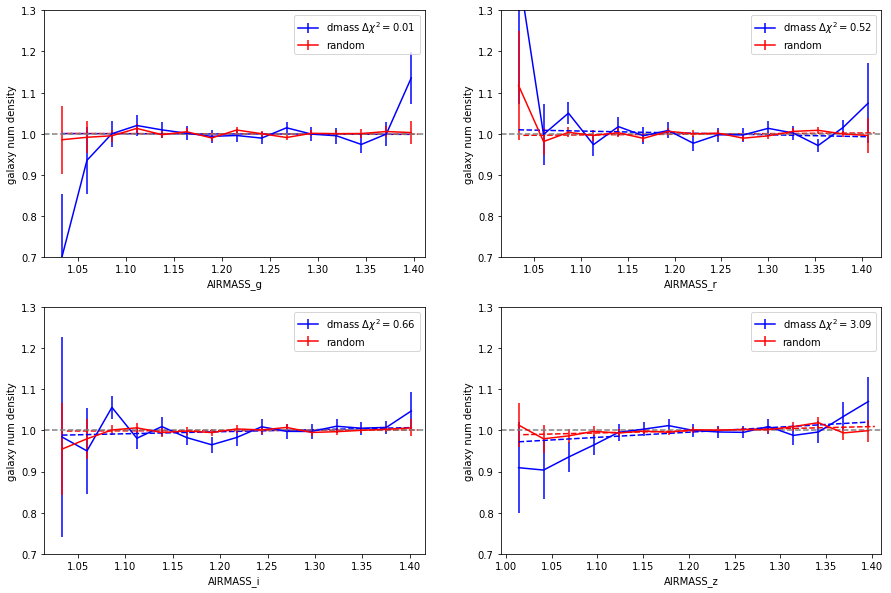

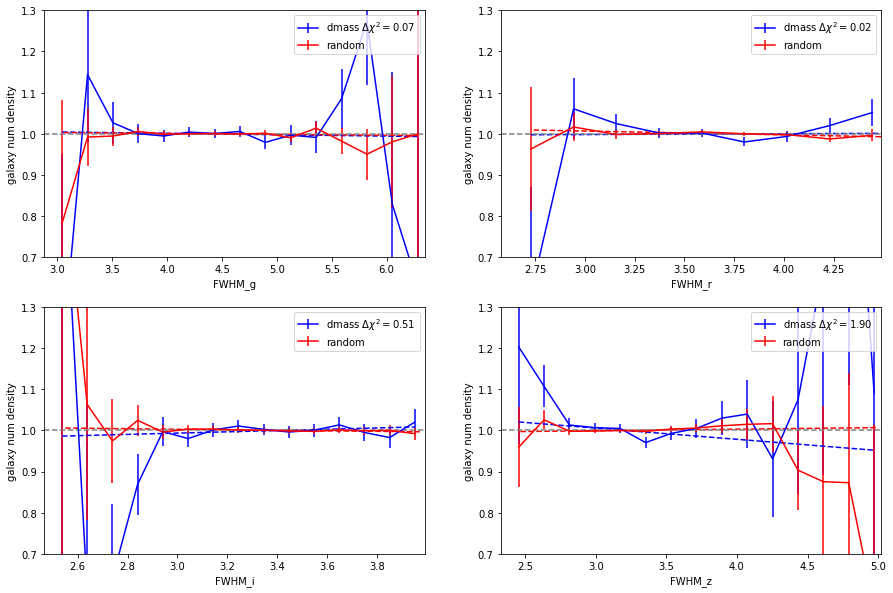

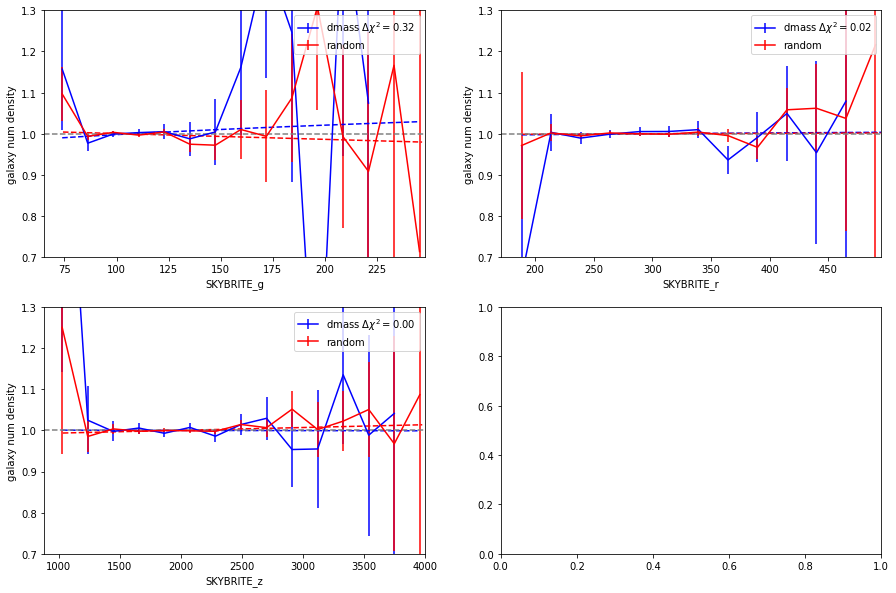

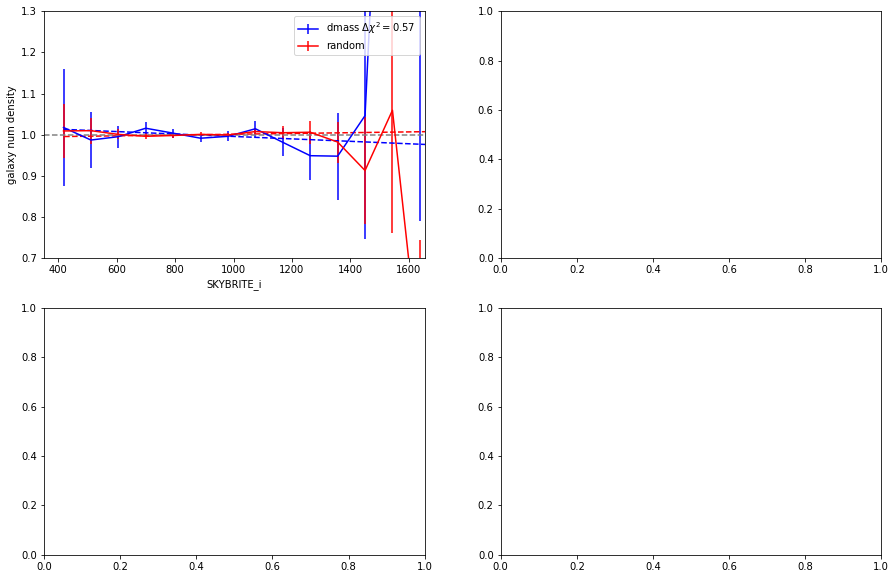

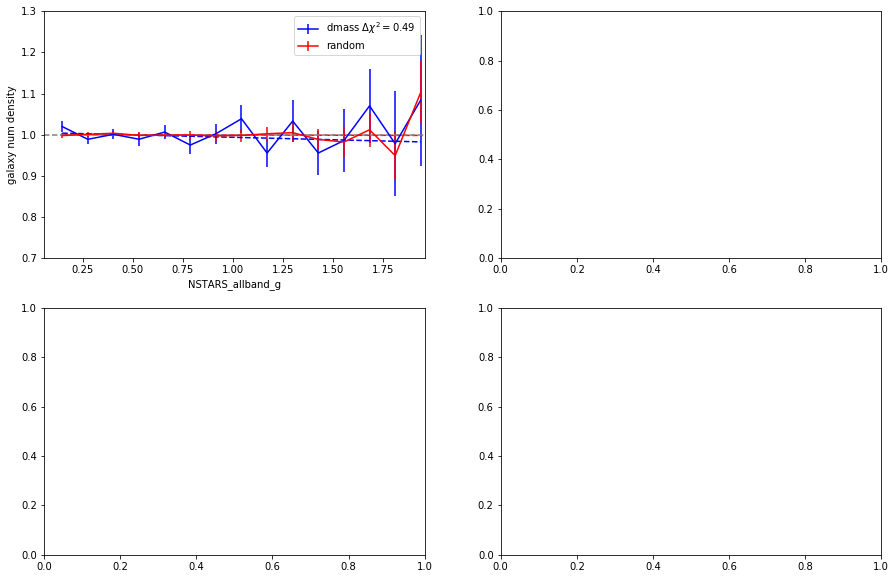

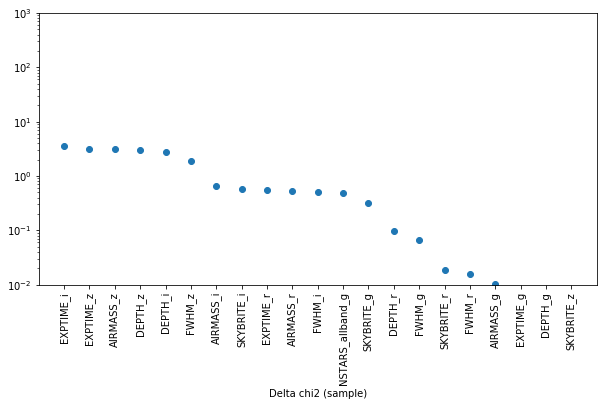

-------------------------
 iteration - 7
 nextweight EXPTIME_i
-------------------------
['SKYBRITE_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'noweight', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
FWHM_g
FWHM_r
AIRMASS_z
noweight
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  EXPTIME_i
linear


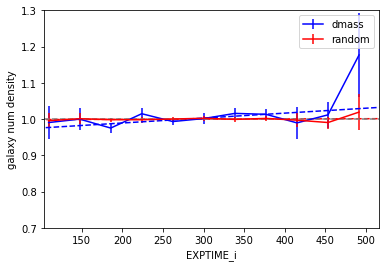

store weight  EXPTIME_i
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_exptime_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i
chi2_null =  6.812414746656657
chi2_mod. =  5.424640762943257
Delta chi2 (sample) = 1.3877739837133998
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i.txt.model

chi2_null =  3.4817297274040118
chi2_mod. =  2.3436708902055523
Delta chi2 (sample) = 1.1380588371984595
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i.txt.model

chi2_null =  2.4838928416079304
chi2_mod. =  2.464620512515296
Delta chi2 (sample) = 0.019272329092634433
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybr

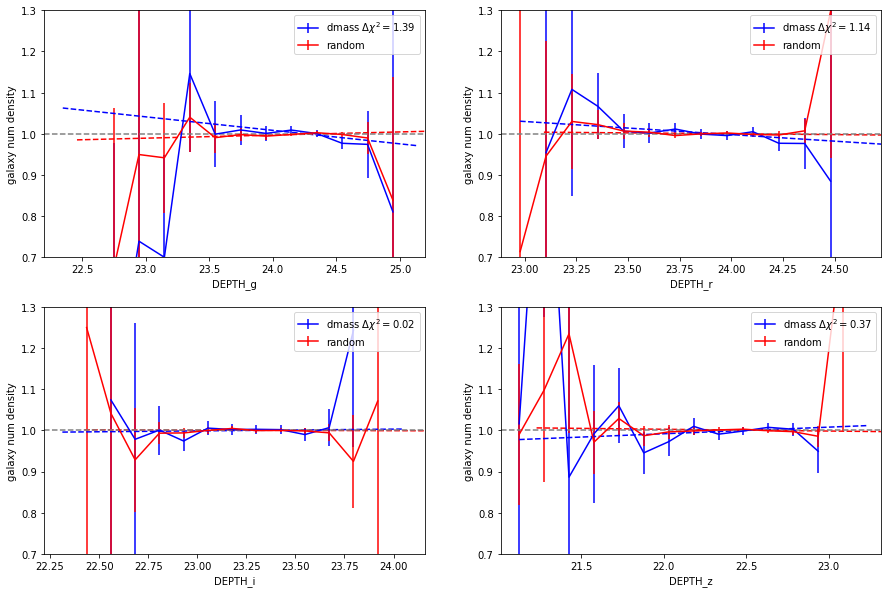

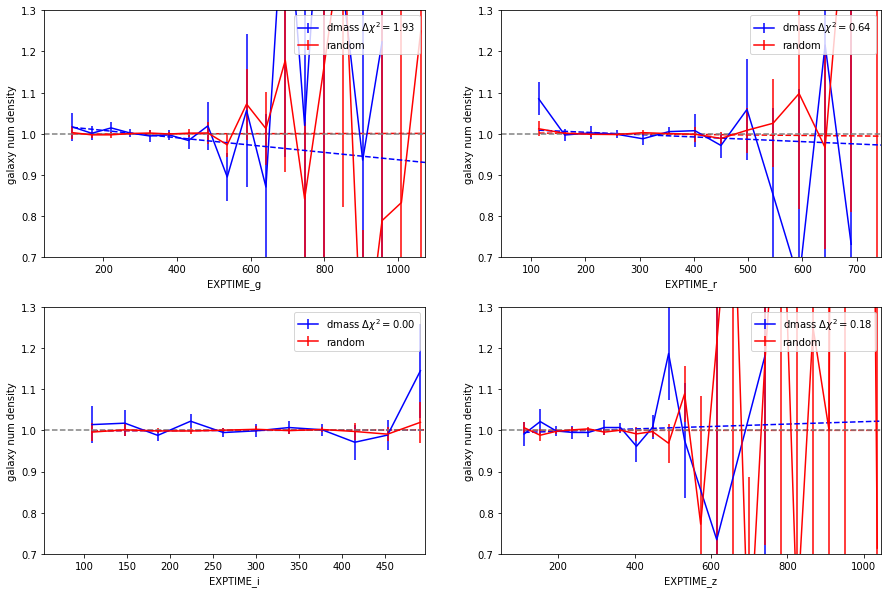

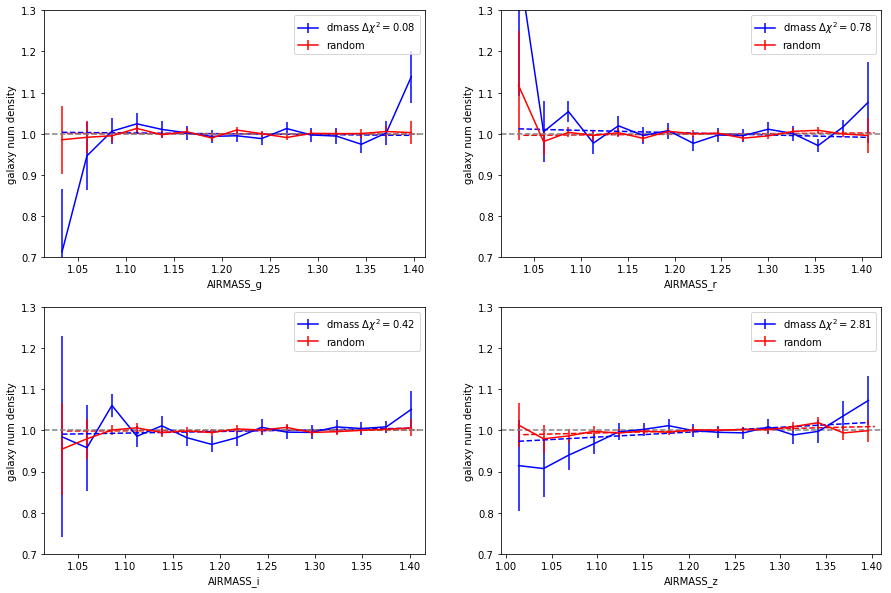

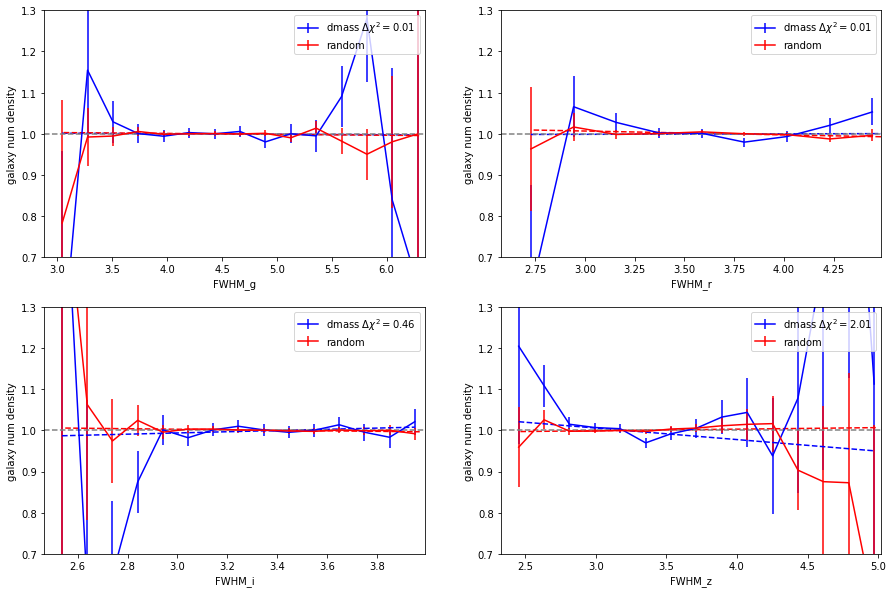

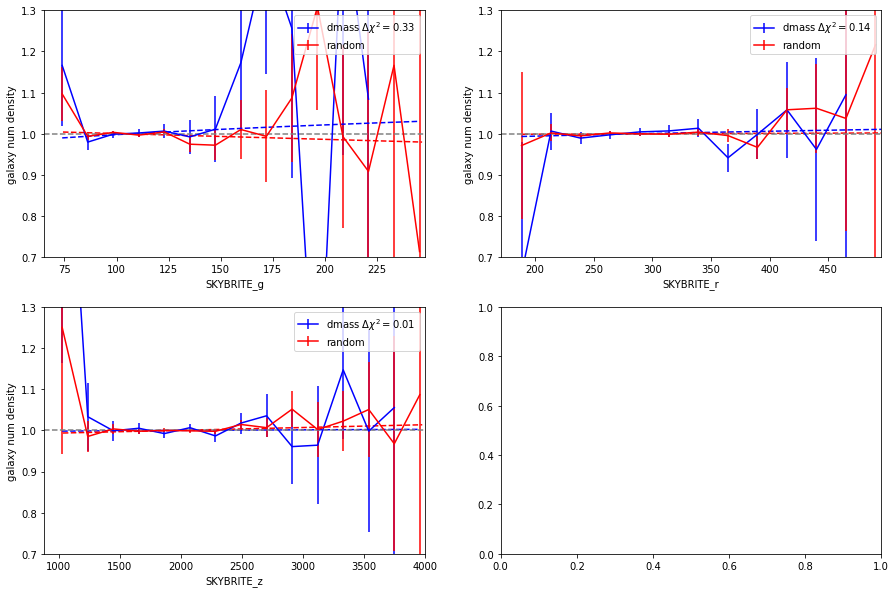

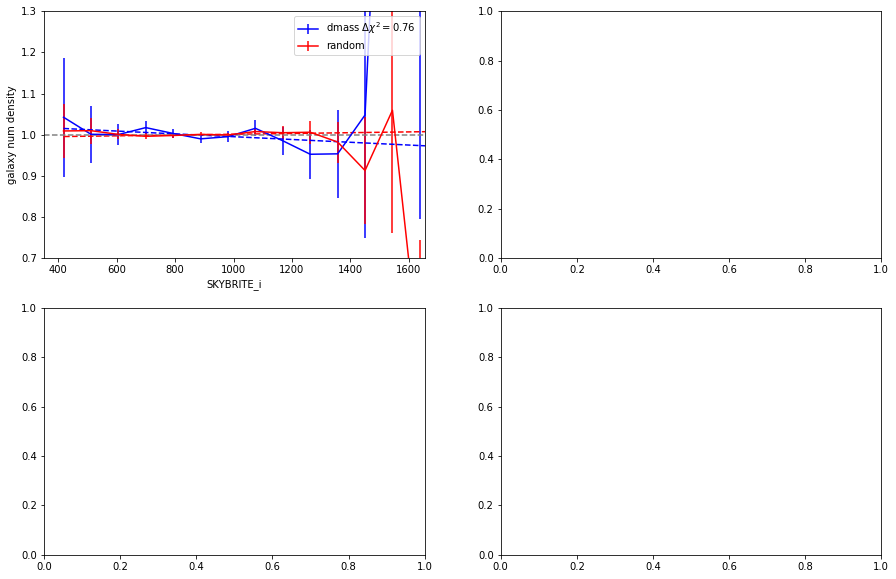

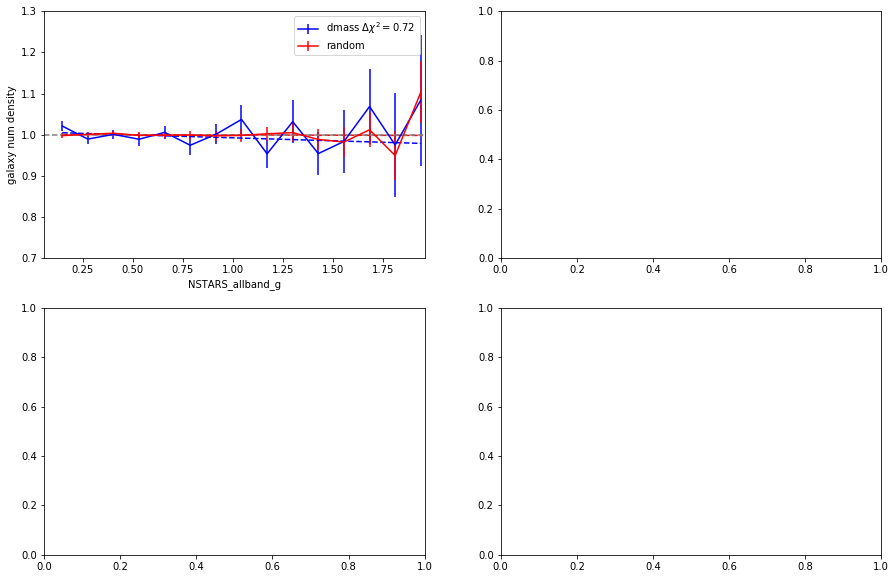

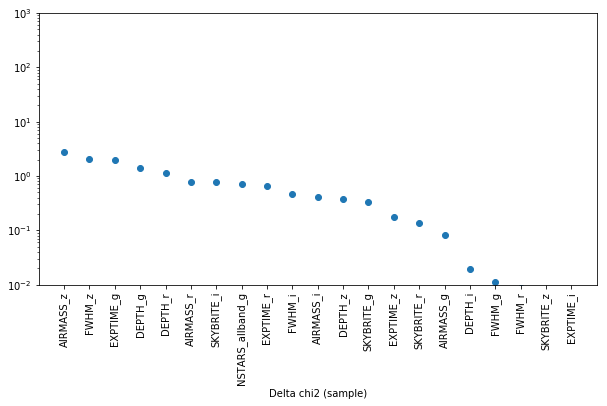

-------------------------
 iteration - 8
 nextweight FWHM_z
-------------------------
['SKYBRITE_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'noweight', 'EXPTIME_i', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
FWHM_g
FWHM_r
AIRMASS_z
noweight
EXPTIME_i
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  FWHM_z
linear


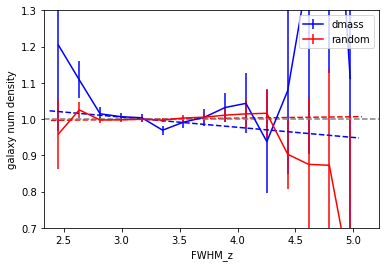

store weight  FWHM_z
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_fwhm_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z
chi2_null =  6.831936575454423
chi2_mod. =  5.472388727103339
Delta chi2 (sample) = 1.3595478483510837
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z.txt.model

chi2_null =  3.4678612802055984
chi2_mod. =  2.400118956829927
Delta chi2 (sample) = 1.0677423233756715
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z.txt.model

chi2_null =  2.516881875890686
chi2_mod. =  2.4931618280947174
Delta chi2 (sample) = 0.02372004779596848
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_al

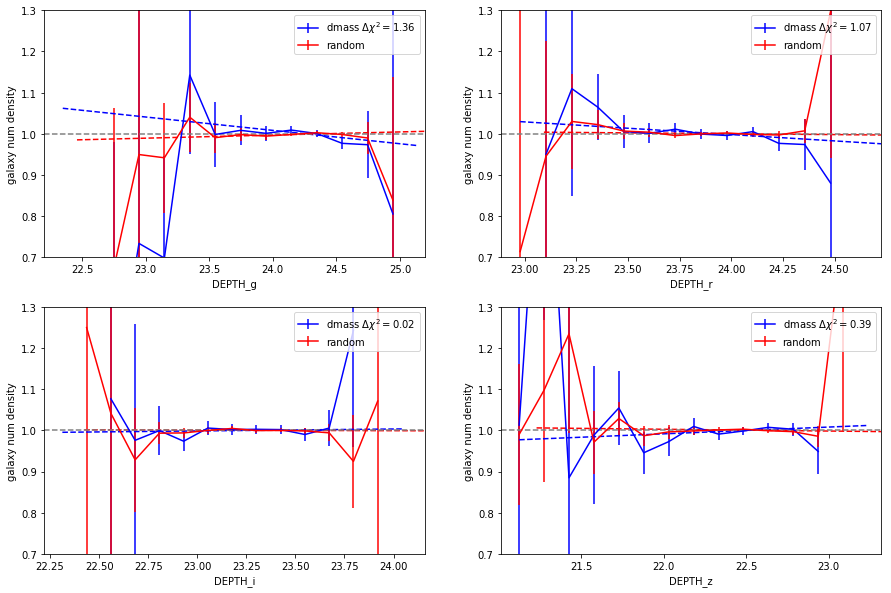

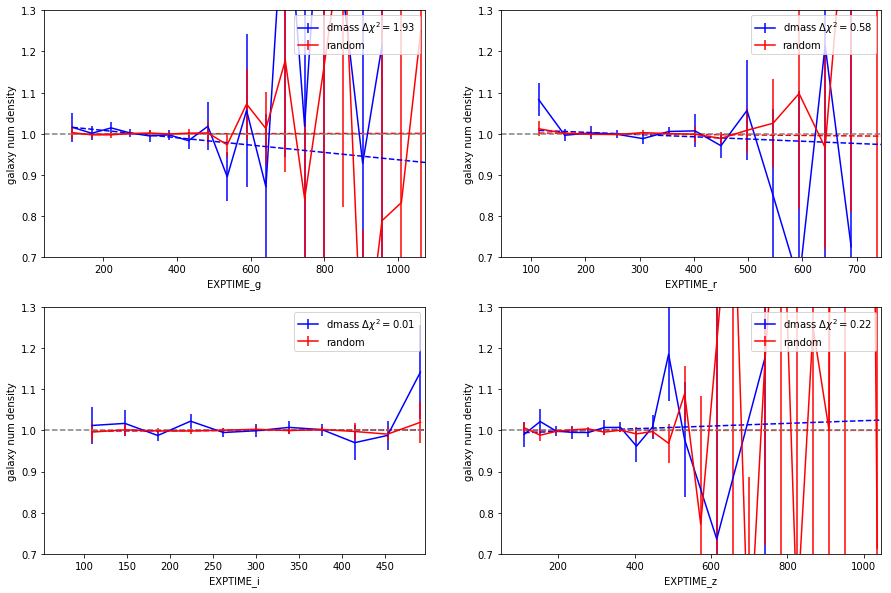

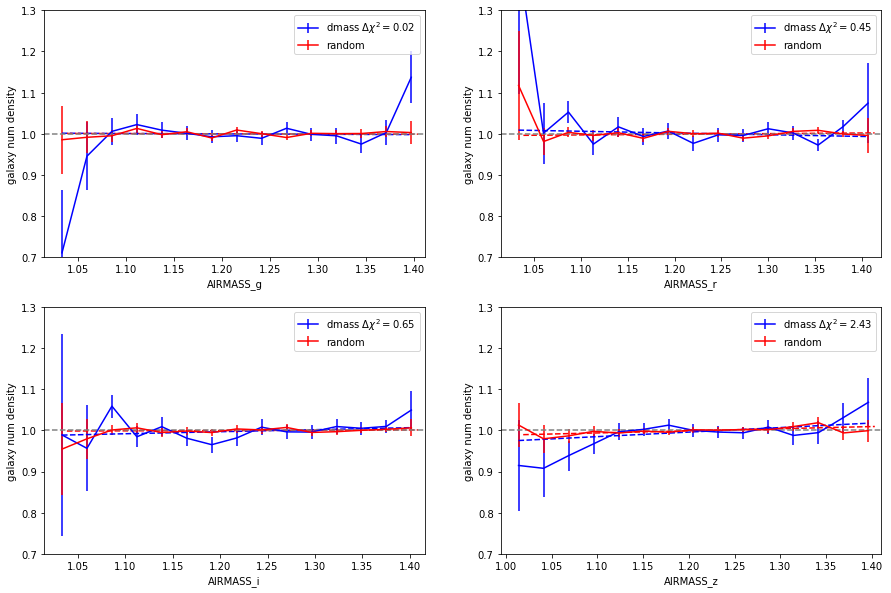

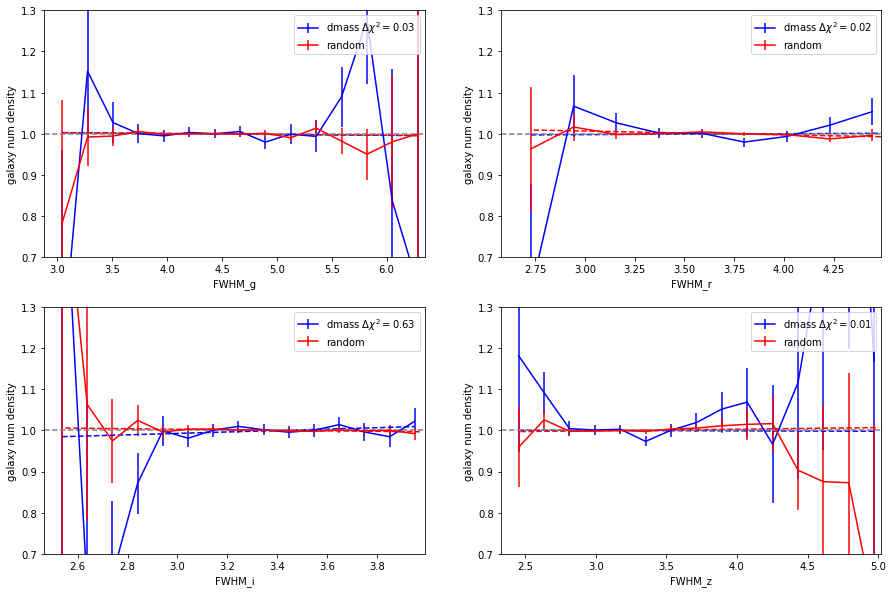

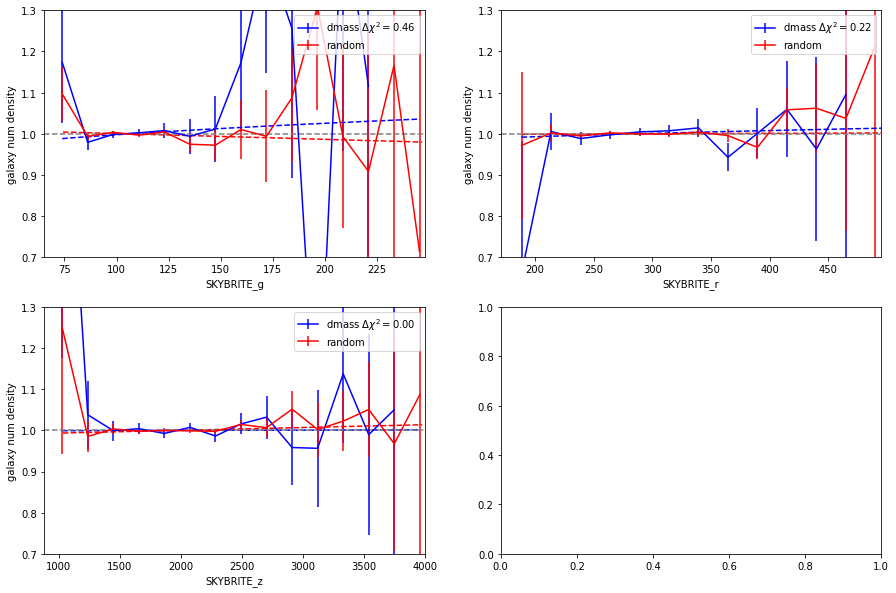

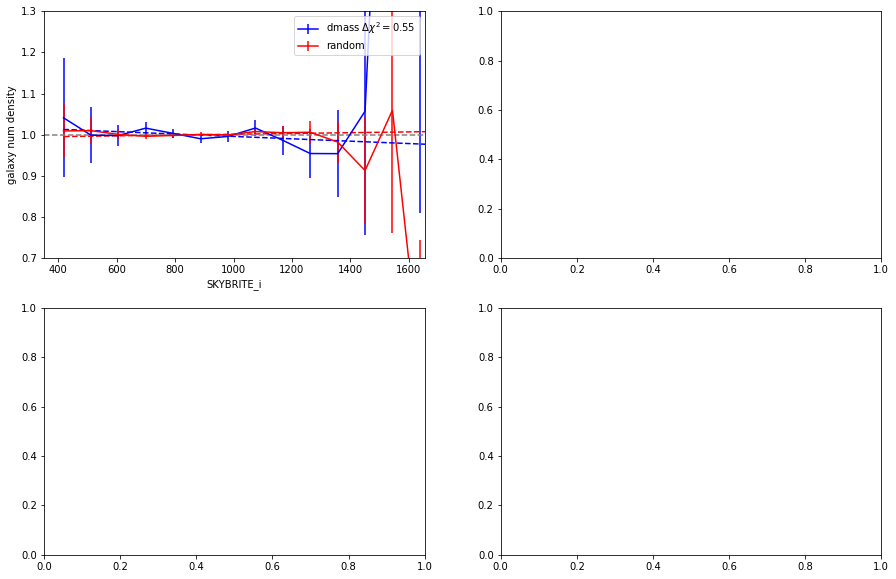

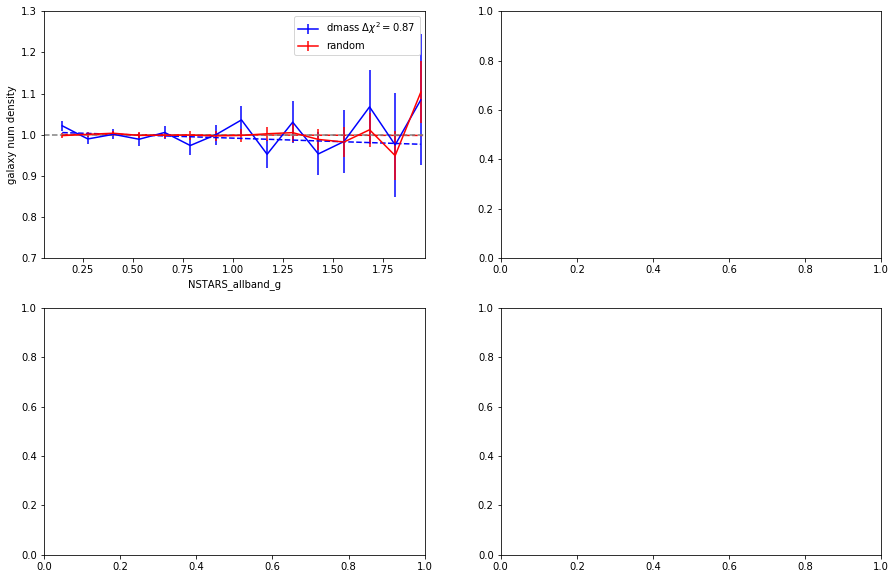

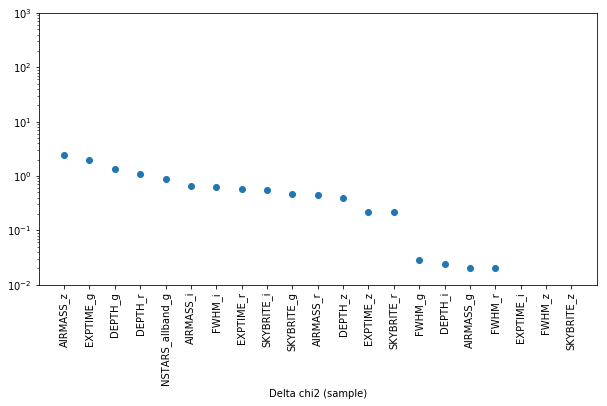

-------------------------
 iteration - 9
 nextweight EXPTIME_g
-------------------------
['SKYBRITE_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'noweight', 'EXPTIME_i', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
FWHM_g
FWHM_r
AIRMASS_z
noweight
EXPTIME_i
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  EXPTIME_g
linear


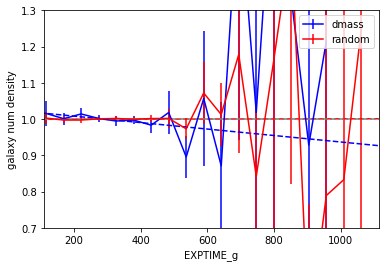

store weight  EXPTIME_g
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_exptime_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g
chi2_null =  4.753656831760938
chi2_mod. =  4.752719704005445
Delta chi2 (sample) = 0.000937127755492817
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g.txt.model

chi2_null =  2.4713786197427883
chi2_mod. =  2.455356763132854
Delta chi2 (sample) = 0.016021856609934382
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g.txt.model

chi2_null =  3.157041248176654
chi2_mod. =  2.2683217341655584
Delta chi2 (sample) = 0.8887195140110955
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_i_SPT_

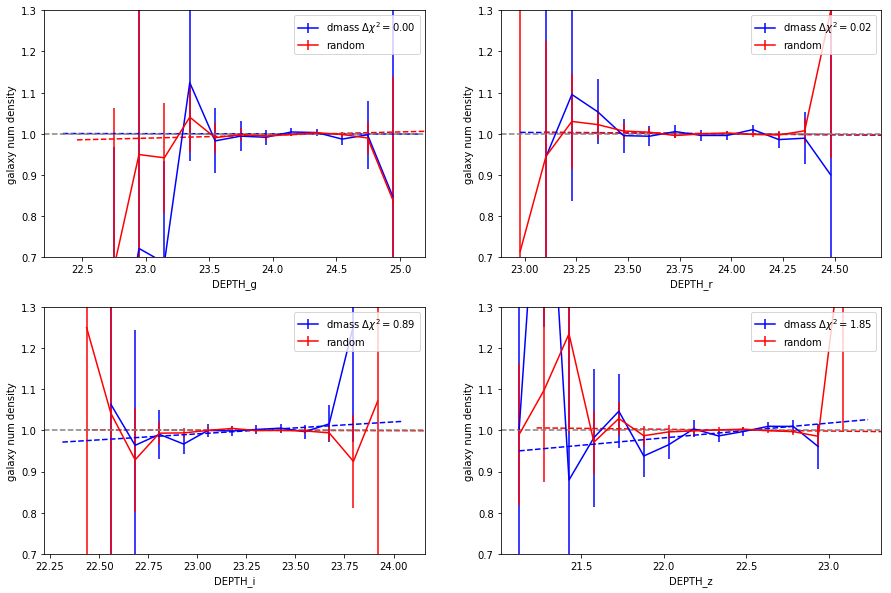

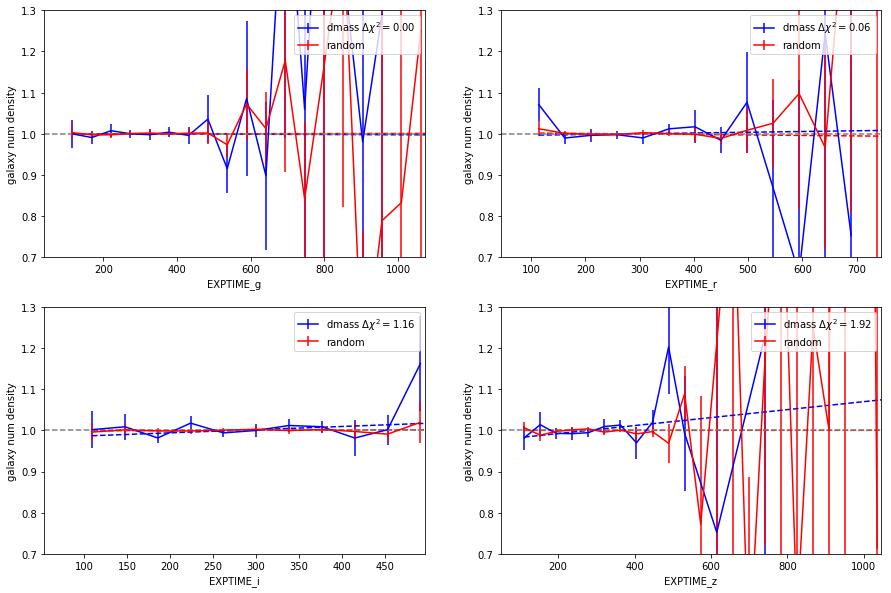

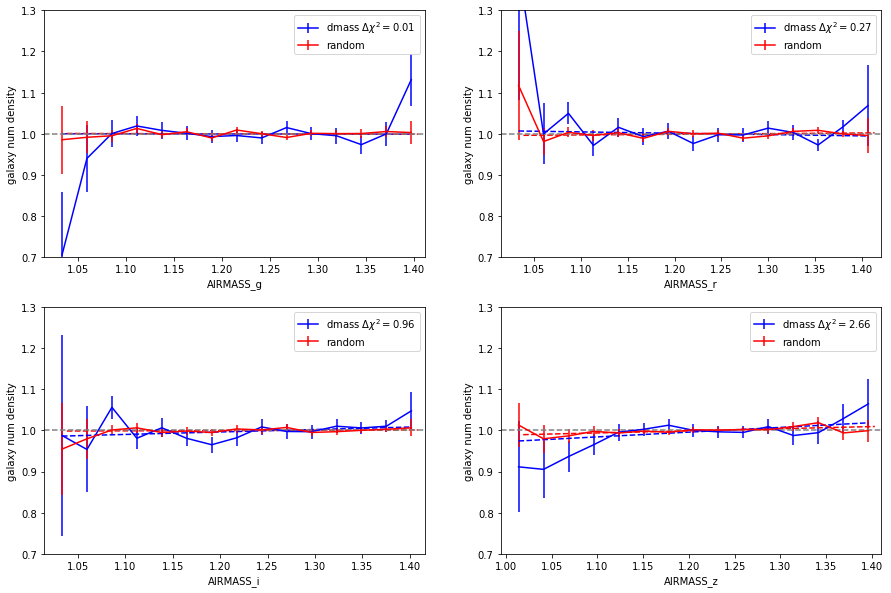

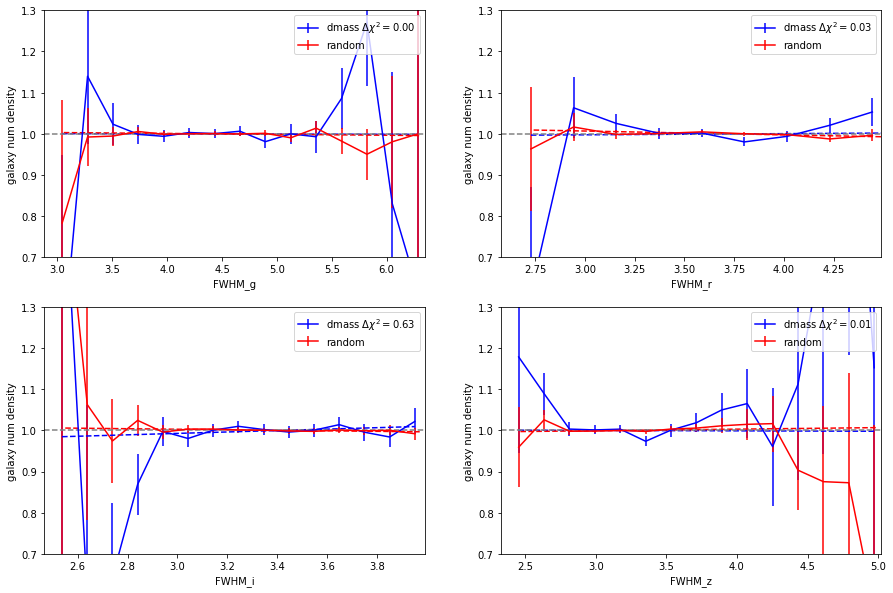

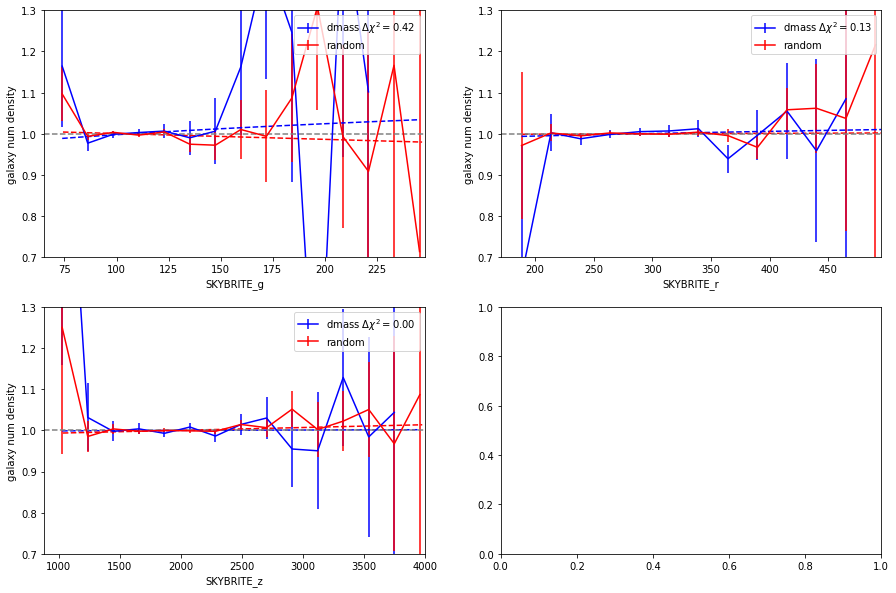

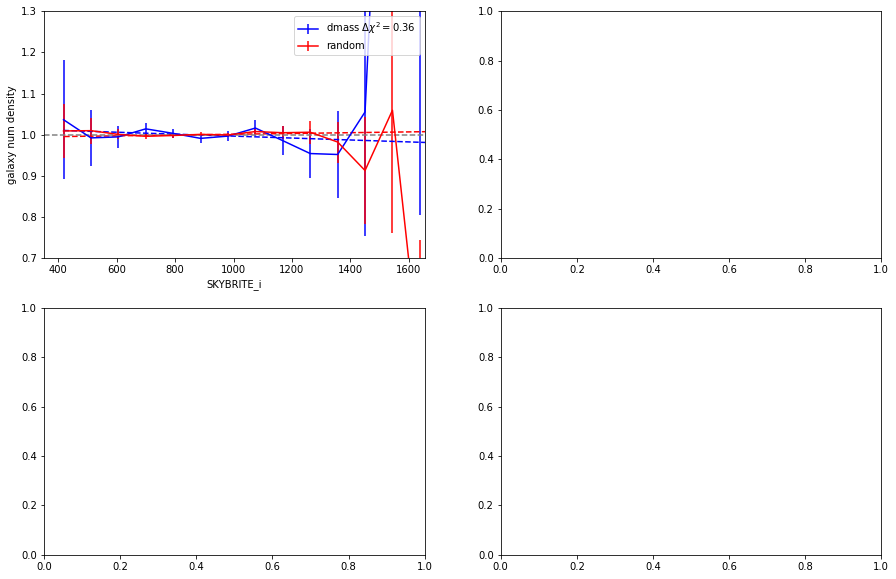

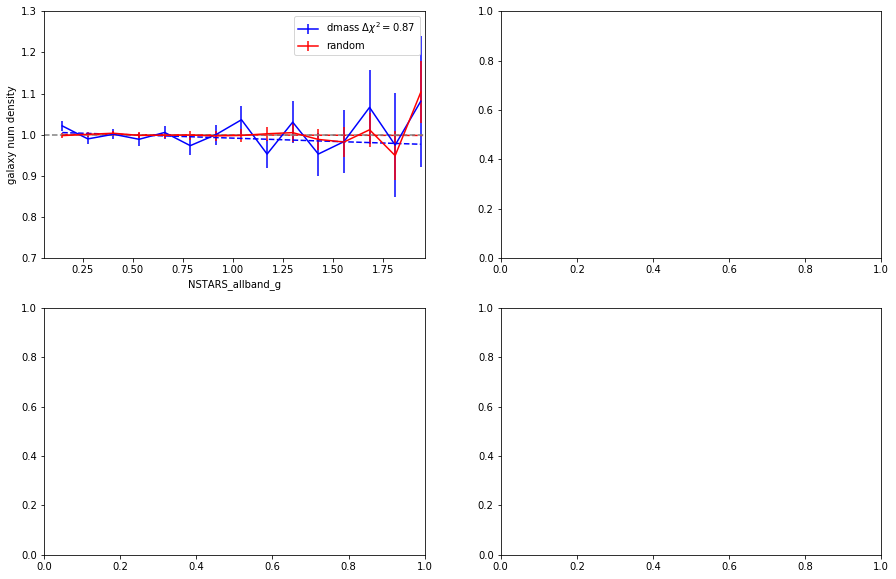

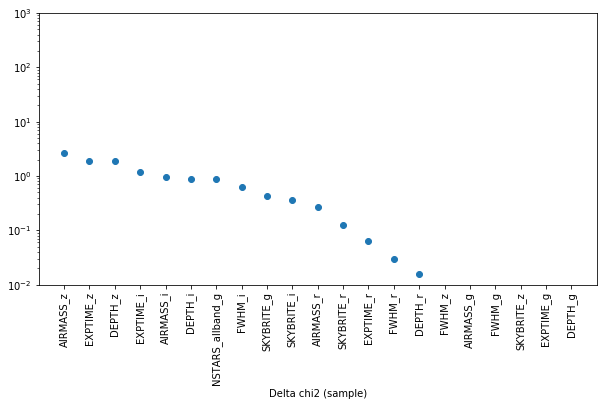

-------------------------
 iteration - 10
 nextweight EXPTIME_z
-------------------------
['SKYBRITE_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'EXPTIME_i', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
FWHM_g
FWHM_r
AIRMASS_z
EXPTIME_g
noweight
EXPTIME_i
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  EXPTIME_z
linear


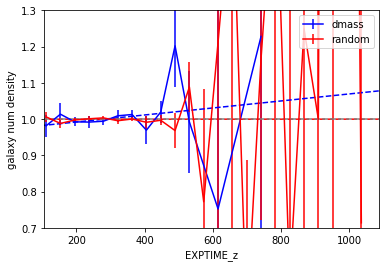

store weight  EXPTIME_z
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_exptime_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z
chi2_null =  6.060146805459385
chi2_mod. =  5.3660868168734295
Delta chi2 (sample) = 0.6940599885859555
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z.txt.model

chi2_null =  3.5066274633400956
chi2_mod. =  2.456380505635123
Delta chi2 (sample) = 1.0502469577049727
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z.txt.model

chi2_null =  2.5045435547628676
chi2_mod. =  2.498206668343154
Delta chi2 (sample) = 0.00633688641971375
output save to  ../data_txt/systematics/6th_ignor

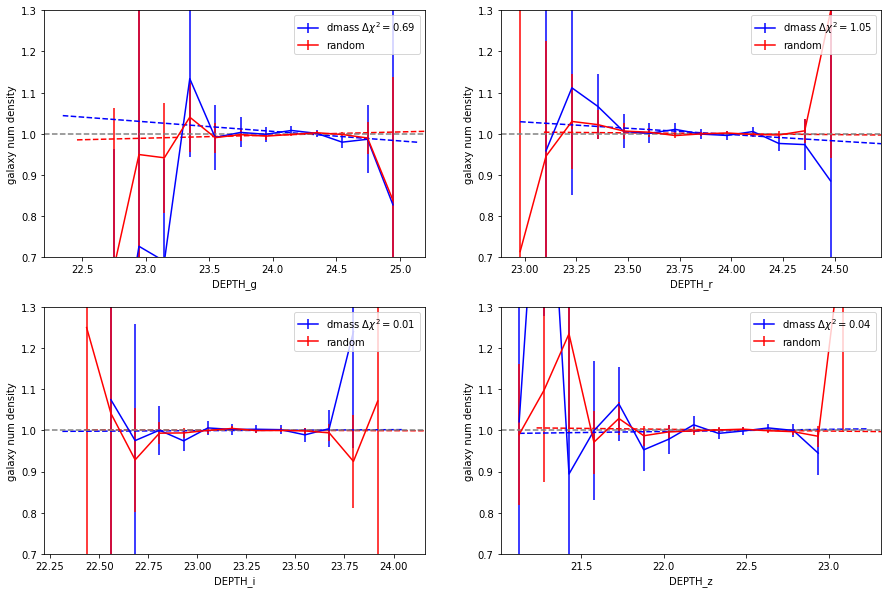

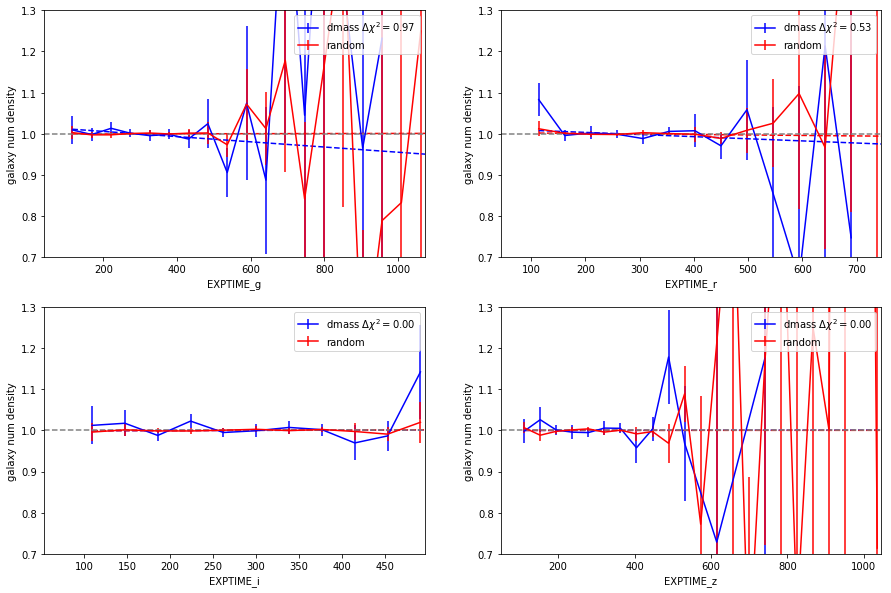

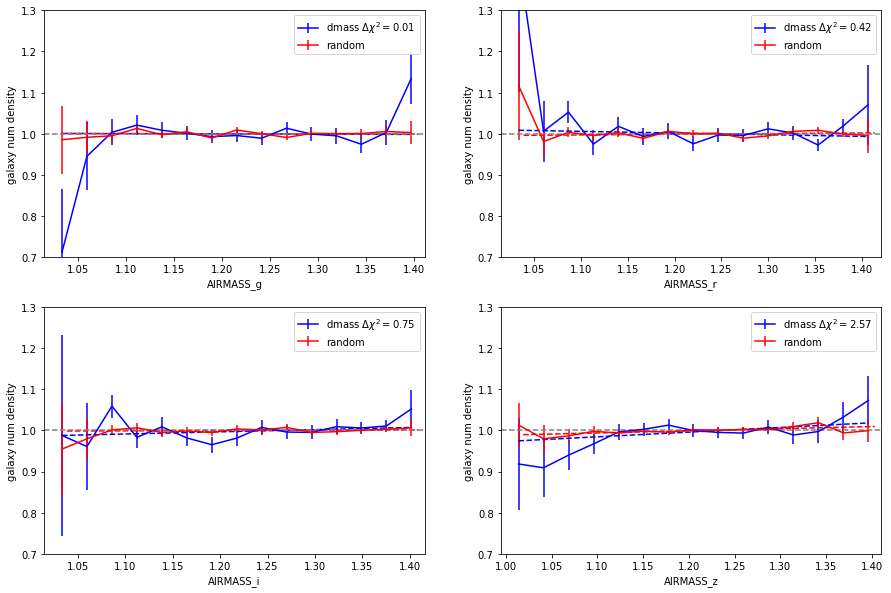

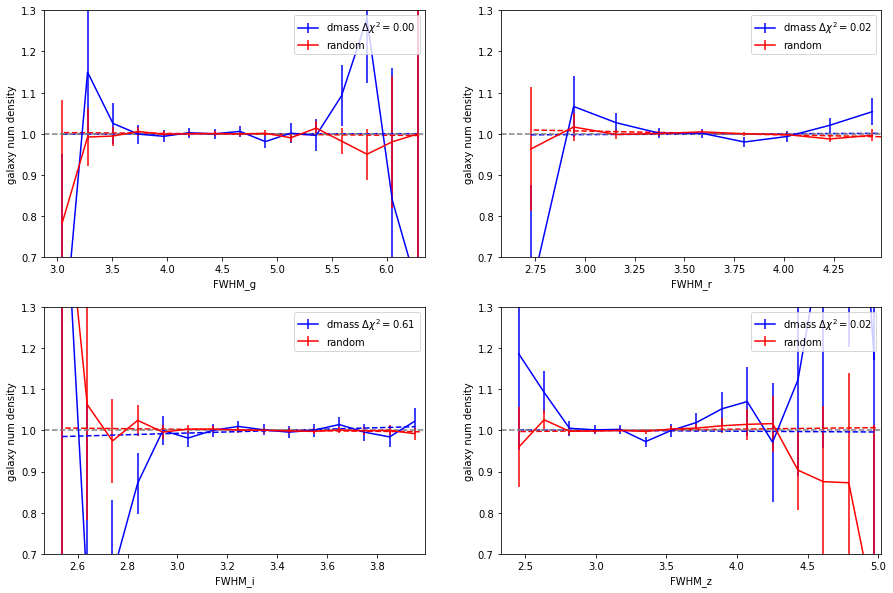

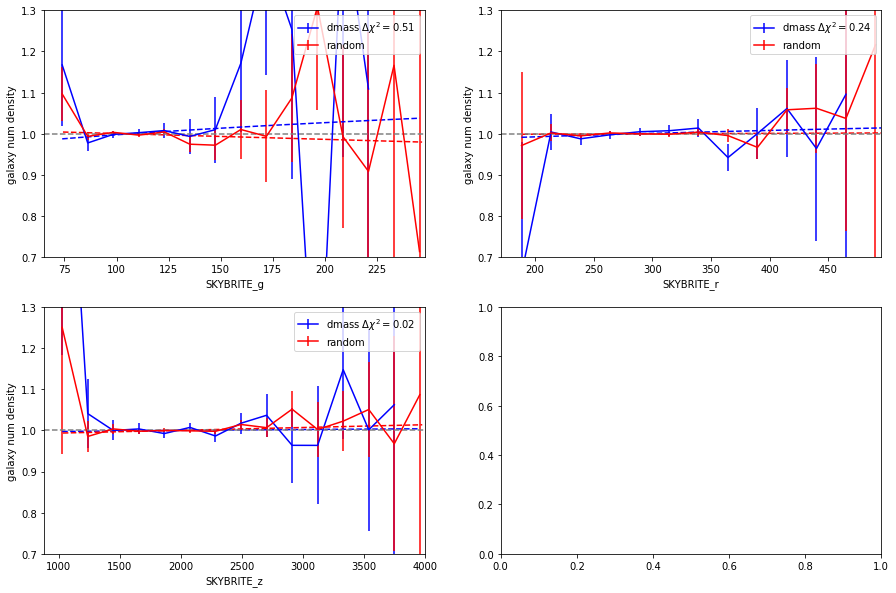

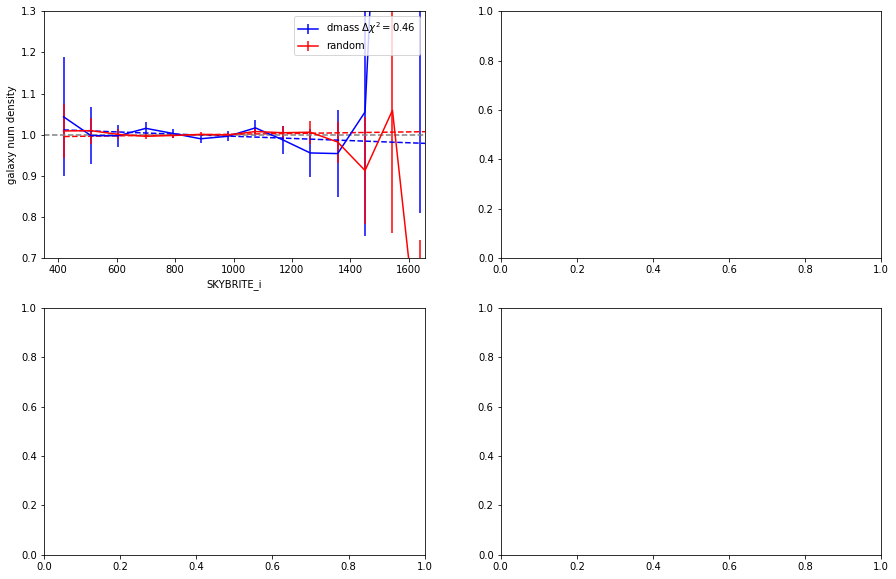

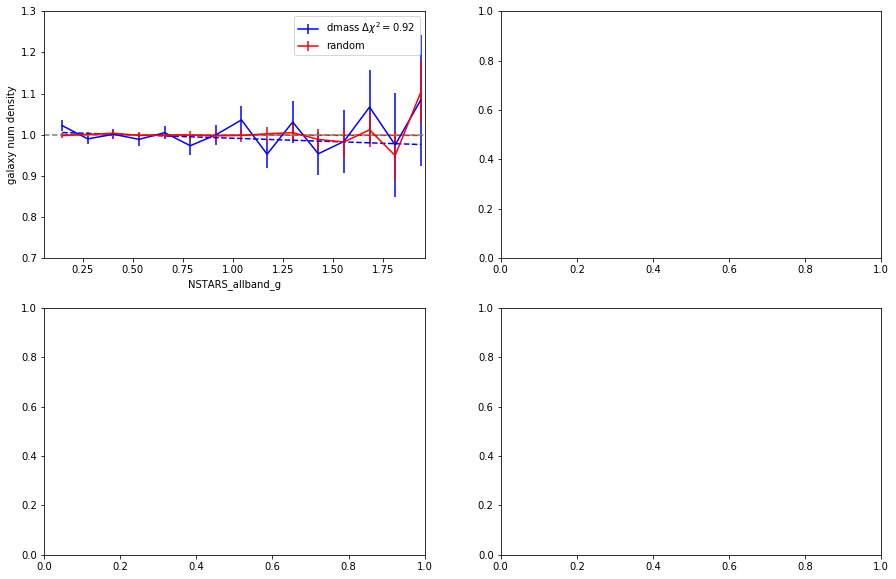

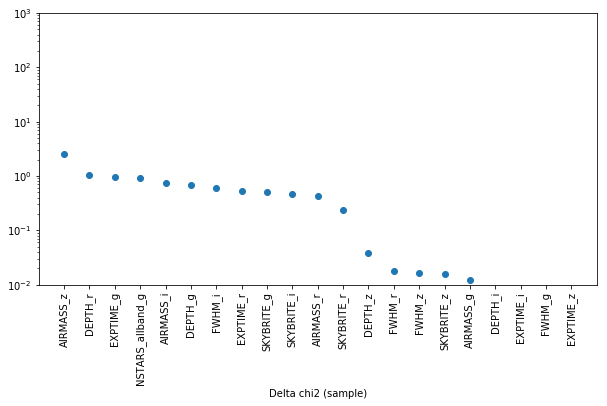

-------------------------
 iteration - 11
 nextweight DEPTH_r
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'EXPTIME_i', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
FWHM_g
FWHM_r
AIRMASS_z
EXPTIME_g
noweight
EXPTIME_i
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  DEPTH_r
linear


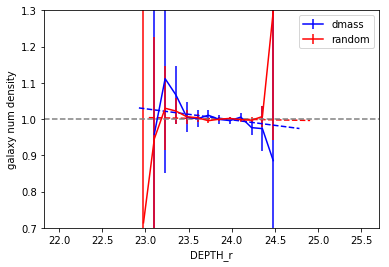

store weight  DEPTH_r
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_depth_r_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r
chi2_null =  5.213437599122785
chi2_mod. =  5.186364885387279
Delta chi2 (sample) = 0.027072713735505793
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.txt.model

chi2_null =  2.497201569775511
chi2_mod. =  2.4955848252261323
Delta chi2 (sample) = 0.001616744549378879
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.txt.model

chi2_null =  3.0679746471703897
chi2_mod. =  2.4321925176472874
Delta chi2 (sample) = 0.6357821295231023
output save to  ../data_tx

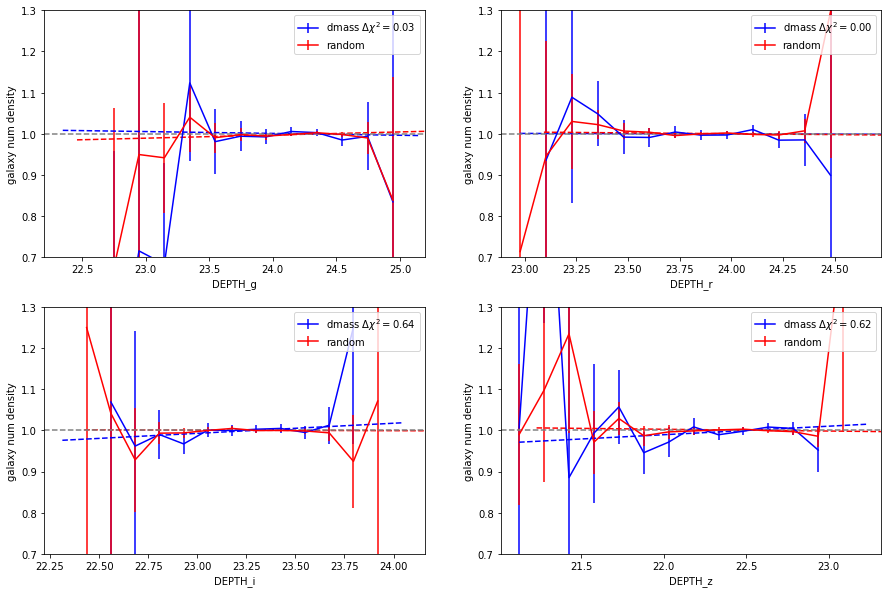

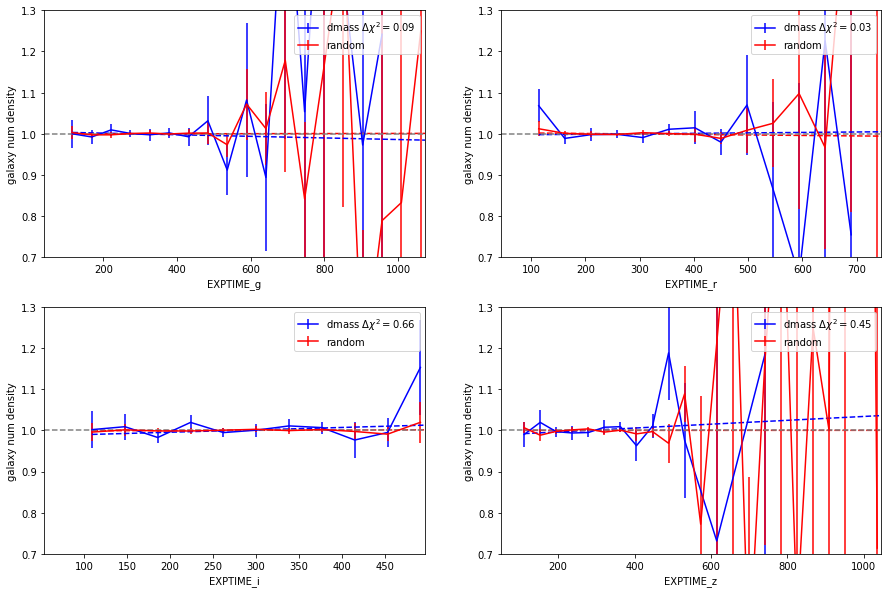

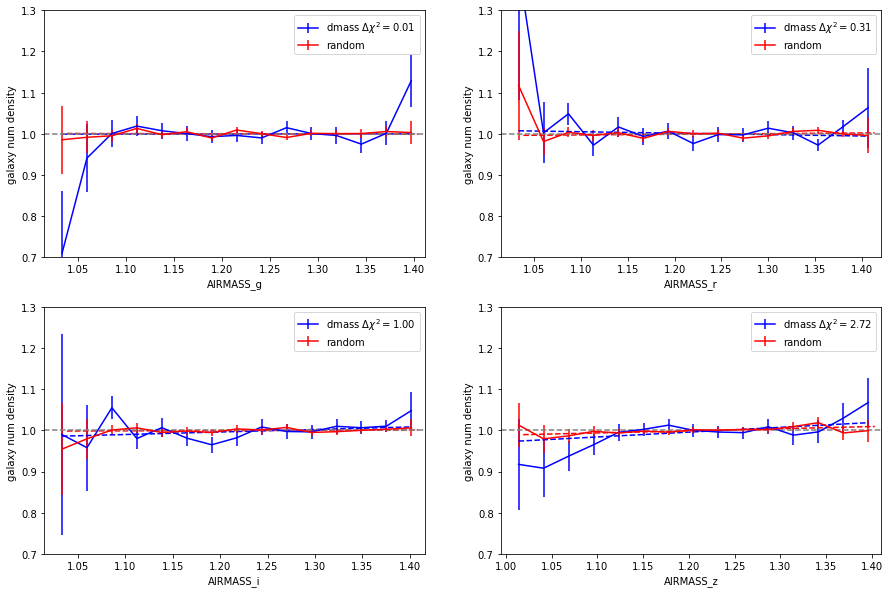

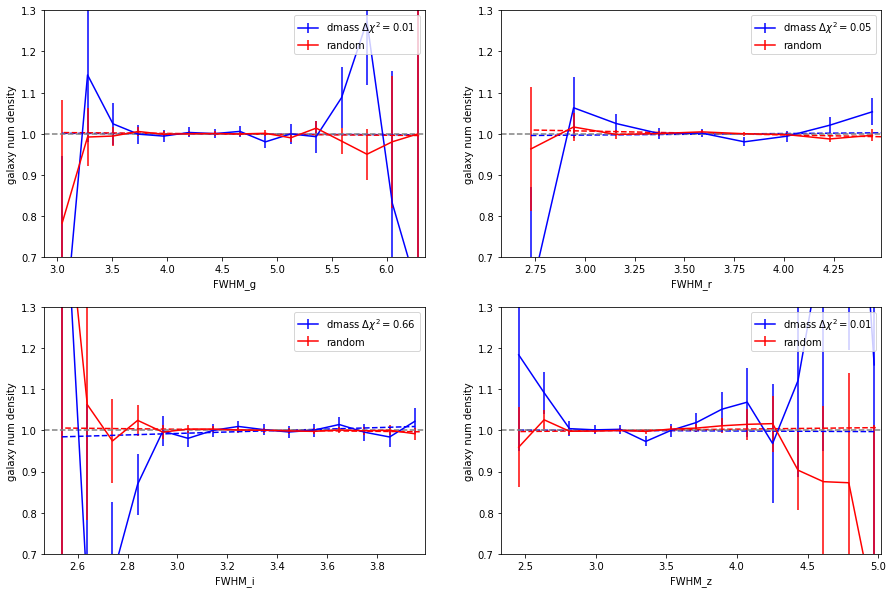

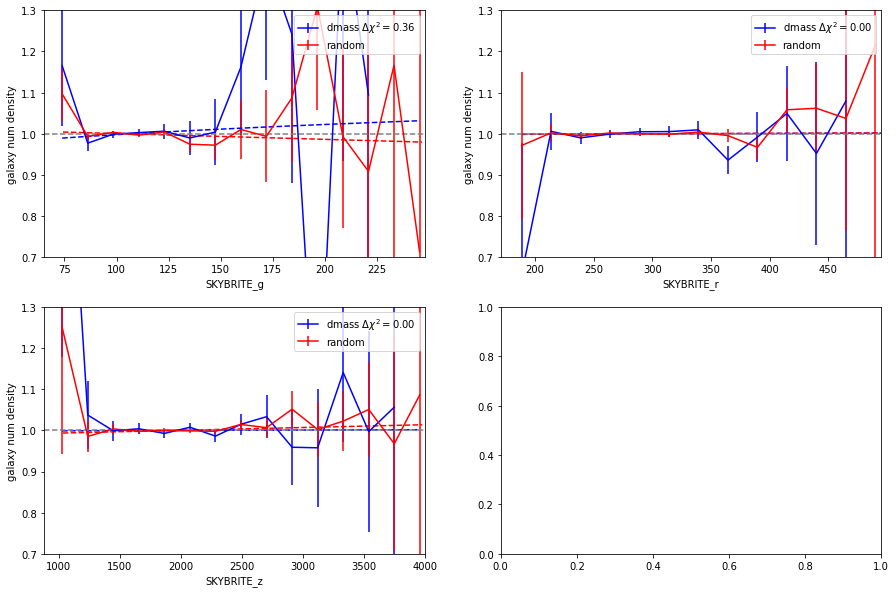

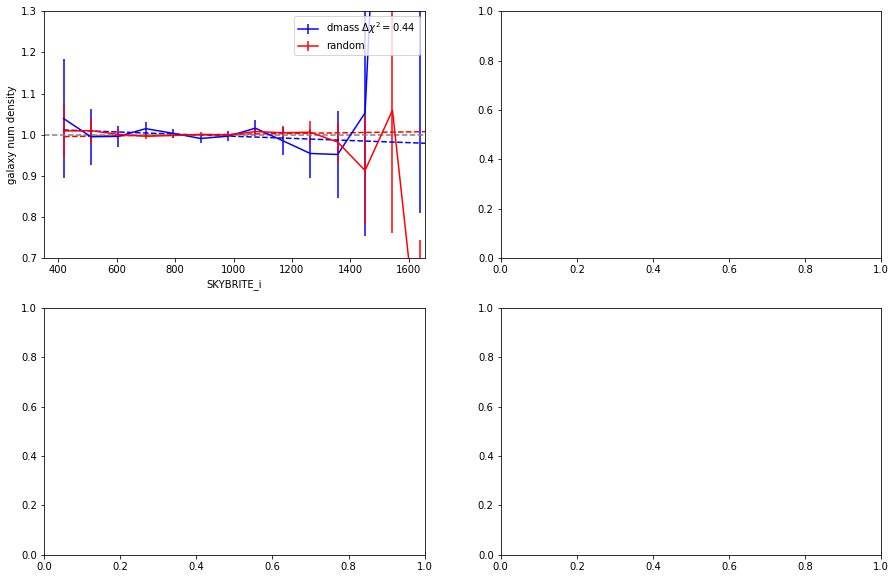

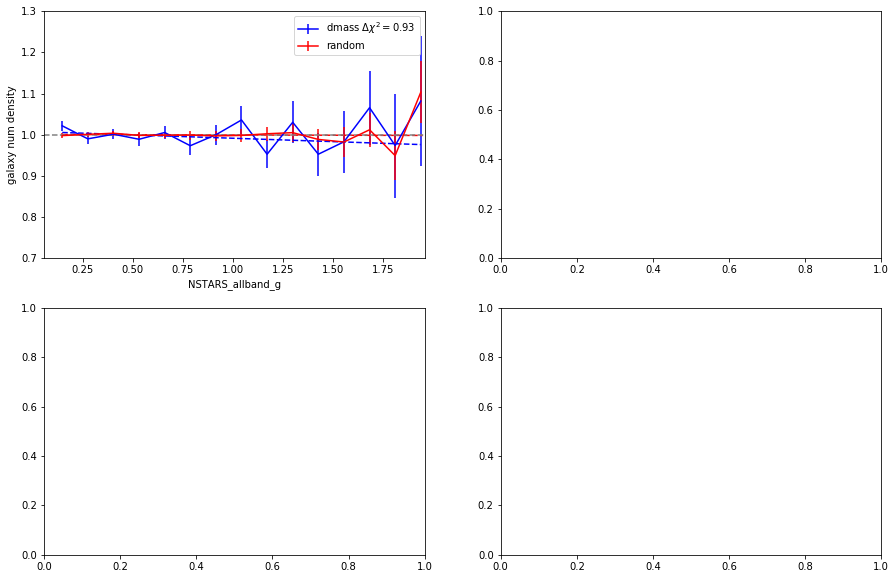

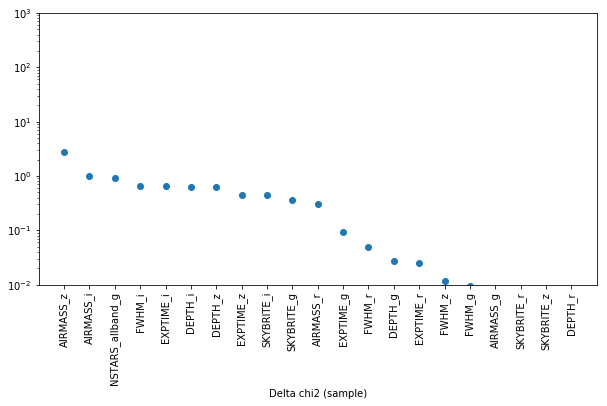

-------------------------
 iteration - 12
 nextweight FWHM_i
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'EXPTIME_i', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
DEPTH_r
FWHM_g
FWHM_r
AIRMASS_z
EXPTIME_g
noweight
EXPTIME_i
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  FWHM_i
linear


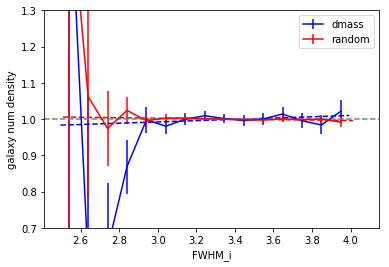

store weight  FWHM_i
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_fwhm_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i
chi2_null =  5.193405670274618
chi2_mod. =  5.161445923065866
Delta chi2 (sample) = 0.031959747208752276
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i.txt.model

chi2_null =  2.490537138868732
chi2_mod. =  2.4869825278302105
Delta chi2 (sample) = 0.0035546110385213936
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i.txt.model

chi2_null =  2.88214944479971
chi2_mod. =  2.395859271633592
Delta chi2 (sample) = 0.4862901731661182
output sa

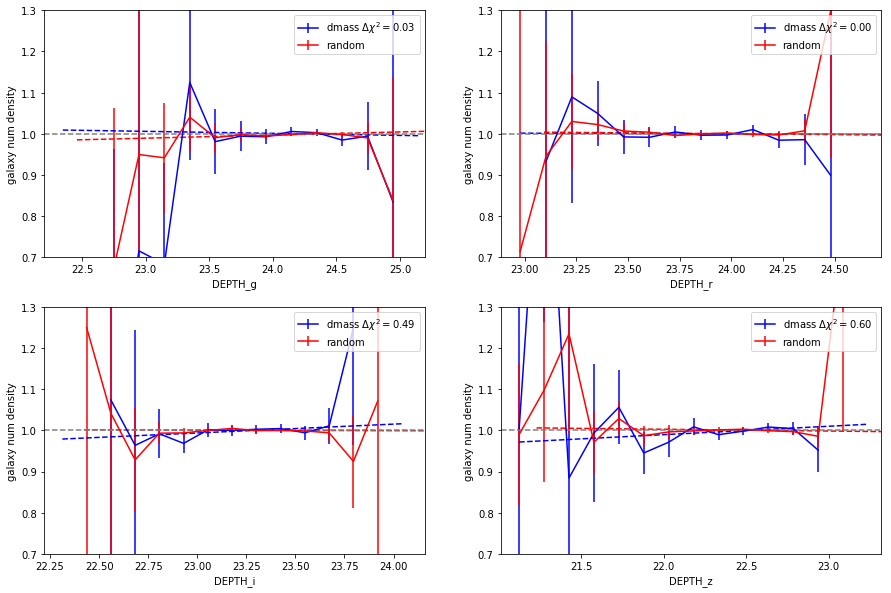

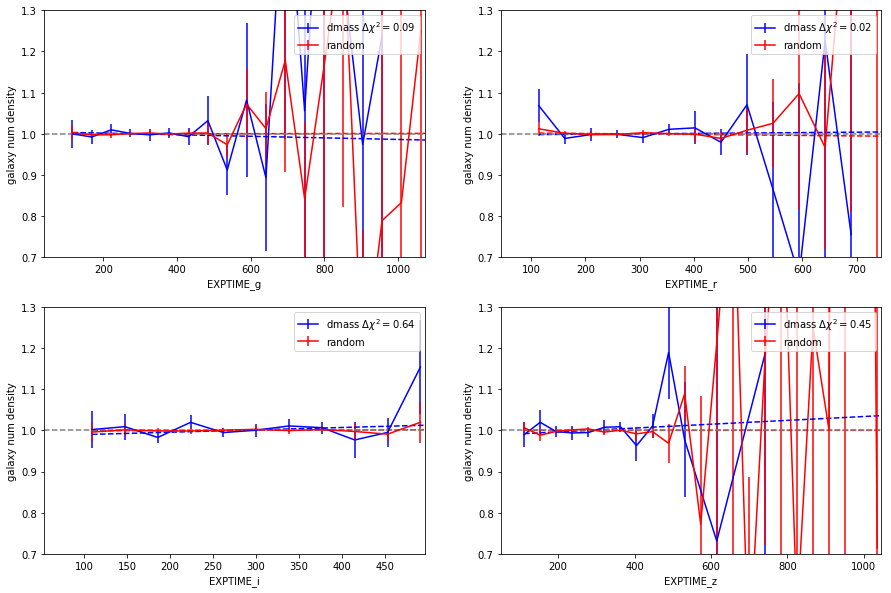

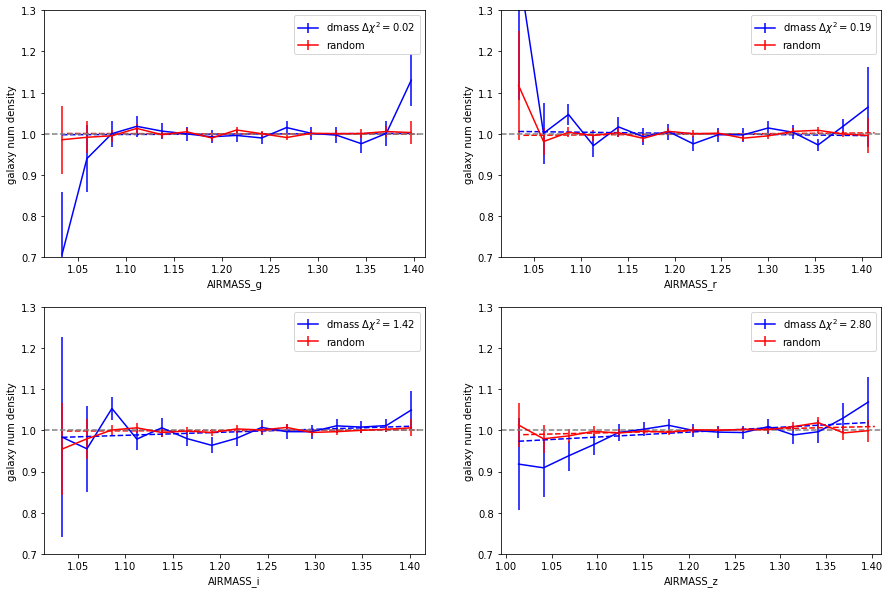

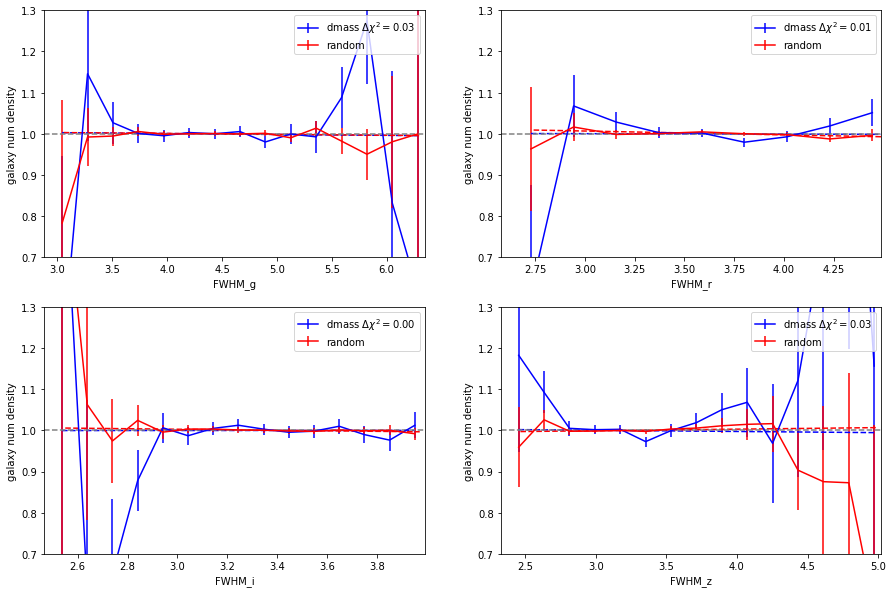

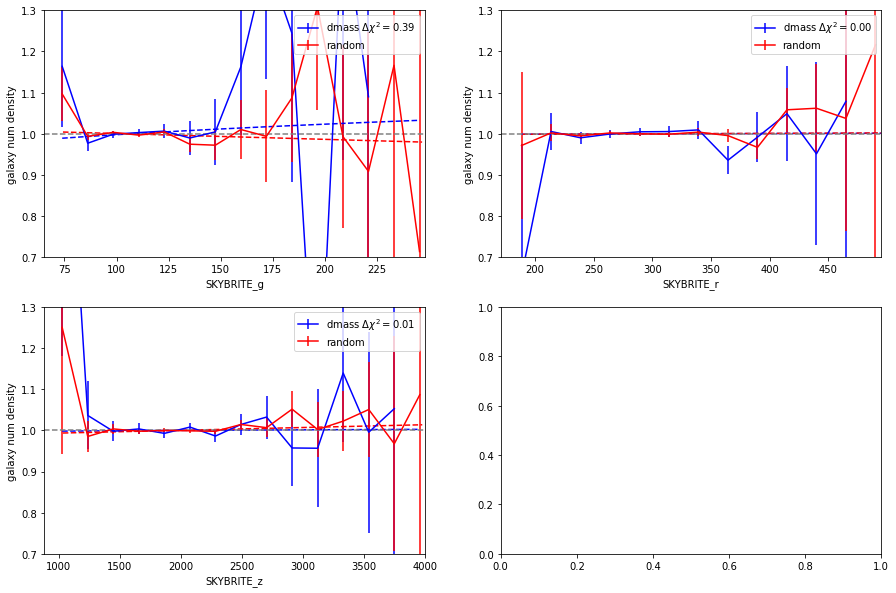

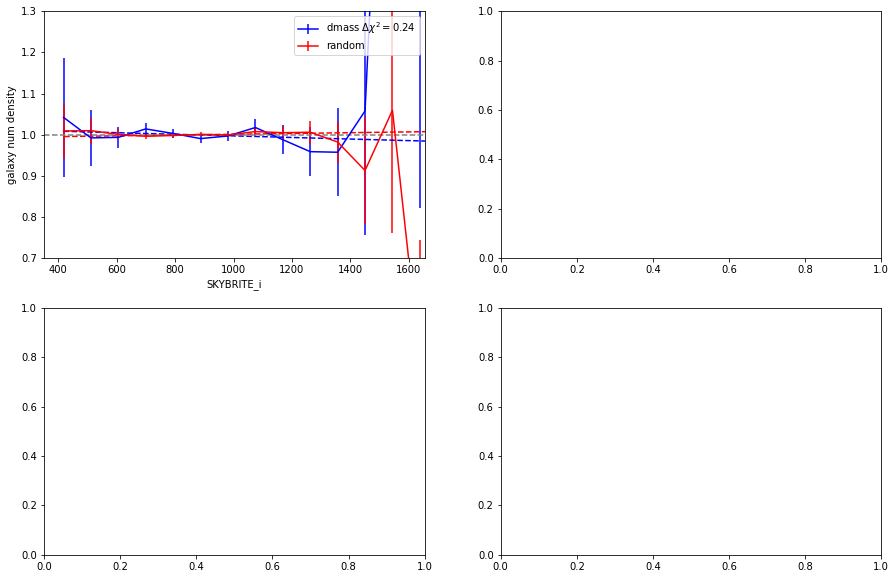

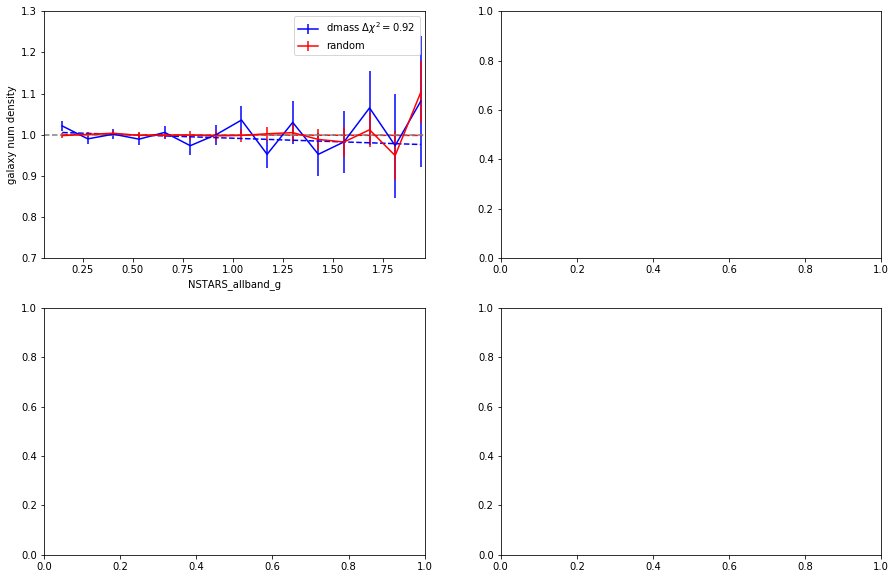

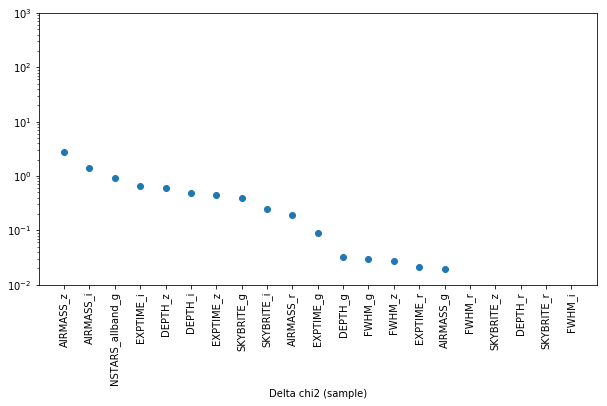

-------------------------
 iteration - 13
 nextweight DEPTH_z
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
DEPTH_r
FWHM_g
FWHM_r
AIRMASS_z
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  DEPTH_z
linear


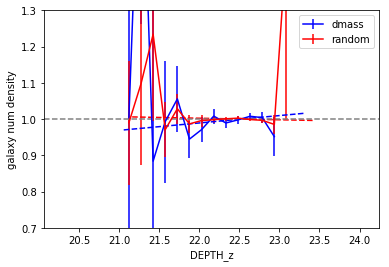

store weight  DEPTH_z
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_depth_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z
chi2_null =  5.6381031396489565
chi2_mod. =  5.314682602474491
Delta chi2 (sample) = 0.3234205371744654
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z.txt.model

chi2_null =  2.7746389953359727
chi2_mod. =  2.5237871805323806
Delta chi2 (sample) = 0.2508518148035921
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z.txt.model

chi2_null =  2.5154198693376166
chi2_mod. =  2.4531649312525676
Delta chi2 (sample) = 0.

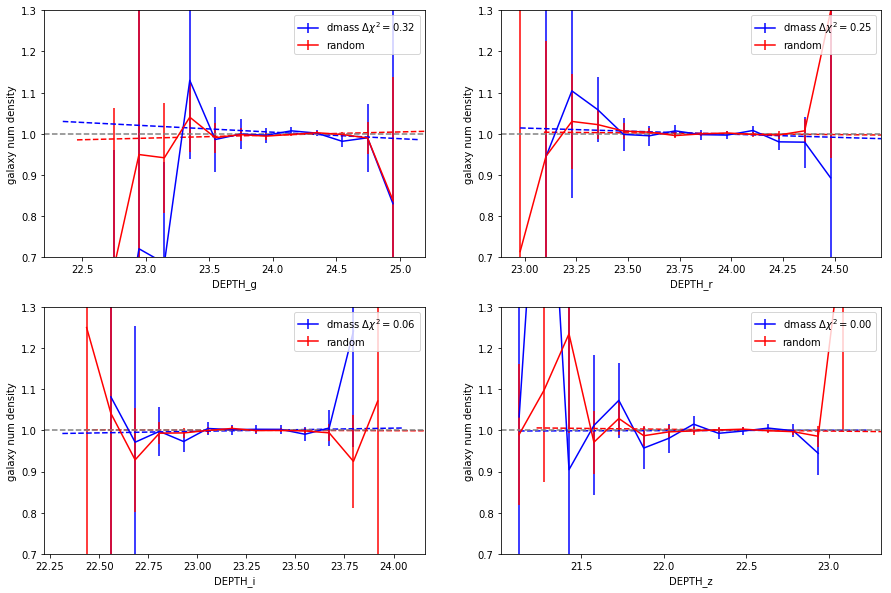

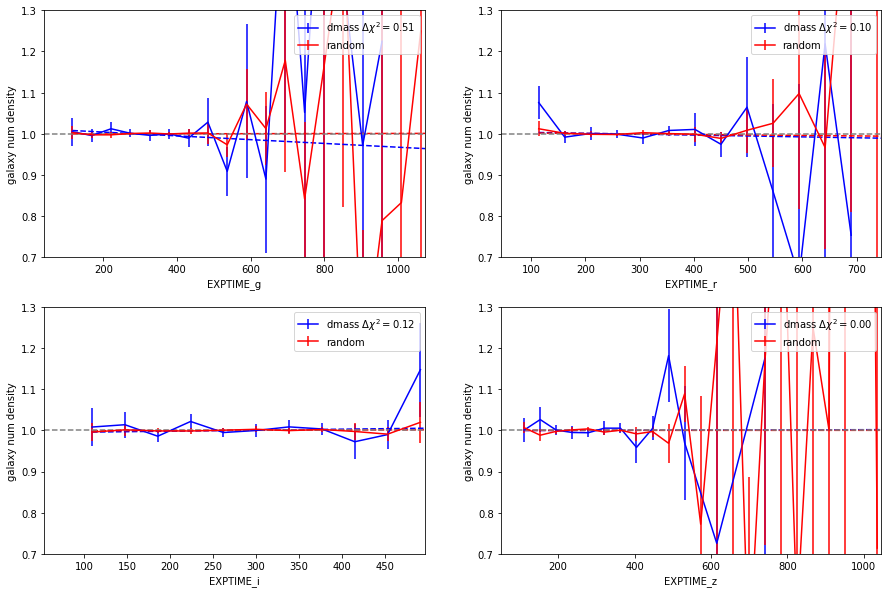

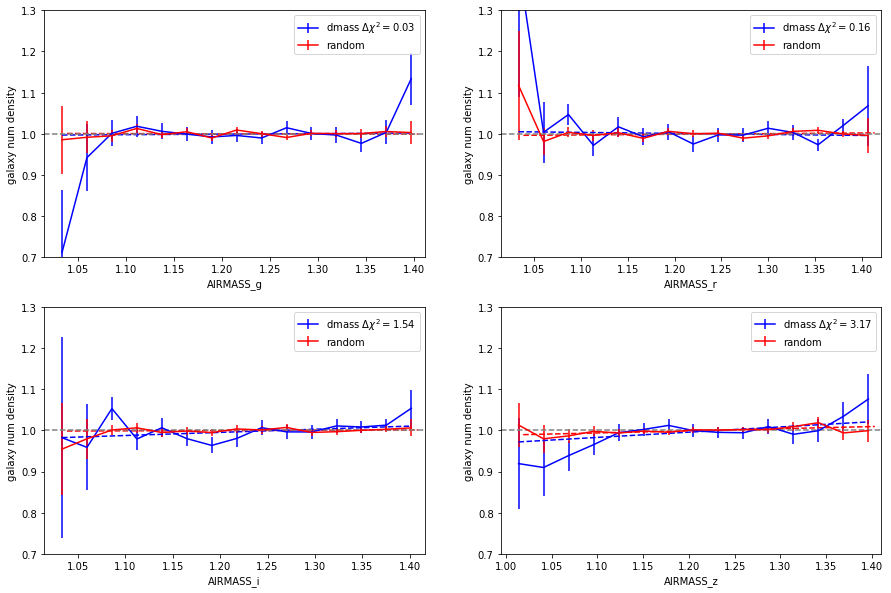

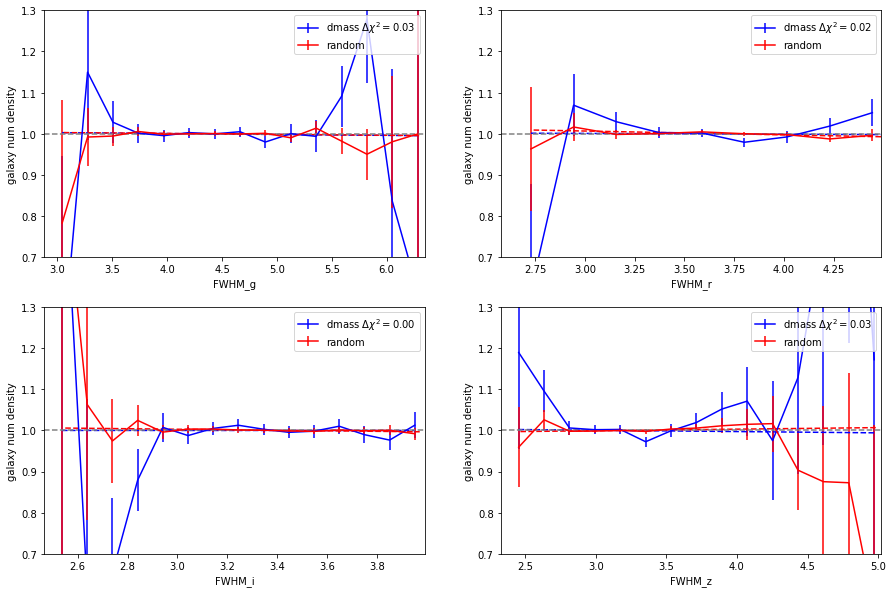

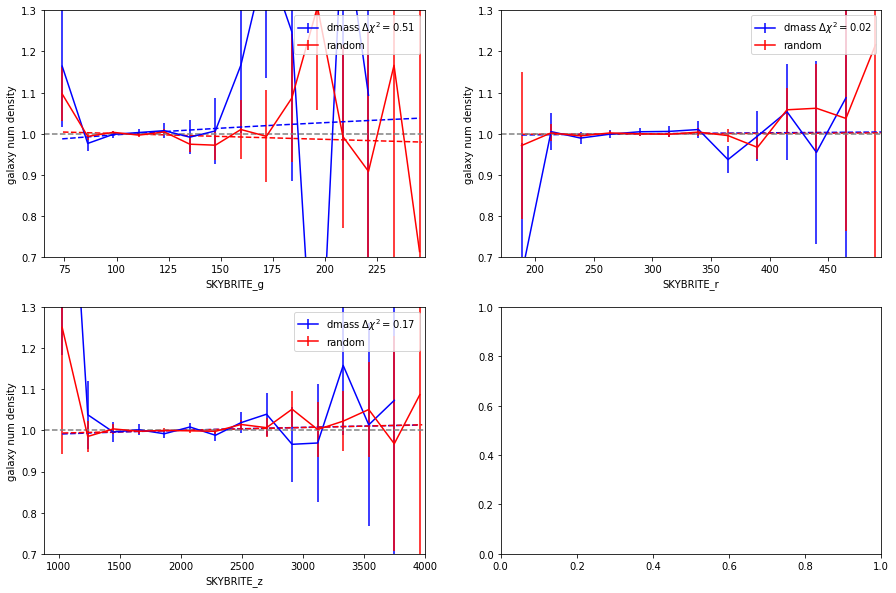

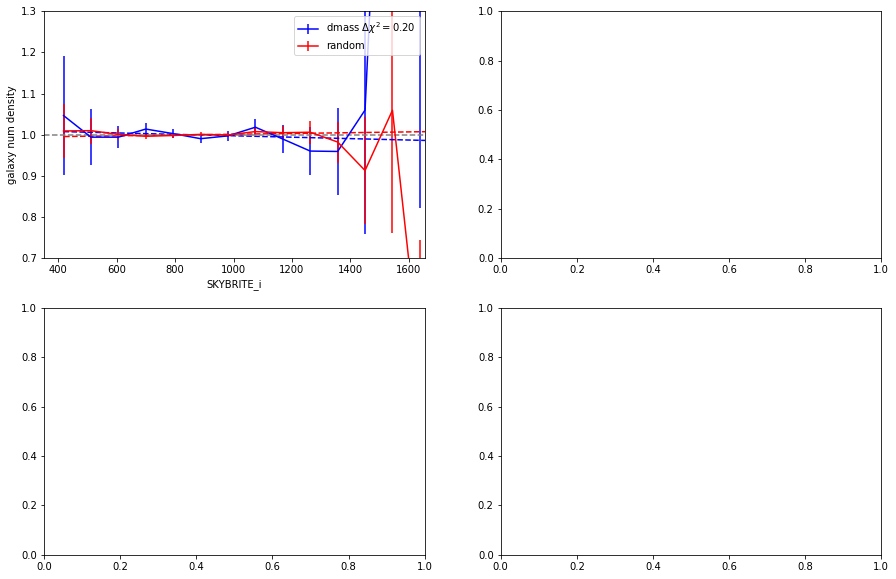

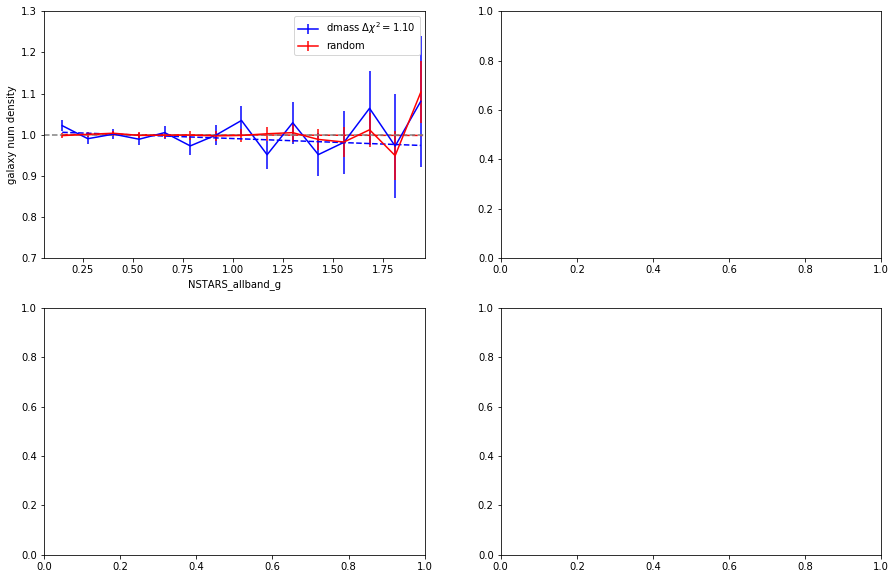

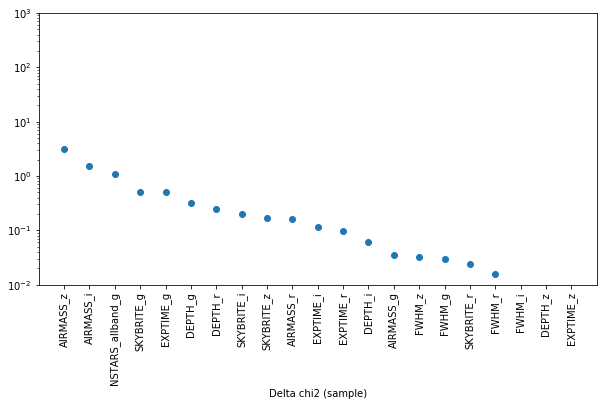

-------------------------
 iteration - 14
 nextweight SKYBRITE_g
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'DEPTH_z', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
DEPTH_r
FWHM_g
FWHM_r
AIRMASS_z
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
DEPTH_z
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  SKYBRITE_g
linear


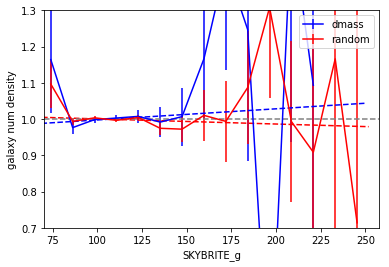

store weight  SKYBRITE_g
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_skybrite_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g
chi2_null =  5.591042279337344
chi2_mod. =  5.444022324025364
Delta chi2 (sample) = 0.14701995531197998
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g.txt.model

chi2_null =  2.669199955894978
chi2_mod. =  2.4888379818621713
Delta chi2 (sample) = 0.18036197403280685
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g.txt.model

chi2_null =  2.5846371503320063
chi2_mod. =  2.45

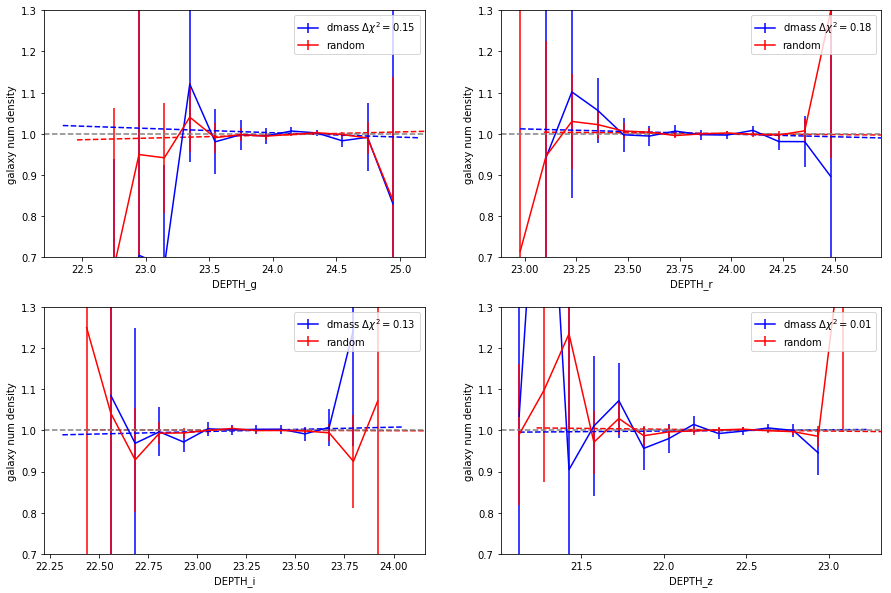

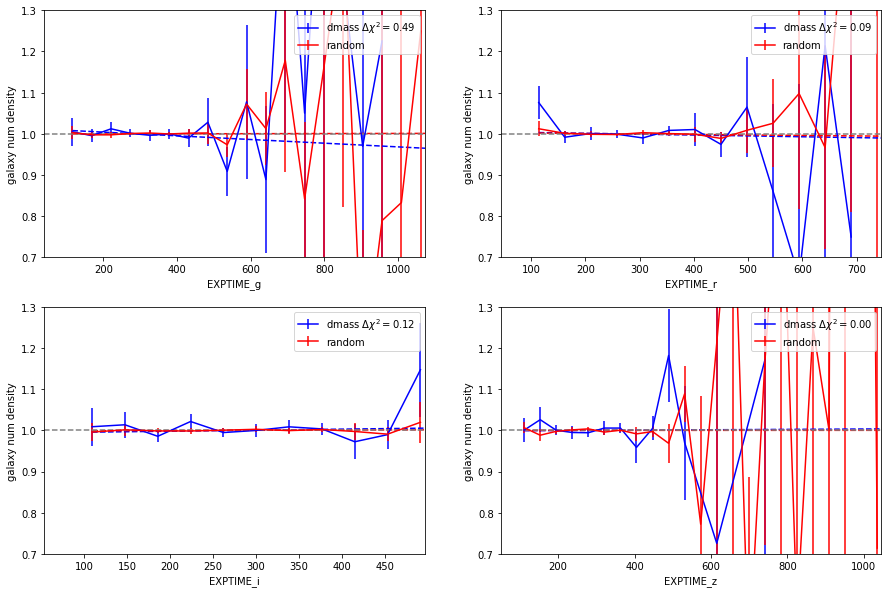

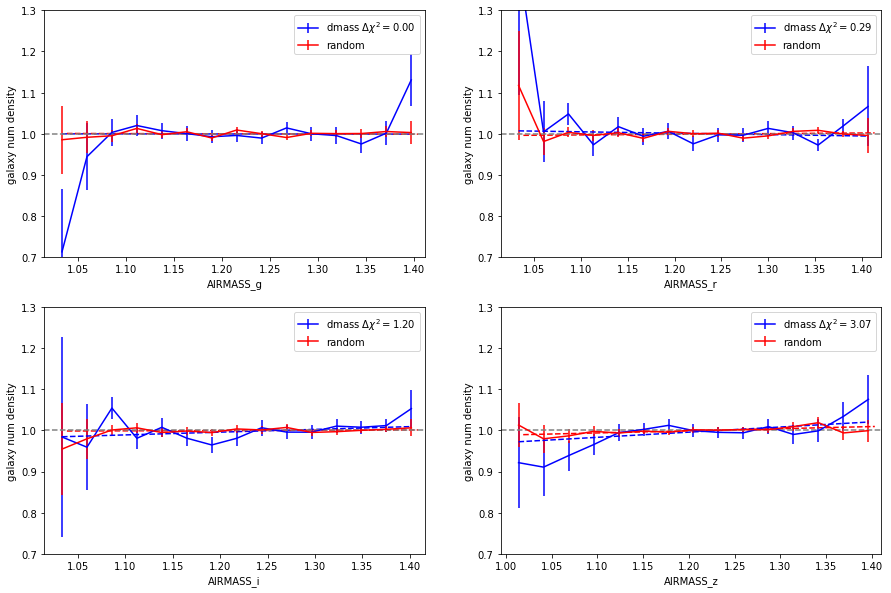

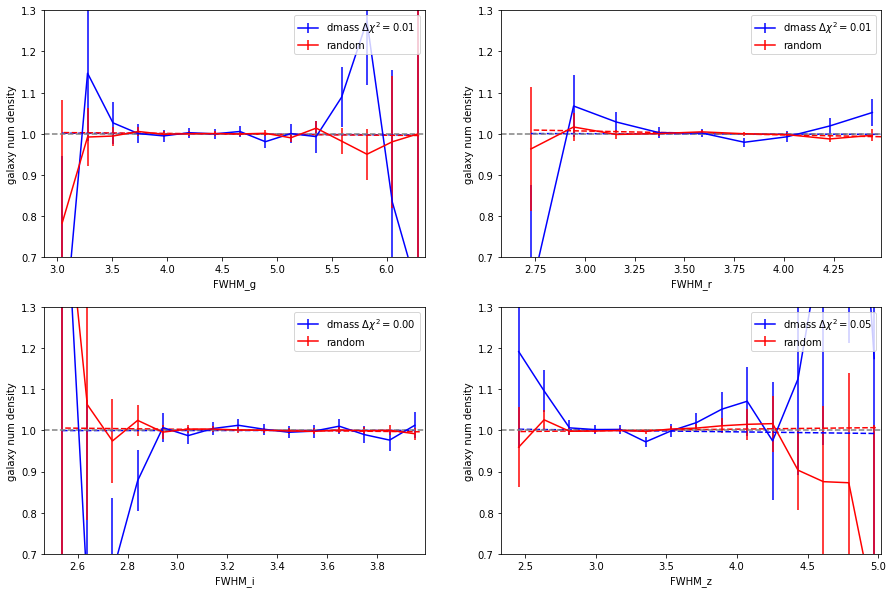

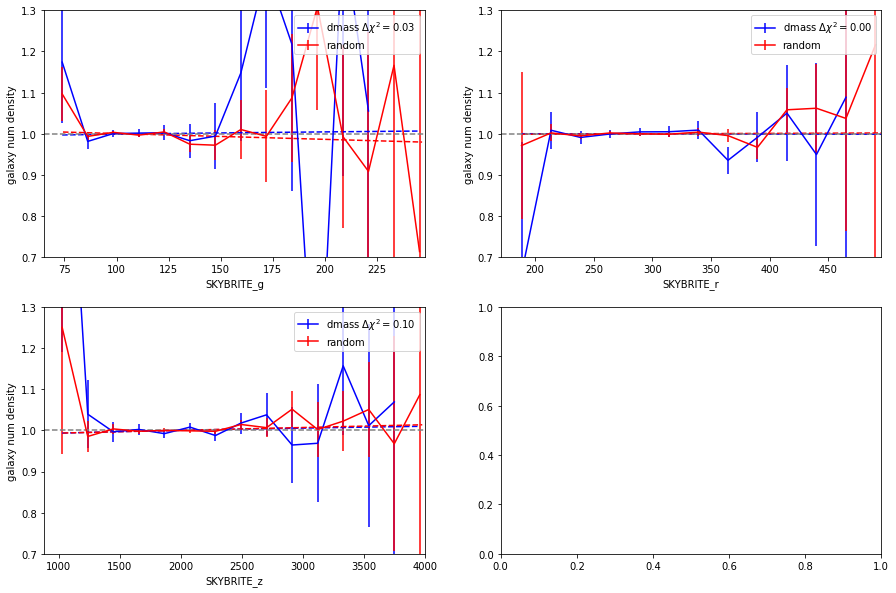

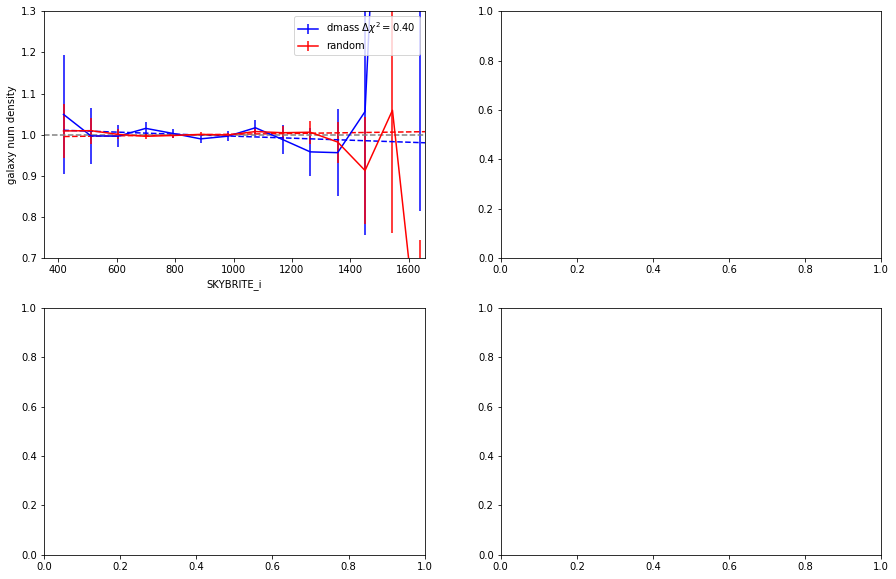

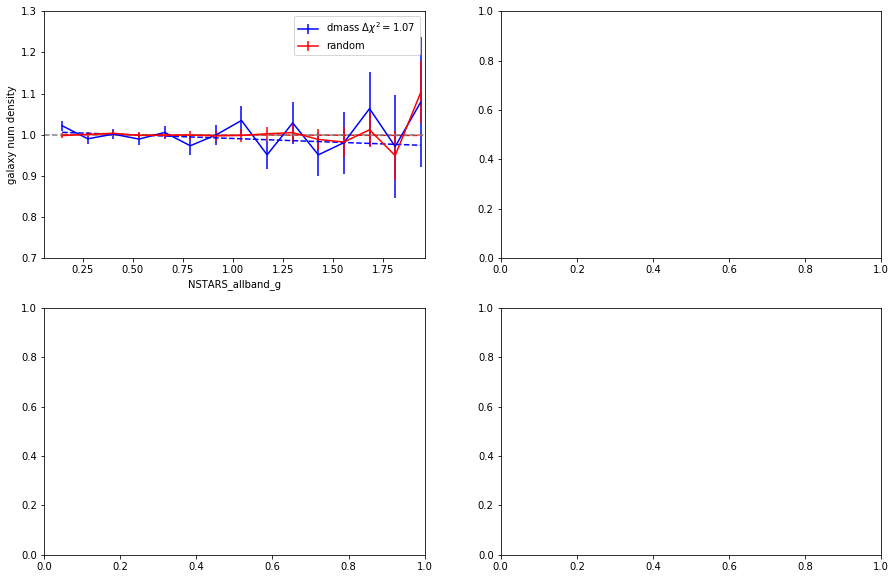

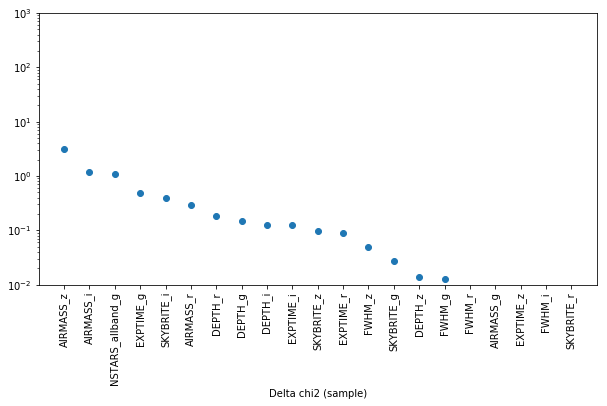

-------------------------
 iteration - 15
 nextweight AIRMASS_r
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'DEPTH_z', 'SKYBRITE_g', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
DEPTH_r
FWHM_g
FWHM_r
AIRMASS_z
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
DEPTH_z
SKYBRITE_g
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  AIRMASS_r
linear


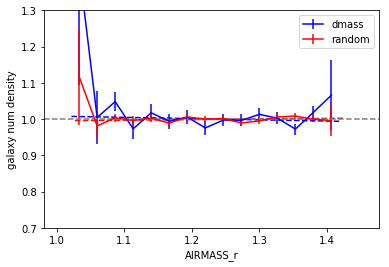

store weight  AIRMASS_r
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_airmass_r_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r
chi2_null =  5.516899285944005
chi2_mod. =  5.4030946996404285
Delta chi2 (sample) = 0.11380458630357637
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r.txt.model

chi2_null =  2.664534012190004
chi2_mod. =  2.5241571938957184
Delta chi2 (sample) = 0.1403768182942855
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r.txt.model

chi2_null =  2.591036

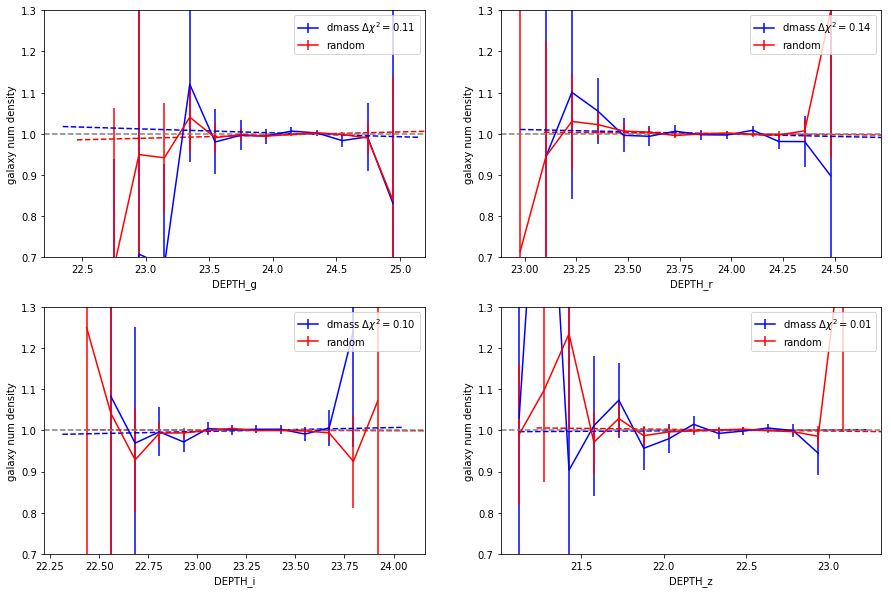

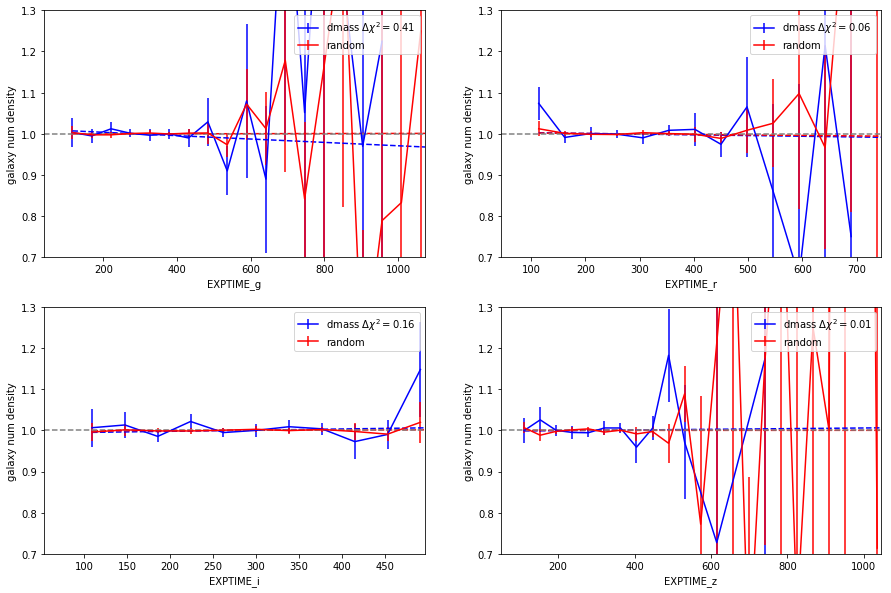

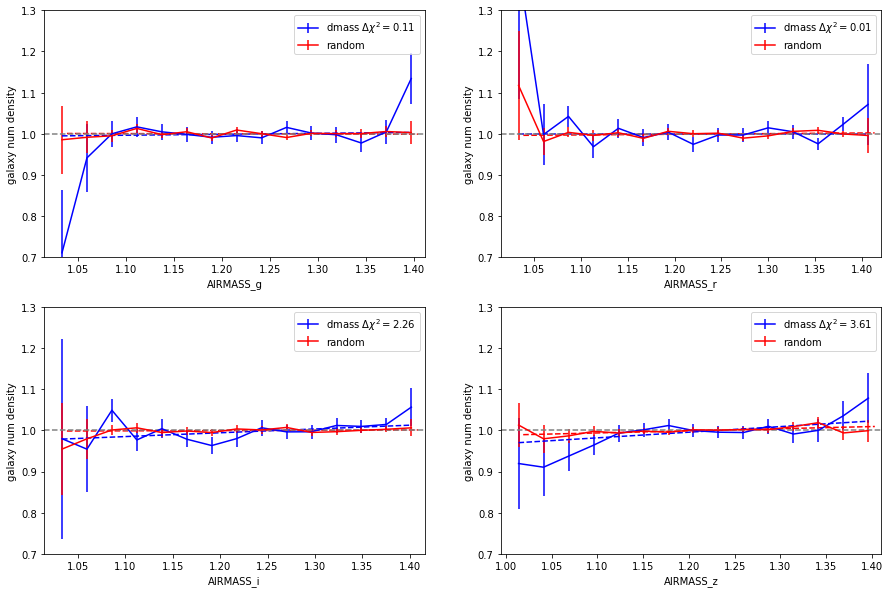

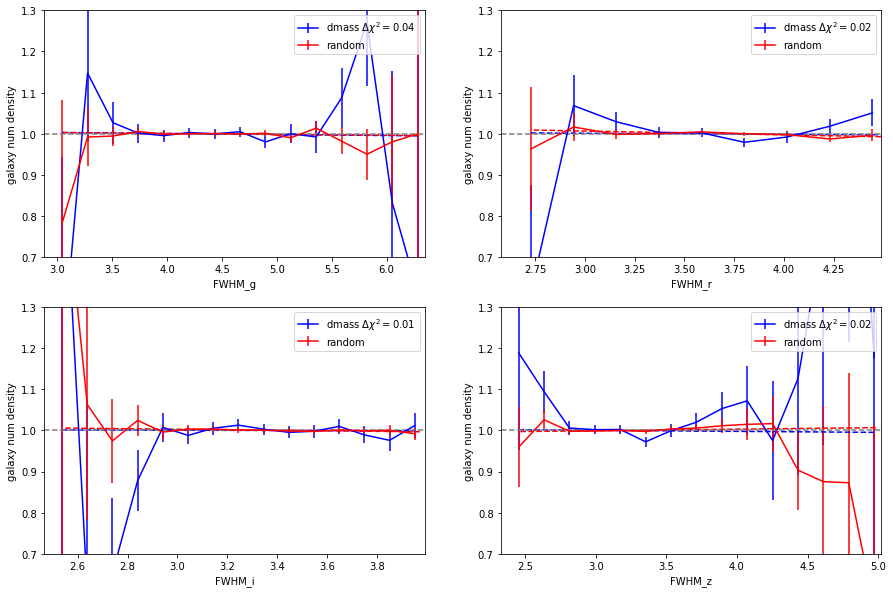

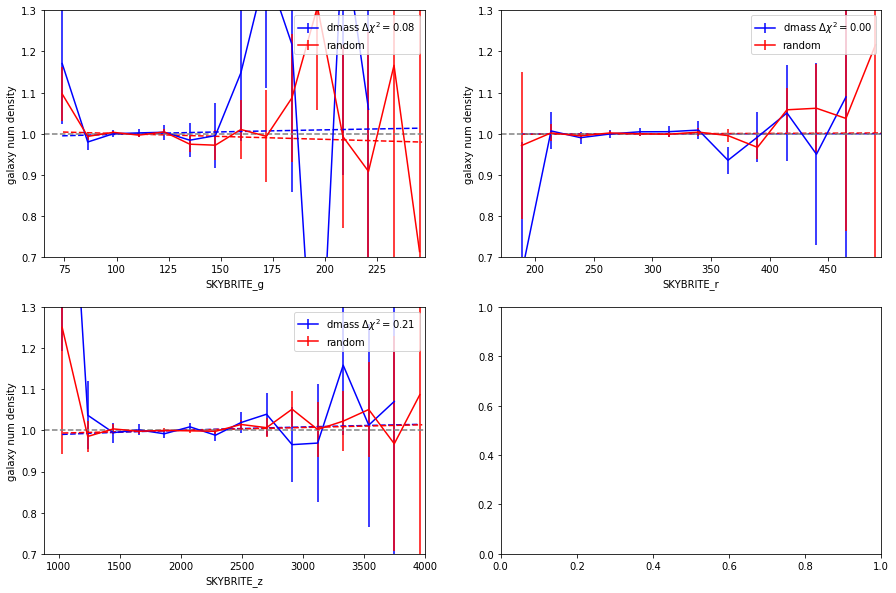

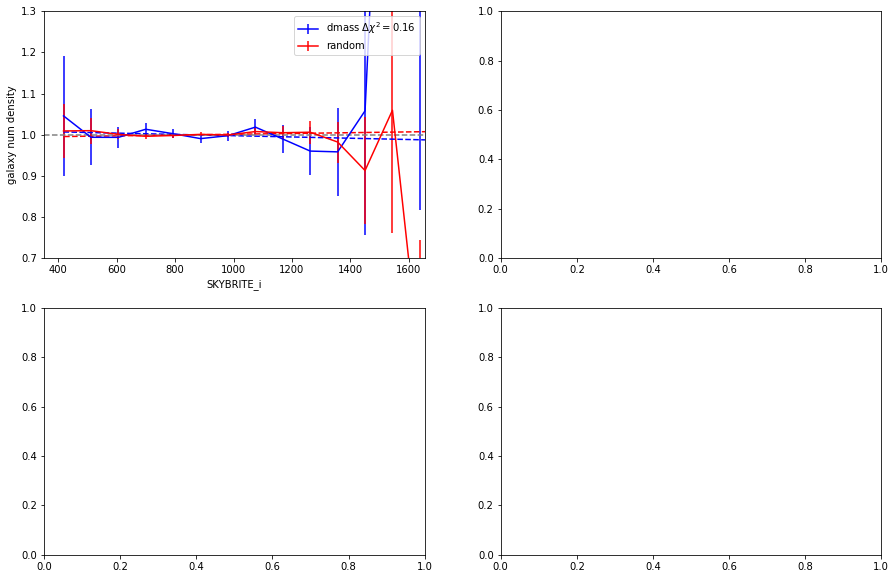

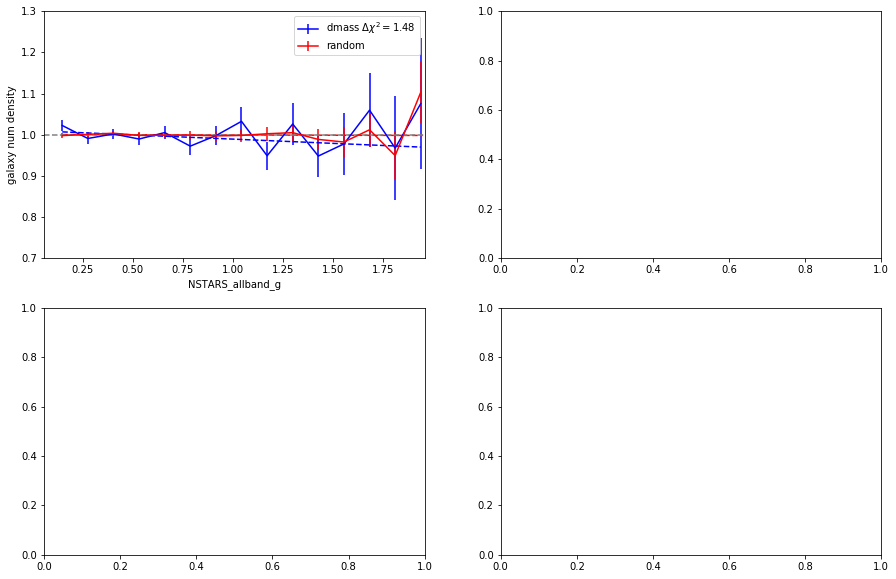

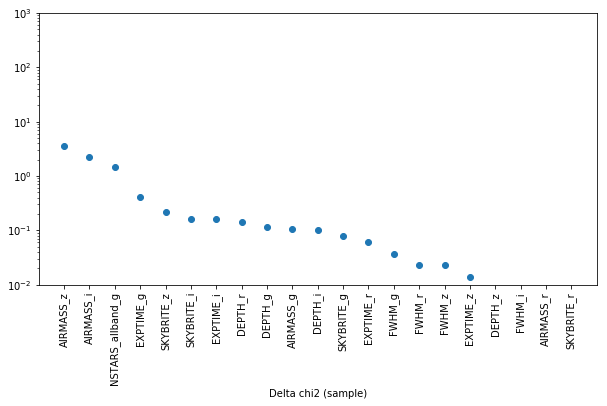

-------------------------
 iteration - 16
 nextweight SKYBRITE_z
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'AIRMASS_r', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'DEPTH_z', 'SKYBRITE_g', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
AIRMASS_r
DEPTH_r
FWHM_g
FWHM_r
AIRMASS_z
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
DEPTH_z
SKYBRITE_g
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  SKYBRITE_z
linear


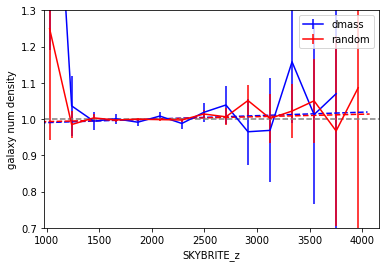

store weight  SKYBRITE_z
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_skybrite_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z
chi2_null =  5.560910031539087
chi2_mod. =  5.453274754988453
Delta chi2 (sample) = 0.1076352765506341
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z.txt.model

chi2_null =  2.61190695982695
chi2_mod. =  2.4995390124747194
Delta chi2 (sample) = 0.11236794735223077
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z

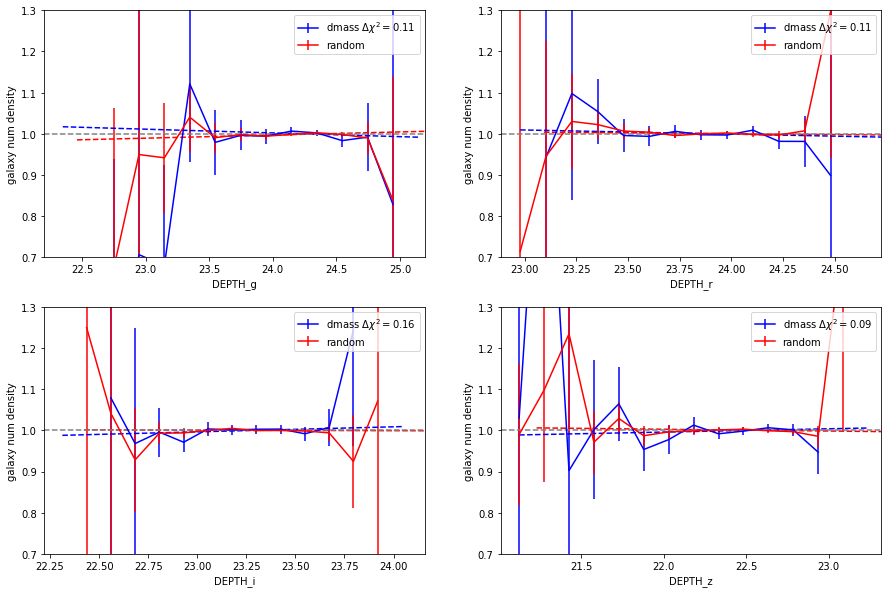

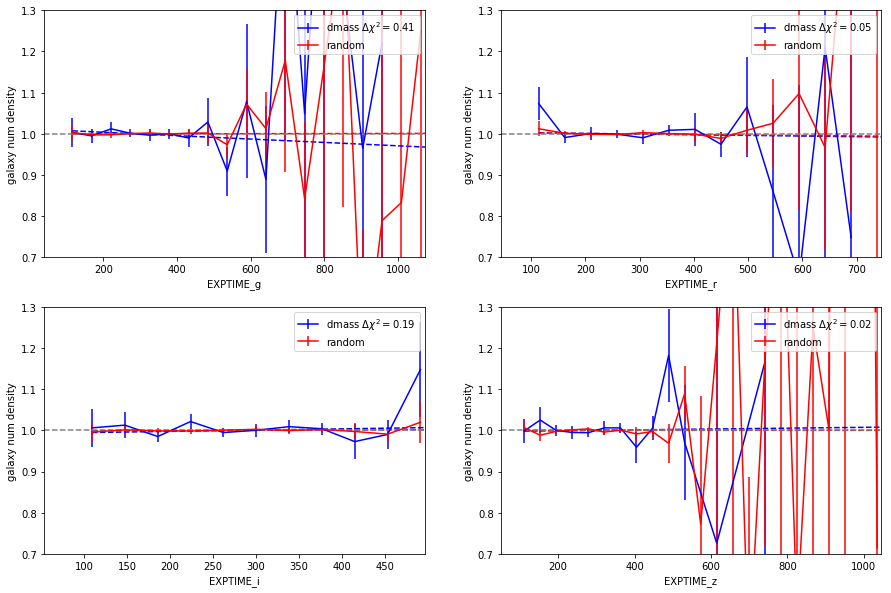

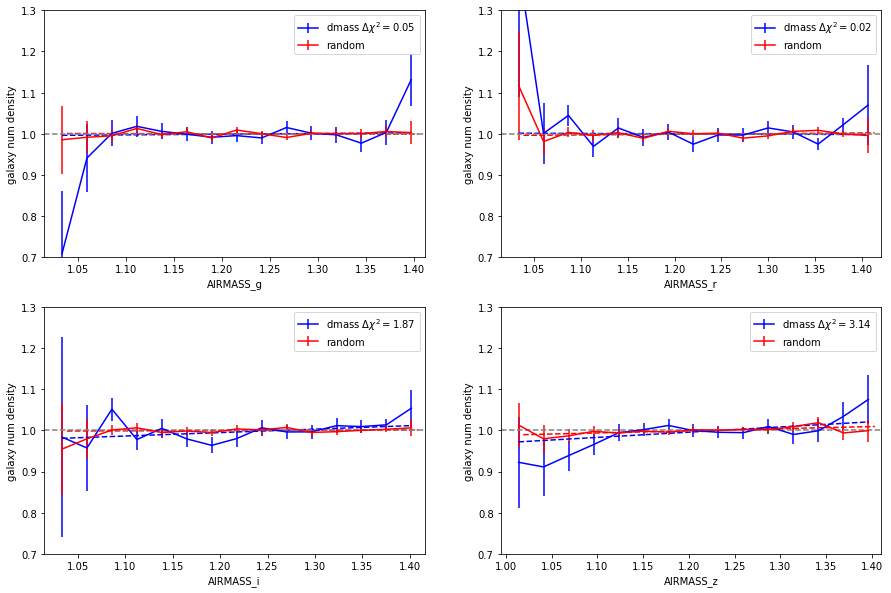

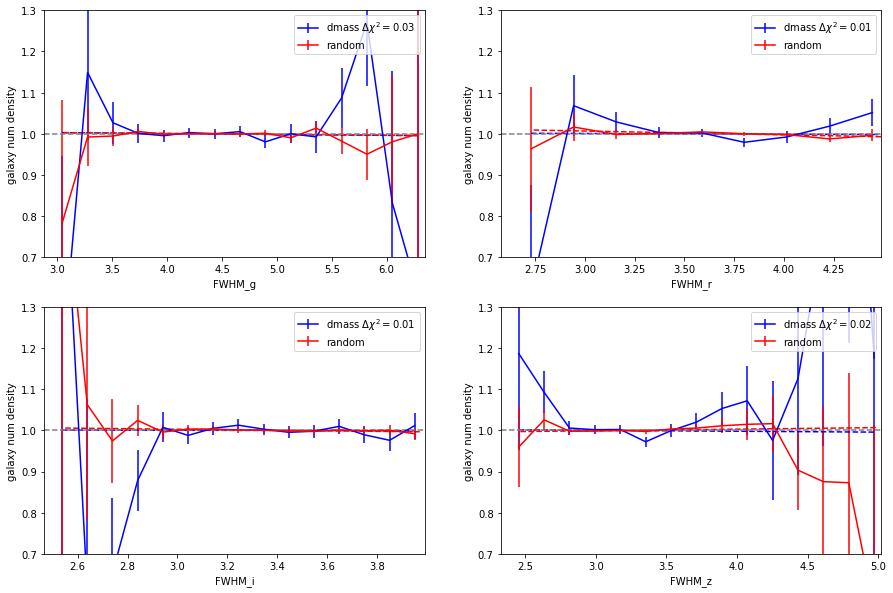

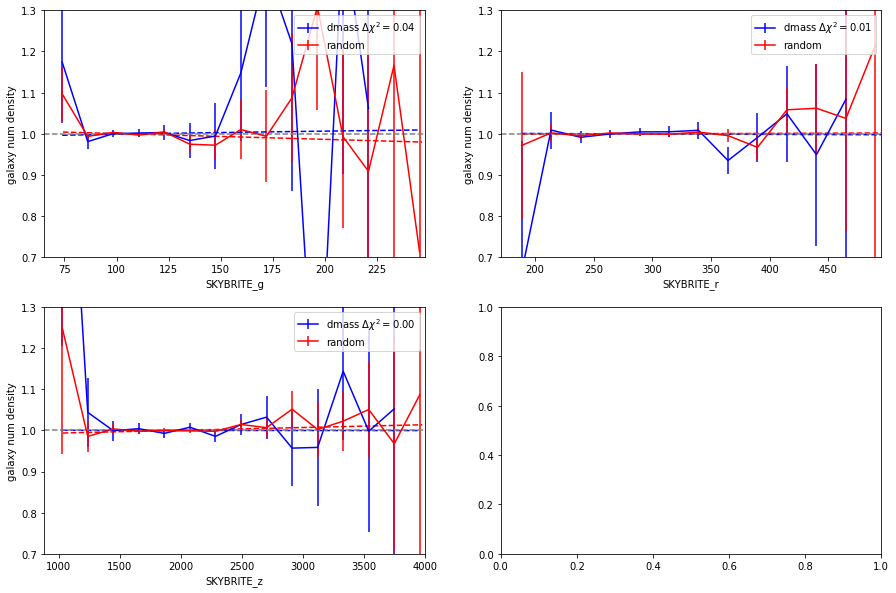

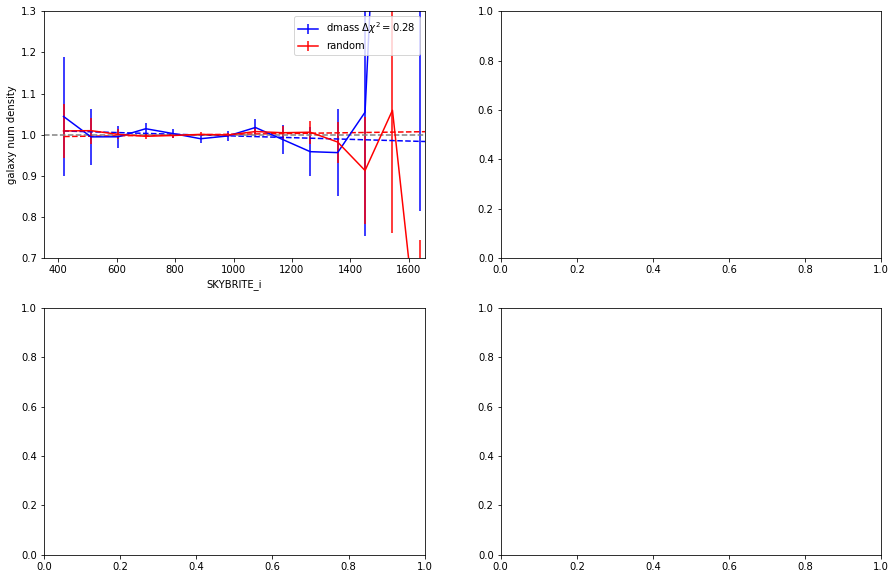

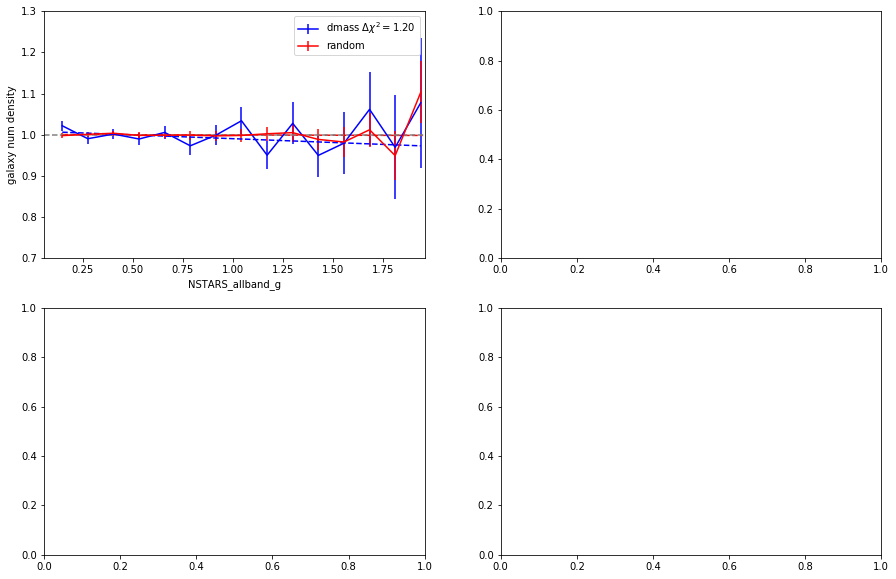

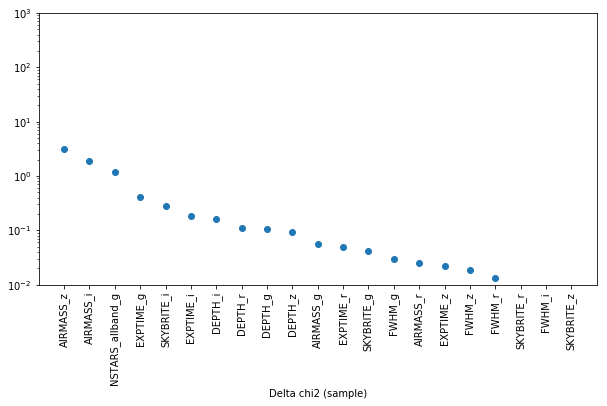

-------------------------
 iteration - 17
 nextweight DEPTH_i
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'AIRMASS_r', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'SKYBRITE_z', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'DEPTH_z', 'SKYBRITE_g', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
AIRMASS_r
DEPTH_r
FWHM_g
FWHM_r
SKYBRITE_z
AIRMASS_z
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
DEPTH_z
SKYBRITE_g
FWHM_z
AIRMASS_i
SKYBRITE_i
NSTARS_allband_g
----------------------------------
initialize function  DEPTH_i
linear


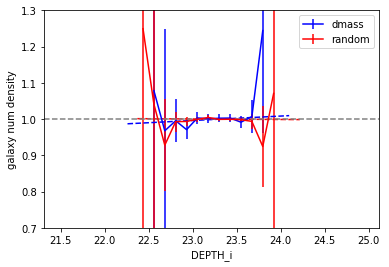

store weight  DEPTH_i
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_depth_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i
chi2_null =  5.8592575791660275
chi2_mod. =  5.562510507297743
Delta chi2 (sample) = 0.29674707186828453
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i.txt.model

chi2_null =  2.8557457665573525
chi2_mod. =  2.482116271550686
Delta chi2 (sample) = 0.37362949500666653
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass

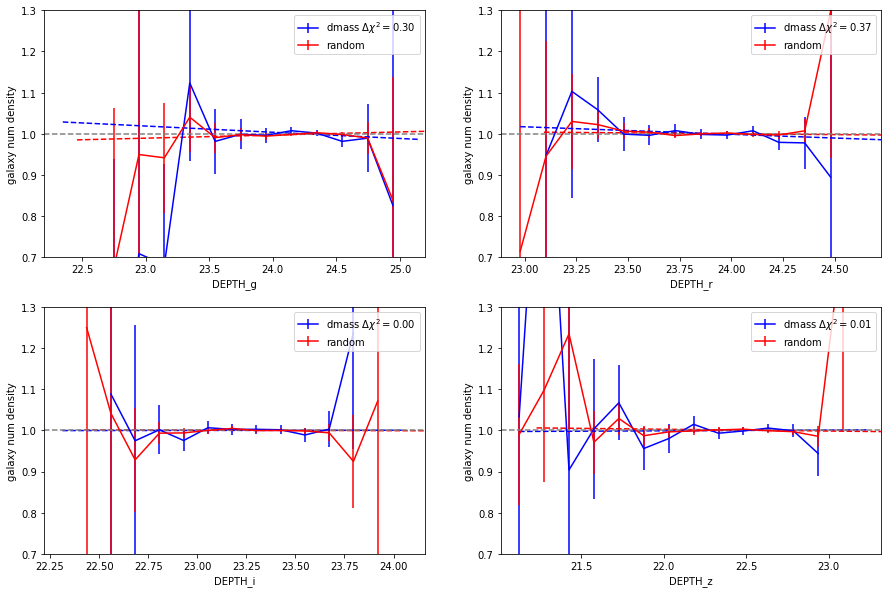

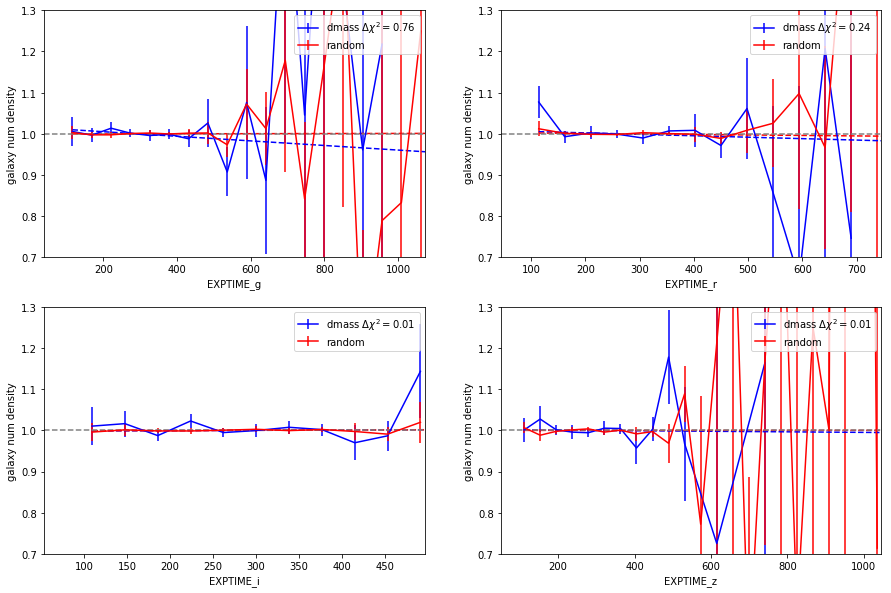

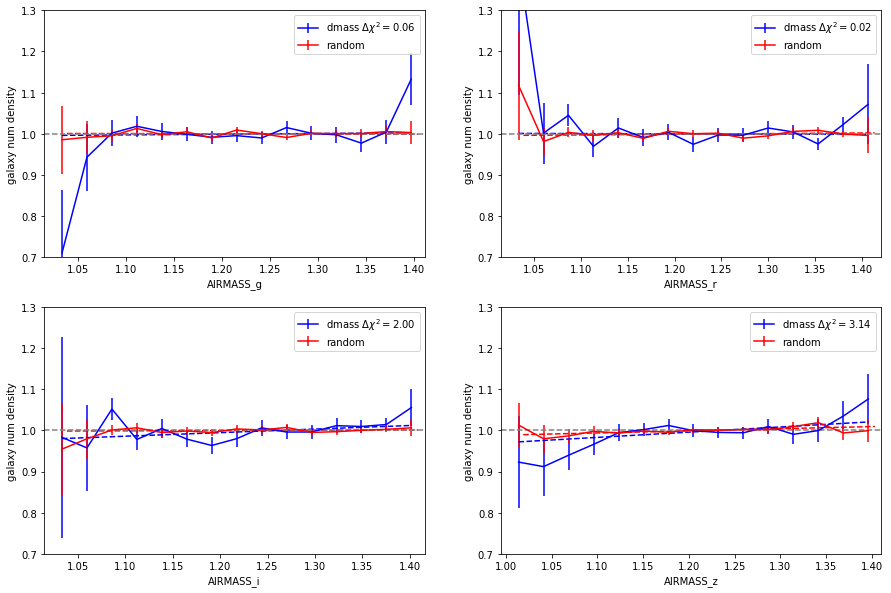

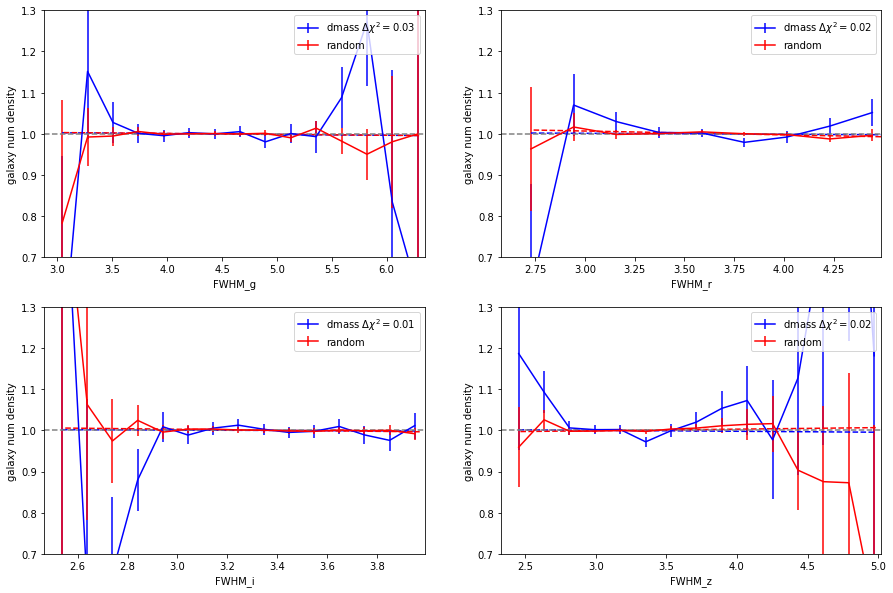

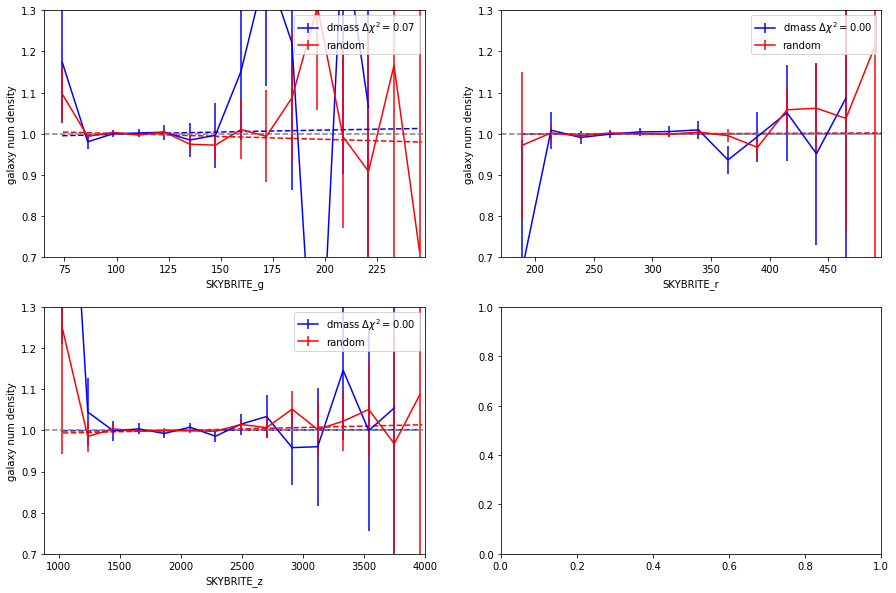

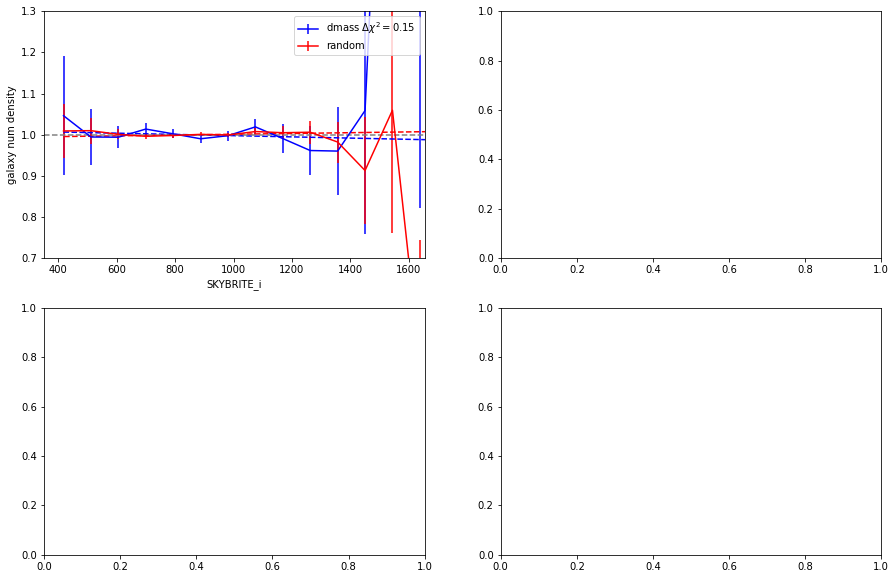

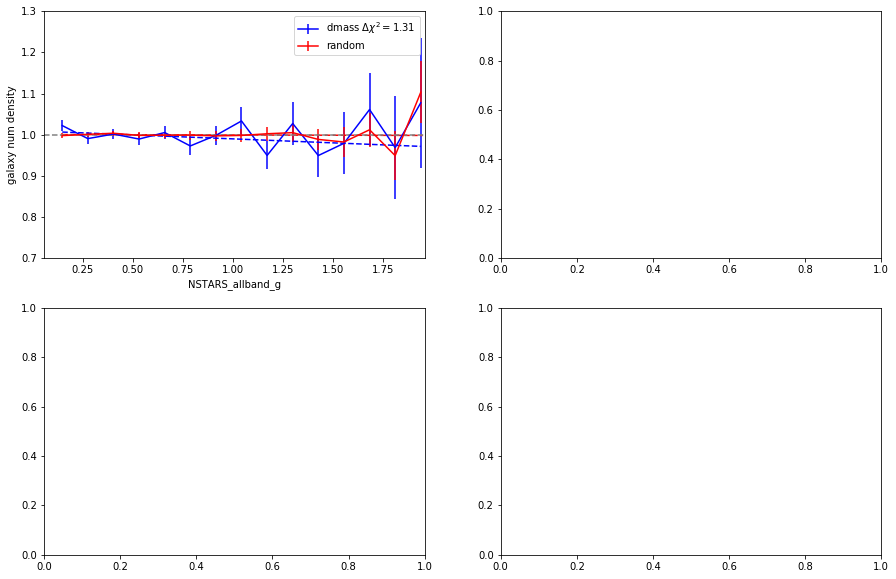

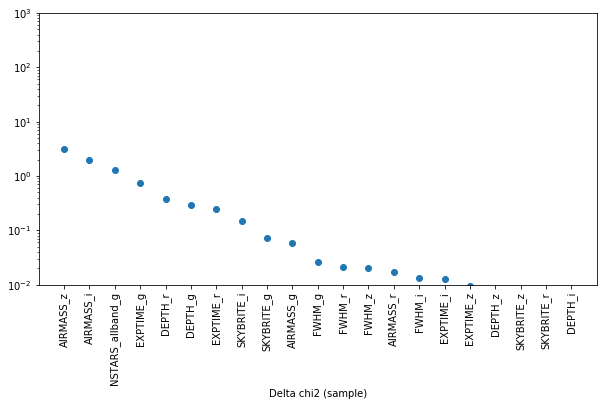

-------------------------
 iteration - 18
 nextweight DEPTH_g
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'AIRMASS_r', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'SKYBRITE_z', 'AIRMASS_z', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'DEPTH_z', 'SKYBRITE_g', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'DEPTH_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
AIRMASS_r
DEPTH_r
FWHM_g
FWHM_r
SKYBRITE_z
AIRMASS_z
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
DEPTH_z
SKYBRITE_g
FWHM_z
AIRMASS_i
SKYBRITE_i
DEPTH_i
NSTARS_allband_g
----------------------------------
initialize function  DEPTH_g
linear


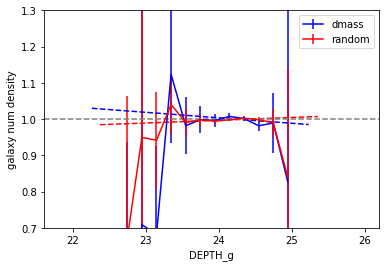

store weight  DEPTH_g
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_depth_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i_depth_g
chi2_null =  5.5696342621522215
chi2_mod. =  5.56634100509463
Delta chi2 (sample) = 0.0032932570575914255
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i_depth_g.txt.model

chi2_null =  2.558896689776156
chi2_mod. =  2.4921259167761782
Delta chi2 (sample) = 0.0667707729999778
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_sk

[3.2466485660503714, 2.1709746035046233, 1.3628365177620996, 0.196527323031499, 0.1739544185570363, 0.12564449999139704, 0.12038642879721895, 0.09889087606959723, 0.0667707729999778, 0.06095838175628643, 0.04909366727821407, 0.022169771066569588, 0.02082974528909176, 0.01857125484491995, 0.016619280335364195, 0.015436050437648063, 0.01079811462006397, 0.009247551682912913, 0.004589385980890981, 0.0032932570575914255, 0.003131170645147563]


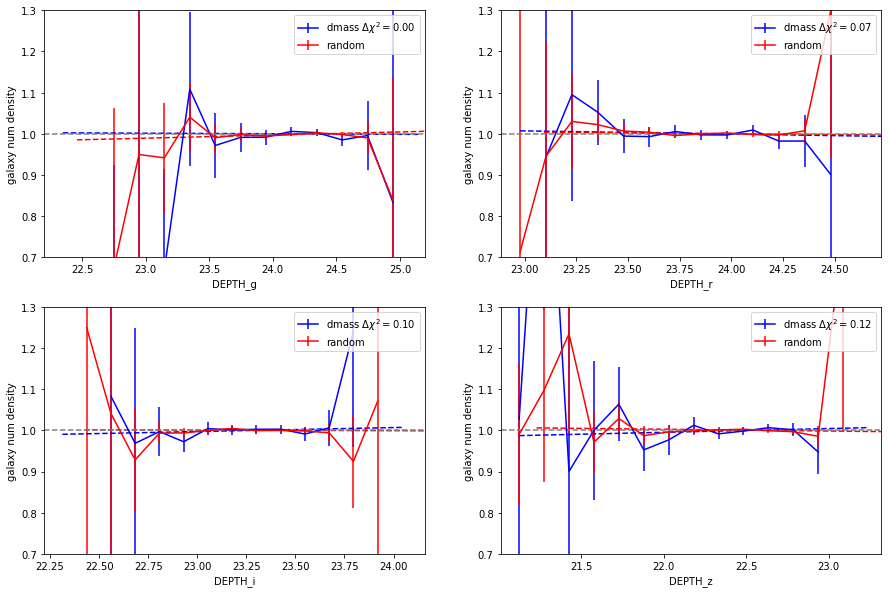

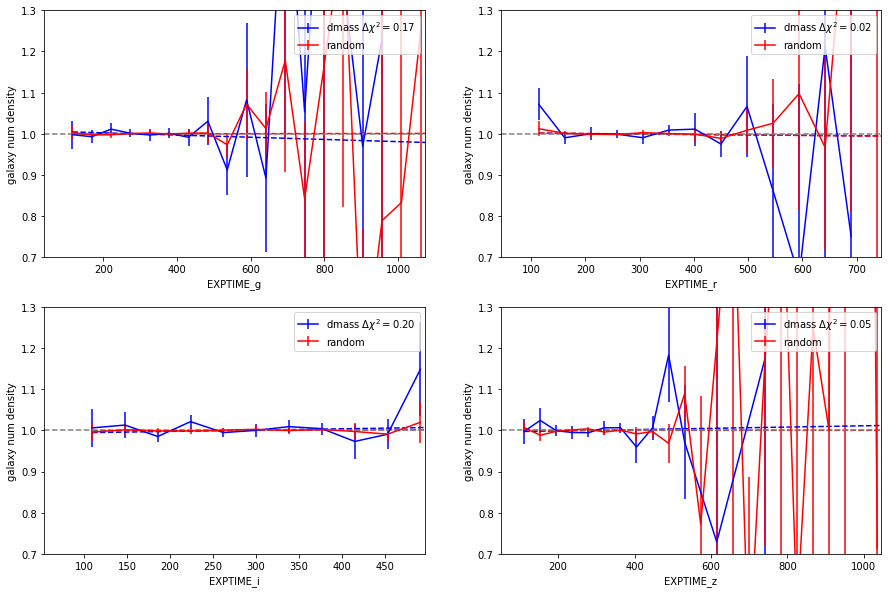

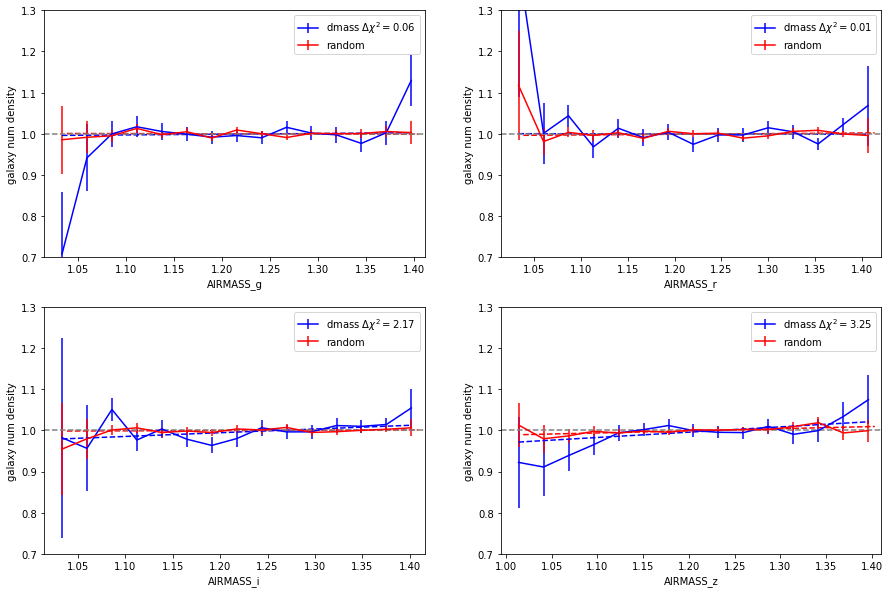

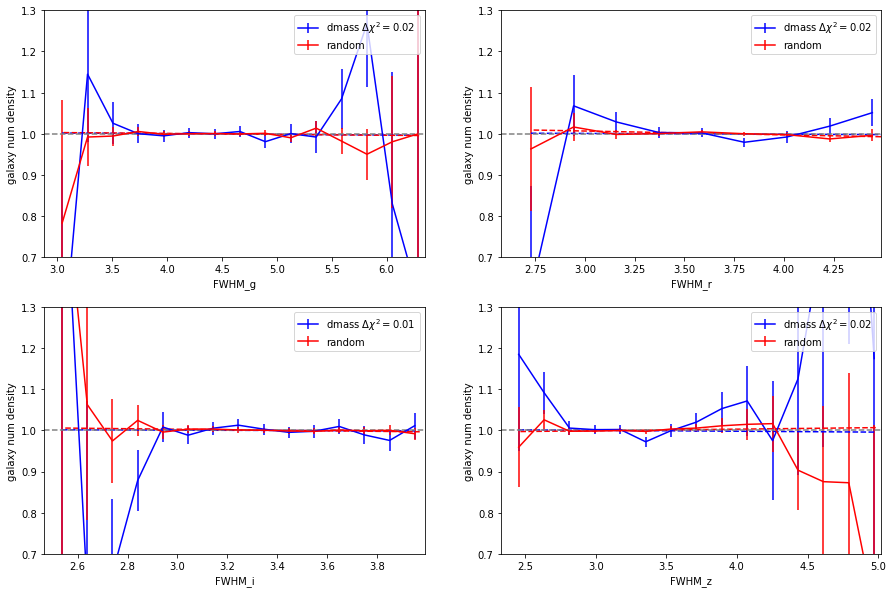

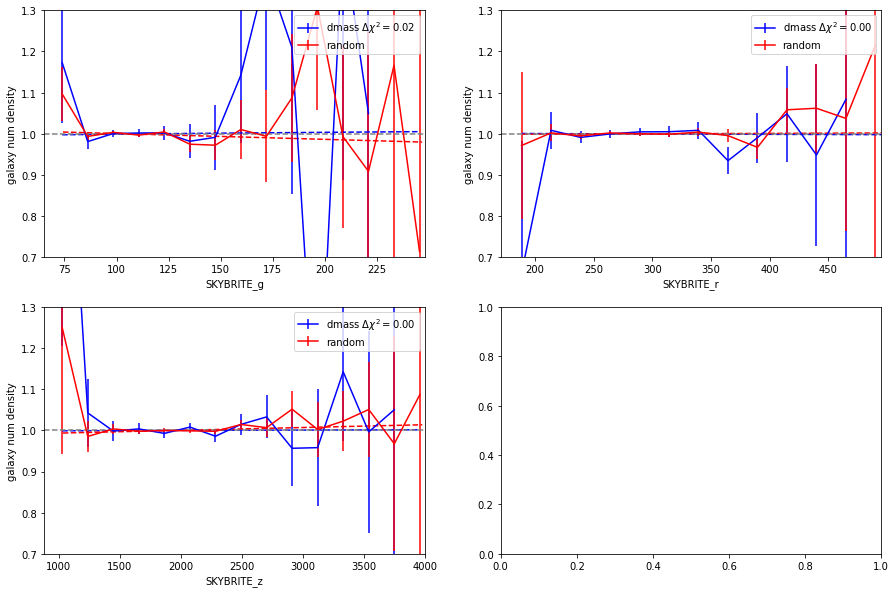

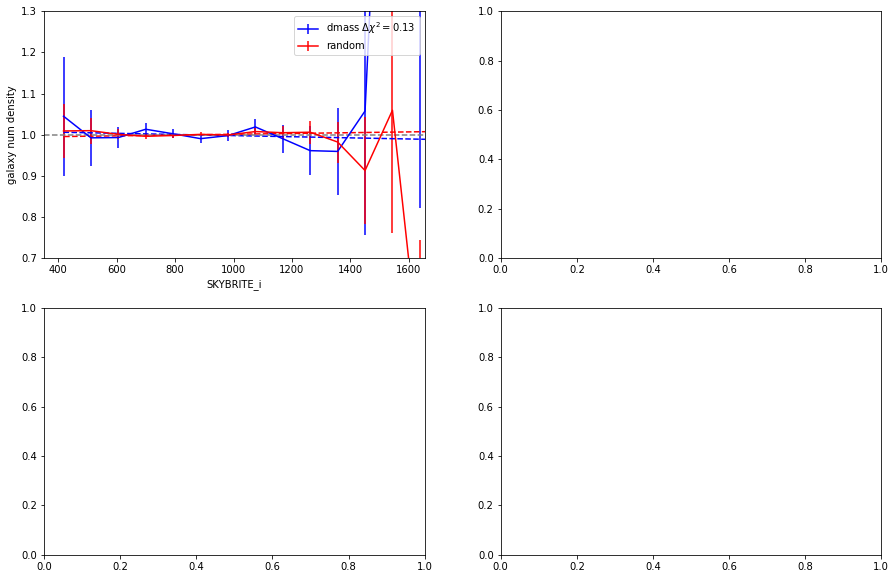

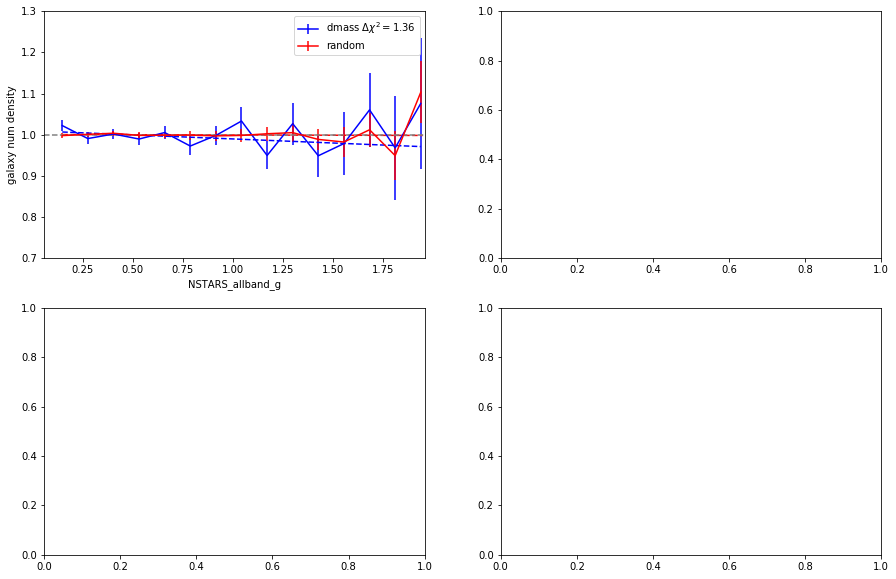

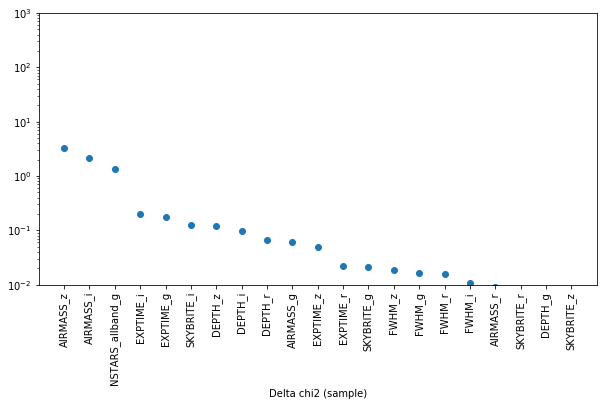

-------------------------
 iteration - 19
 nextweight AIRMASS_g
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'AIRMASS_r', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'SKYBRITE_z', 'AIRMASS_z', 'DEPTH_g', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'DEPTH_z', 'SKYBRITE_g', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'DEPTH_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
AIRMASS_r
DEPTH_r
FWHM_g
FWHM_r
SKYBRITE_z
AIRMASS_z
DEPTH_g
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
DEPTH_z
SKYBRITE_g
FWHM_z
AIRMASS_i
SKYBRITE_i
DEPTH_i
NSTARS_allband_g
----------------------------------
initialize function  AIRMASS_g
linear


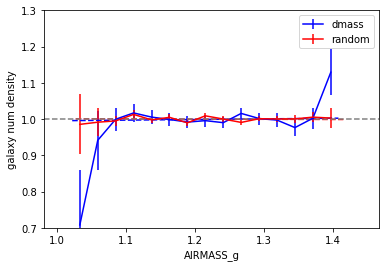

store weight  AIRMASS_g
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_airmass_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i_depth_g_airmass_g
chi2_null =  5.7009627505519695
chi2_mod. =  5.700005215592545
Delta chi2 (sample) = 0.000957534959424855
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i_depth_g_airmass_g.txt.model

chi2_null =  2.389839544423573
chi2_mod. =  2.325698226248632
Delta chi2 (sample) = 0.06414131817494129
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_d

[3.049012939723589, 1.8382325647845725, 1.263571033279856, 0.1964028499000925, 0.17746918283981206, 0.1668294693196204, 0.16176779223610716, 0.1232569669403456, 0.06414131817494129, 0.05635438221320754, 0.056249675846048675, 0.022708630040501276, 0.020407094632309608, 0.009739418545700929, 0.009399143554297495, 0.008597184271668112, 0.0077385439754245056, 0.003640249760261227, 0.0027298610769310727, 0.000957534959424855, 0.0008654228186077972]


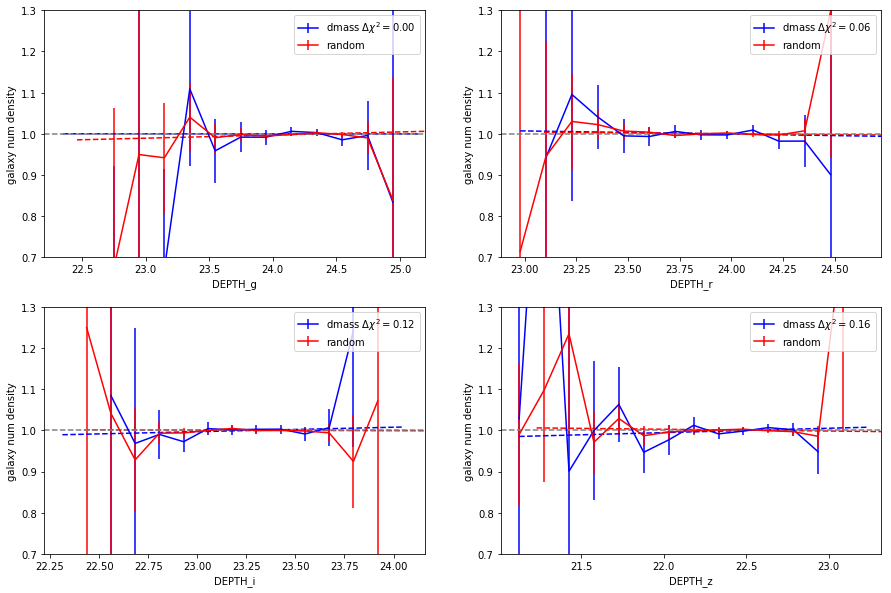

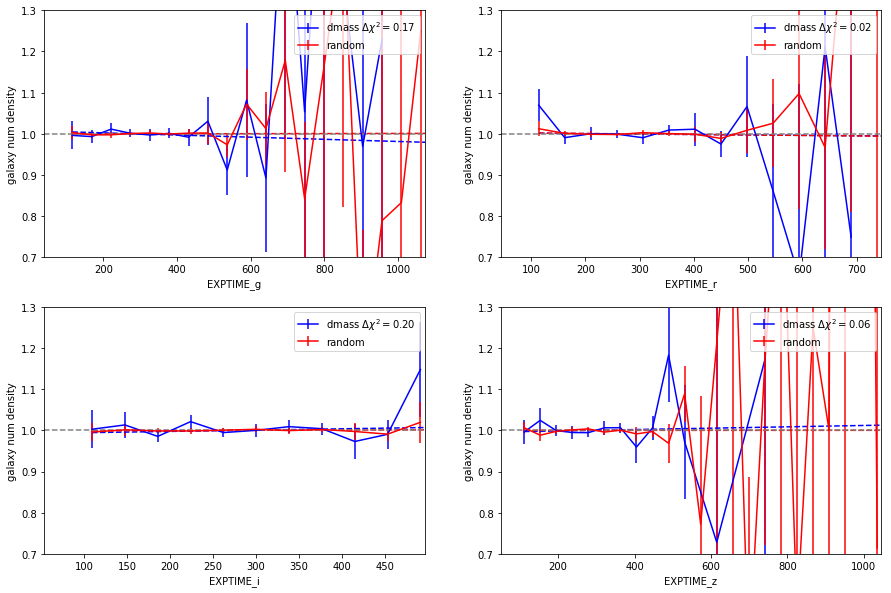

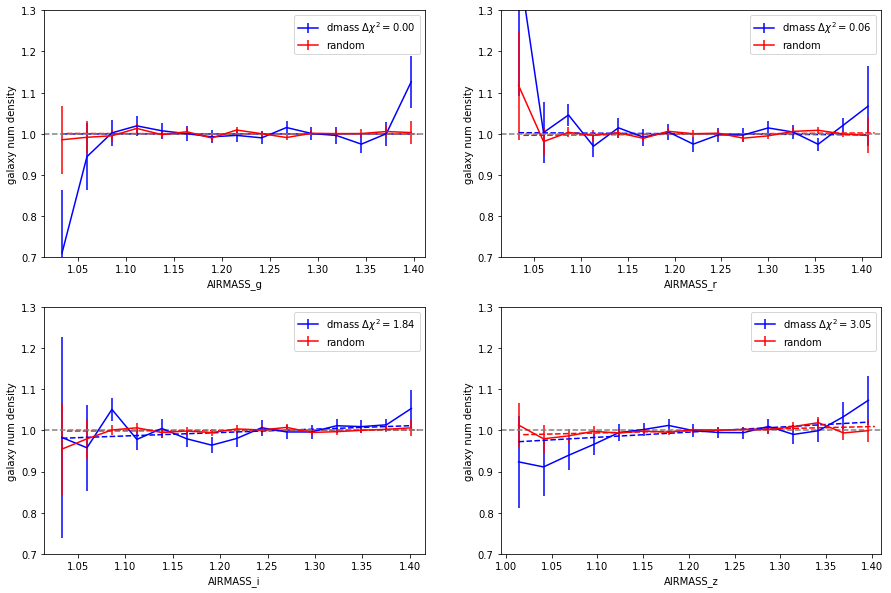

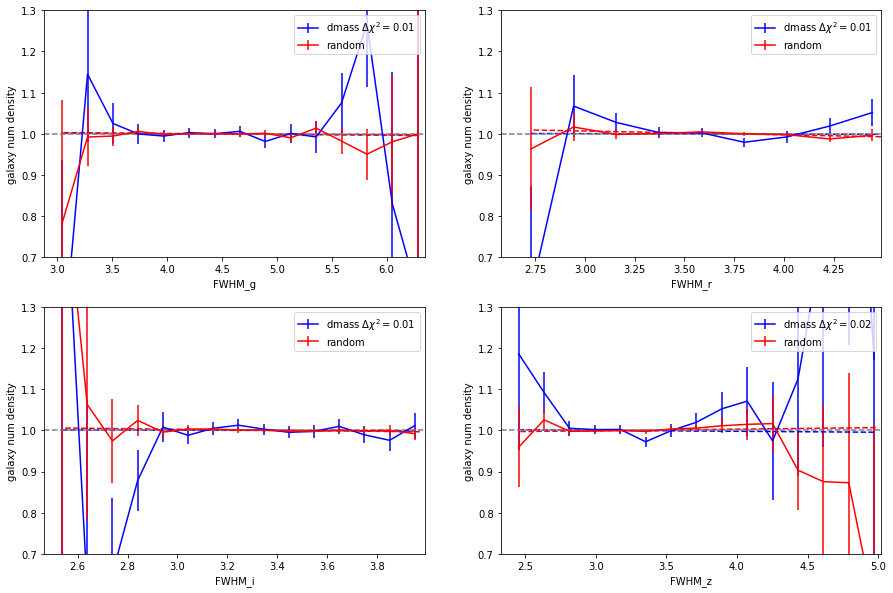

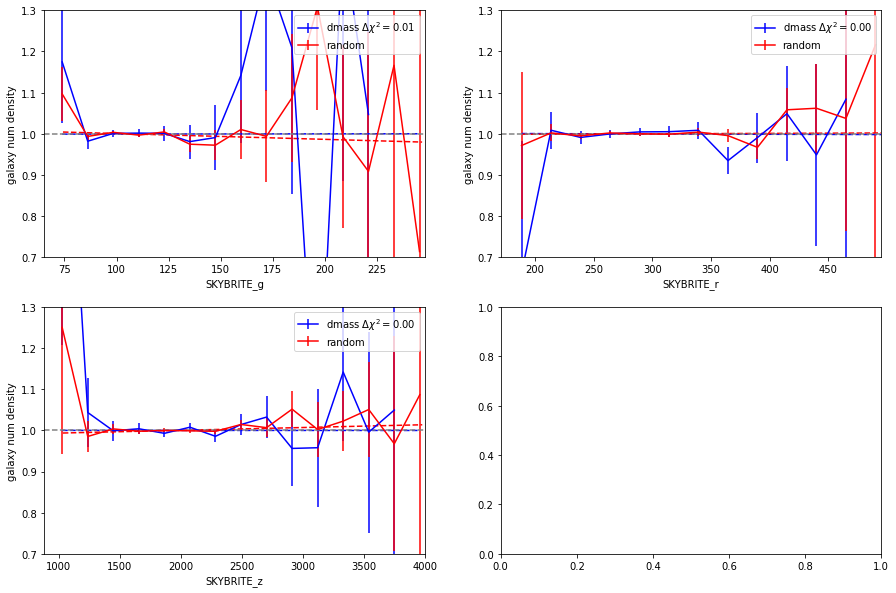

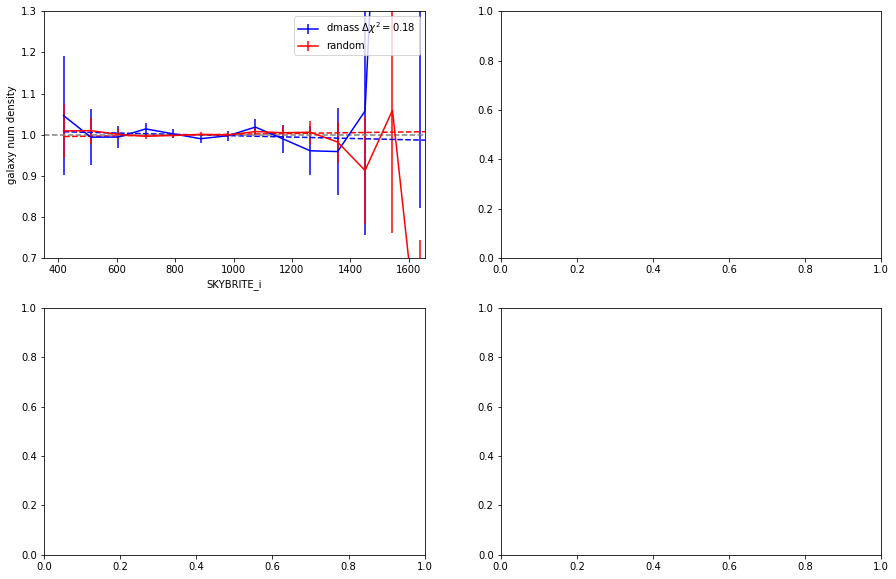

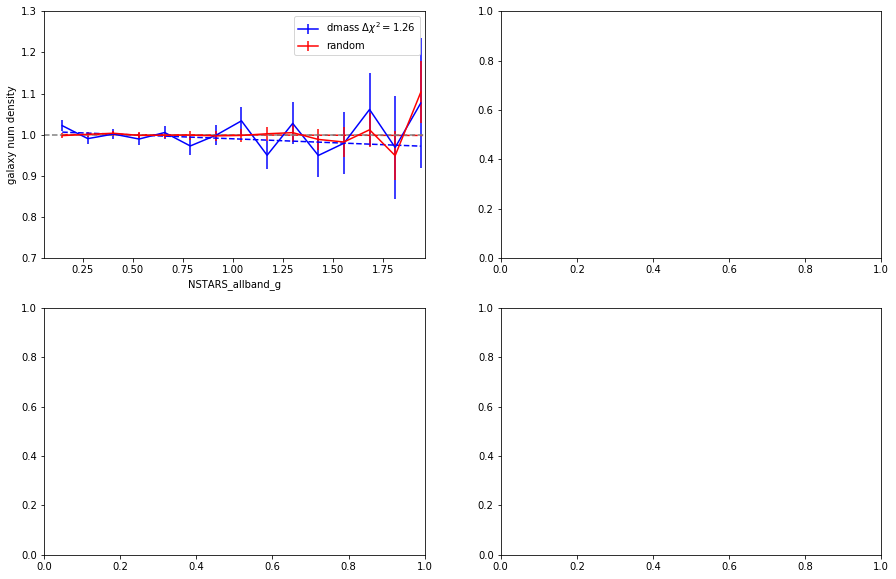

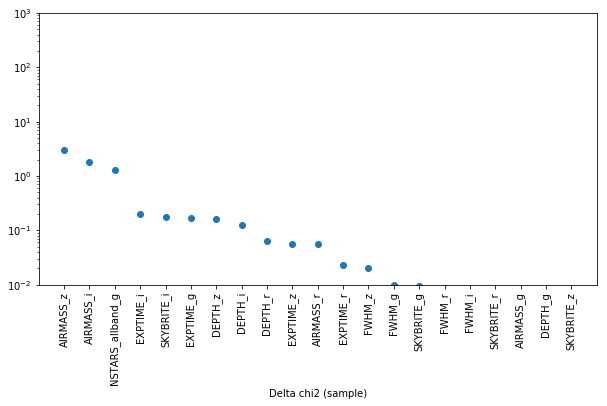

-------------------------
 iteration - 20
 nextweight EXPTIME_r
-------------------------
['SKYBRITE_r', 'EXPTIME_z', 'AIRMASS_r', 'DEPTH_r', 'FWHM_g', 'FWHM_r', 'SKYBRITE_z', 'AIRMASS_z', 'AIRMASS_g', 'DEPTH_g', 'EXPTIME_g', 'noweight', 'FWHM_i', 'EXPTIME_i', 'DEPTH_z', 'SKYBRITE_g', 'FWHM_z', 'AIRMASS_i', 'SKYBRITE_i', 'DEPTH_i', 'NSTARS_allband_g']
SKYBRITE_r
EXPTIME_z
AIRMASS_r
DEPTH_r
FWHM_g
FWHM_r
SKYBRITE_z
AIRMASS_z
AIRMASS_g
DEPTH_g
EXPTIME_g
noweight
FWHM_i
EXPTIME_i
DEPTH_z
SKYBRITE_g
FWHM_z
AIRMASS_i
SKYBRITE_i
DEPTH_i
NSTARS_allband_g
----------------------------------
initialize function  EXPTIME_r
linear


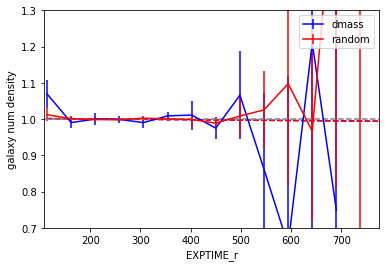

store weight  EXPTIME_r
save weight to fits ../data_txt/systematics/6th_ignore_ge//weights/wg_exptime_r_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i_depth_g_airmass_g_exptime_r
chi2_null =  5.636499494688341
chi2_mod. =  5.627773403712668
Delta chi2 (sample) = 0.008726090975672562
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i_depth_g_airmass_g_exptime_r.txt.model

chi2_null =  2.3423446063946542
chi2_mod. =  2.325619720915801
Delta chi2 (sample) = 0.016724885478853313
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_

chi2_null =  10.837409432001802
chi2_mod. =  9.586142230594257
Delta chi2 (sample) = 1.2512672014075452
output save to  ../data_txt/systematics/6th_ignore_ge/systematic_NSTARS_allband_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r_fwhm_i_depth_z_skybrite_g_airmass_r_skybrite_z_depth_i_depth_g_airmass_g_exptime_r.txt.model

[3.071723238333586, 1.8780573885791316, 1.2512672014075452, 0.3155045575332869, 0.23721021386815, 0.2028606638523427, 0.16944221327575804, 0.11476945121072646, 0.0909544656639012, 0.05020542735618427, 0.01924470071748985, 0.016724885478853313, 0.011136132172316238, 0.0093893594753105, 0.008726090975672562, 0.007336748914864799, 0.00723186054754521, 0.005359239515065006, 0.0029712878118210995, 0.0013355586000933783, 0.0009187562438528474]


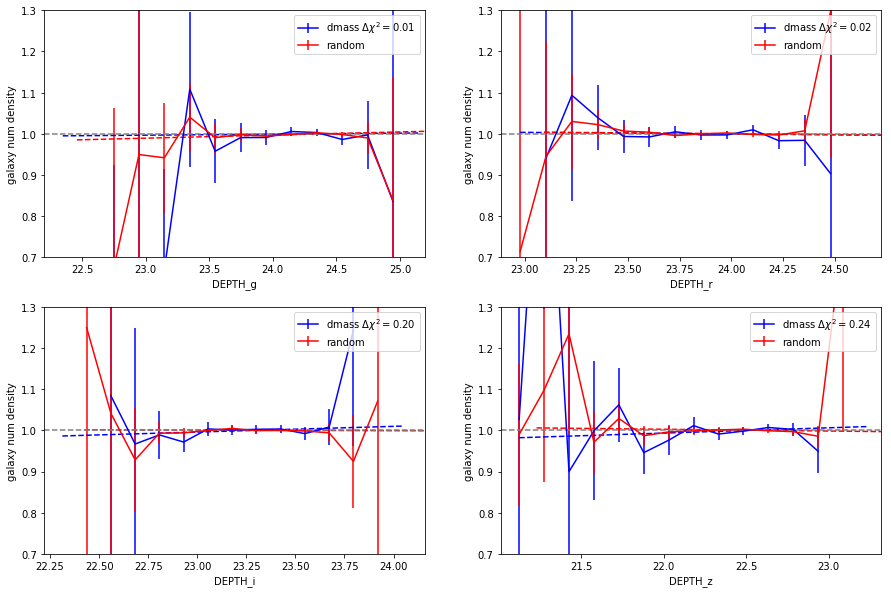

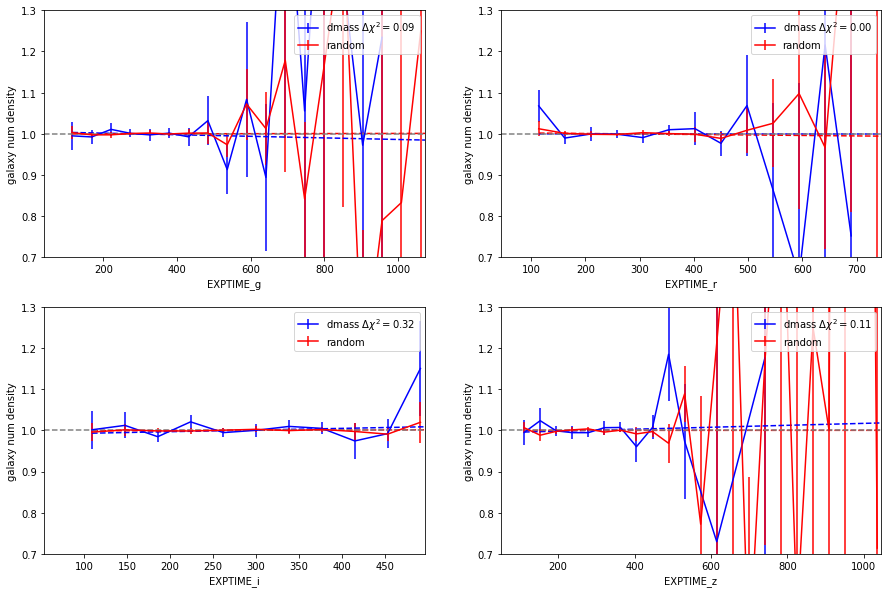

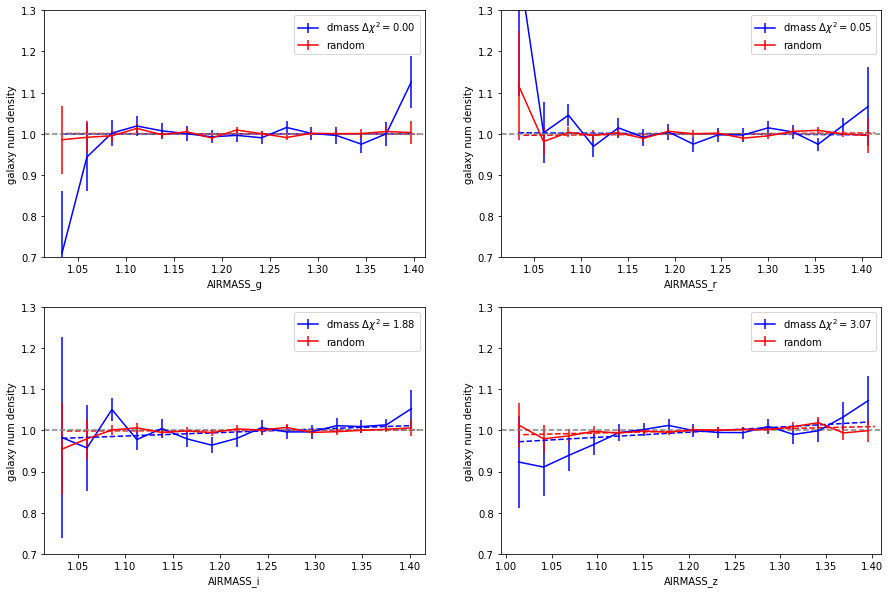

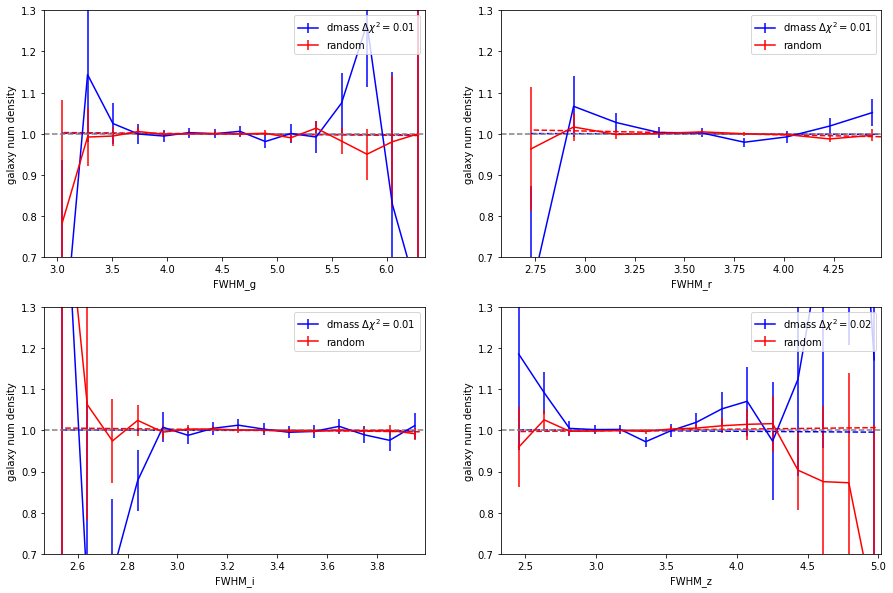

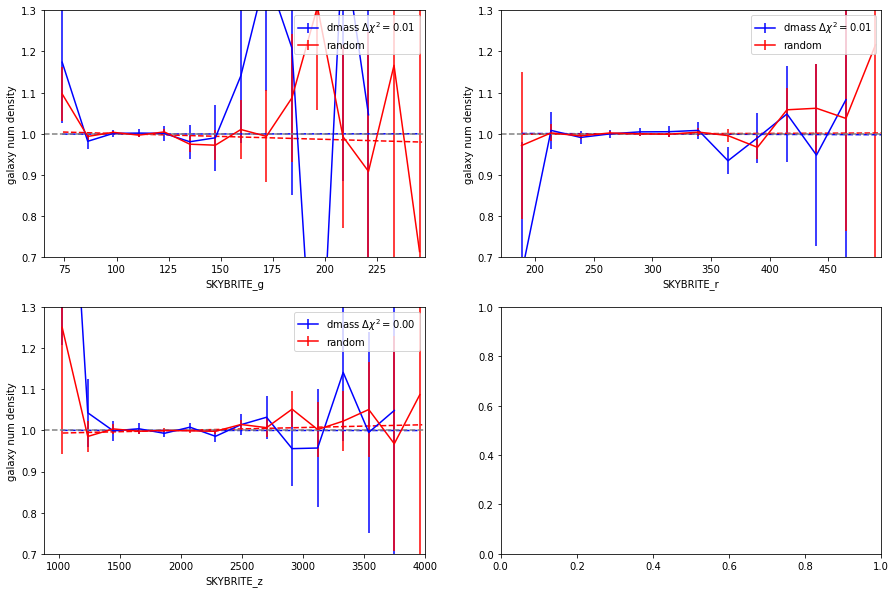

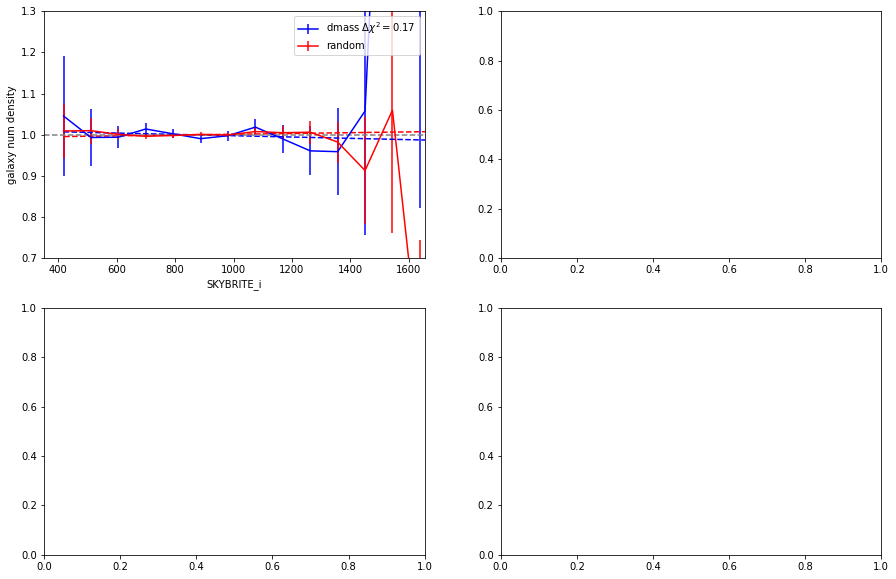

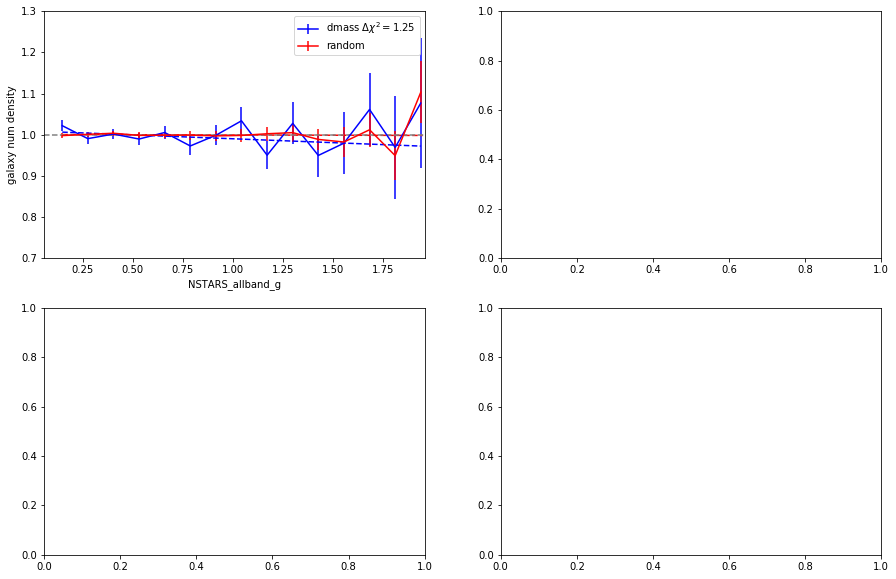

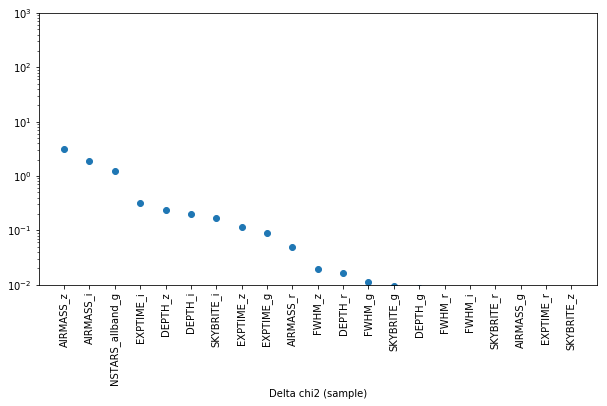

In [84]:
applied_weight = []
for ii in range(21):
    
    #nextweight = 'AIRMASS_g'
    print '-------------------------'
    print ' iteration -', ii
    print ' nextweight', nextweight
    print '-------------------------'
    #if ii < 4 : pp = []
    #else : pp = properties
    all_weight = weightmultiply(weightDic)
    function = 'linear'
    if nextweight == 'SKYBRITE_i': function = 'errftn'
    sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                      cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                      sysMap = sysMap, nside=4096, kind='SPT', function=function, function2 = None,
                      properties = properties, filters=['g', 'r', 'i', 'z'],
                      path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

    if suffix == 'no_weight': suffix = 'wg_'+nextweight.lower()
    else : suffix = suffix+'_'+nextweight.lower()
        
    fitting_allSP( suffix, inputdir = inputdir )
    nextwname, nextw = plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                          suffix=suffix, 
                    path = inputdir, deltachi2=True)
    
    nextweight = nextwname[0]
    for i in range(1,len(nextwname)):
        if nextweight in applied_weight :
            nextweight = nextwname[i]
        else : break
    applied_weight.append(nextweight)



In [119]:
suf2 = 'wg_fwhm_r_airmass_z_airmass_i_nstarsallband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r'
orderlabel = suf2.split('_')[1:]
order = []
for i in np.arange(0, len(orderlabel), 2):
    order.append( orderlabel[i]+'_'+orderlabel[i+1] )
print order
order[3] ='nstars_allband_g' 

['fwhm_r', 'airmass_z', 'airmass_i', 'nstarsallband_g', 'skybrite_i', 'fwhm_g', 'skybrite_r', 'exptime_i', 'fwhm_z', 'exptime_g', 'exptime_z', 'depth_r']


In [121]:
weightDic = {}
weightDic['noweight'] = np.ones(dmass_masked.size)
for o in order : 
    weightDic[o] = fitsio.read(inputdir+'weights/wg_'+o+'_SPT.fits')

In [122]:
all_weight = weightmultiply(weightDic)

['skybrite_r', 'exptime_z', 'depth_r', 'fwhm_g', 'fwhm_r', 'airmass_z', 'exptime_g', 'noweight', 'exptime_i', 'fwhm_z', 'airmass_i', 'skybrite_i', 'nstars_allband_g']
skybrite_r
exptime_z
depth_r
fwhm_g
fwhm_r
airmass_z
exptime_g
noweight
exptime_i
fwhm_z
airmass_i
skybrite_i
nstars_allband_g


In [124]:
sys_ngal(cat1 = dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2 = rand2_masked, sysmap = sysMap_ge, 
         FullArea = SPTMaparea, properties = ['GE'], kind='SPT', nbins =15, 
         reweight= all_weight, nside = 4096,
         suffix=suf2, outdir=inputdir)

../systematics.py:451: RuntimeWarning: invalid value encountered in divide
  Ngal_avg = Ngal *1./Nrand
../systematics.py:455: RuntimeWarning: divide by zero encountered in divide
  err = 1./np.sqrt(Ngal * w_FKP) * norm_galaxy_density
../systematics.py:455: RuntimeWarning: invalid value encountered in multiply
  err = 1./np.sqrt(Ngal * w_FKP) * norm_galaxy_density


saving data to  ../data_txt/systematics/6th_ignore_ge/systematic_GE_g_SPT_wg_fwhm_r_airmass_z_airmass_i_nstarsallband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.txt


In [101]:
suf1 = 'wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g'
suf2 = 'wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r'

[53.49617865476577, 28.509744706065348, 26.760437131711505, 18.367289560103742, 17.471874037287286, 13.953920005412595, 11.590416835281749, 7.180282678905282, 5.015956513125536, 3.9620365550386714, 1.8176606759773017, 1.042187768236305, 0.8288005497627875, 0.6149681116305241, 0.45263595633948484, 0.2764250508388004, 0.13316766113053813, 0.12007363708290963, 0.11243766010556655, 0.010894676698766759, 0.005140852971523557]


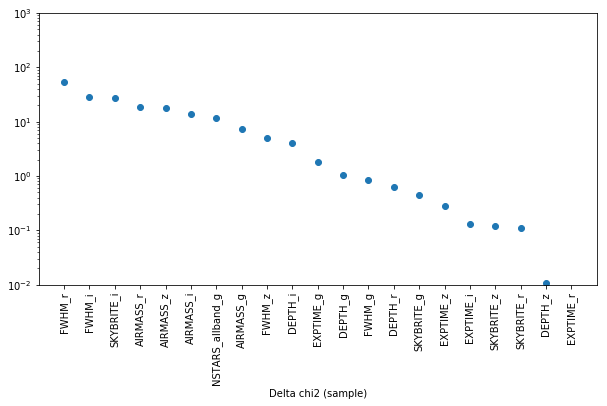

[3.5196921025733605, 2.903013792445382, 2.762173813996953, 2.6023349738352746, 2.206474206949597, 1.5862838835918343, 1.476098790572884, 1.1258618833631502, 0.6068594615662501, 0.5633535021512923, 0.4547709089894809, 0.346313800465218, 0.27969490540400077, 0.19452423278287734, 0.12299588148603391, 0.10962186715098188, 0.06903663498502866, 0.03673719109770257, 0.02842368867395706, 0.025997790530453813, 0.00538347338385492]


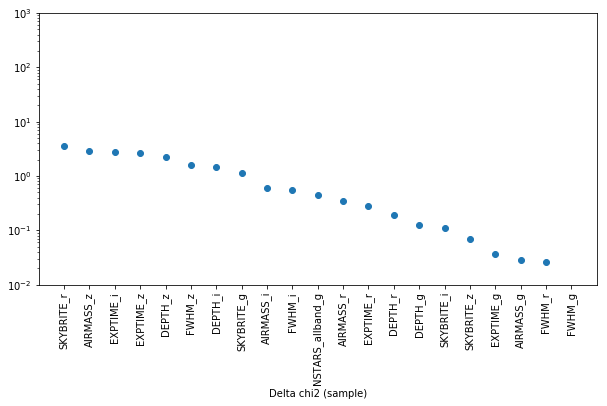

[2.7224638451835492, 0.9950954798195646, 0.9335953166937685, 0.6605889162310863, 0.6577835052704186, 0.6357821295231023, 0.6158870663213483, 0.4521653106880752, 0.44489232875233853, 0.36458498273795215, 0.30907662253185997, 0.09253184240553392, 0.048626726806649145, 0.027072713735505793, 0.0252140582321303, 0.011450458859082246, 0.00963362653830302, 0.005323666404716931, 0.0047507224641814005, 0.003353782552414586, 0.001616744549378879]


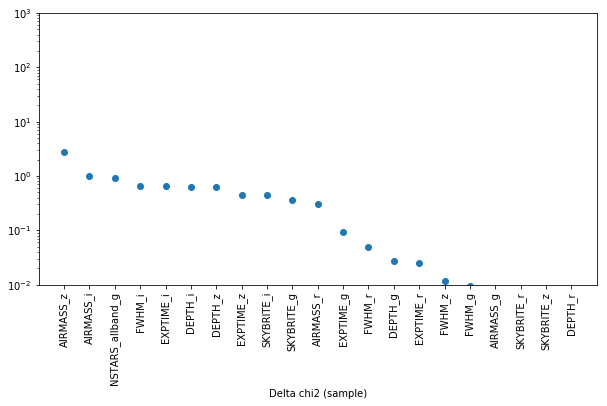

In [102]:
label_no_weight, values_no_weight = plotting_significance( property = properties, filter=filters, kind = kind, suffix='no_weight', 
                    path = inputdir, deltachi2=True)
label_full_weight, values_full_weight = plotting_significance( property = properties, filter=filters, kind = kind, suffix=suf1, 
                    path = inputdir, deltachi2=True)
label_full_weight2, values_full_weight2 = plotting_significance( property = properties, filter=filters, kind = kind, suffix=suf2, 
                    path = inputdir, deltachi2=True)

0

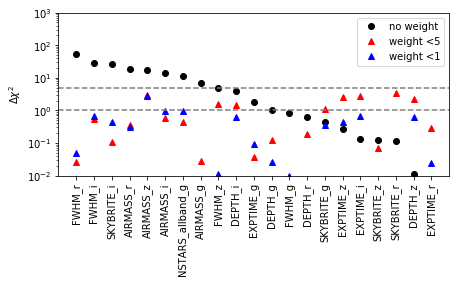

In [104]:

values_full_weight_reorder = []
for la in label_no_weight:
    for j in range(len(label_full_weight)):
        if la == label_full_weight[j]: 
            values_full_weight_reorder.append(values_full_weight[j])
            break

values_full_weight_reorder2 = []
for la in label_no_weight:
    for j in range(len(label_full_weight2)):
        if la == label_full_weight2[j]: 
            values_full_weight_reorder2.append(values_full_weight2[j])
            break
            
values_full_weight_reorder = np.array(values_full_weight_reorder)
values_full_weight_reorder2 = np.array(values_full_weight_reorder2)

fig, ax = plt.subplots(figsize = (7,3))

ax.plot( np.arange( len(values_no_weight) ), values_no_weight,  'ko' , label='no weight'  )
ax.plot( np.arange( len(values_no_weight) ), values_full_weight_reorder, 'r^', label='weight <5'  )
ax.plot( np.arange( len(values_no_weight) ), values_full_weight_reorder2, 'b^', label='weight <1'  )


#ax.plot( values_no_weight, np.arange( len(values_no_weight) ),  'ko'  )
#ax.plot( values_full_weight_reorder, np.arange( len(values_no_weight) ),  'ro'  )
#ax.axhline(y = 1, ls = '--', color='grey')
ax.axhline(y = 5, ls = '--', color='grey')
ax.axhline(y = 1, ls = '--', color='grey')
ax.set_ylim(0.01,1000)
ax.set_ylabel(r'$\Delta \chi^2$')
ax.set_xticks( np.arange(len(values_no_weight)))
ax.set_xticklabels(label_no_weight, rotation = 90)
ax.set_yscale('log')
ax.legend(loc='best')

fig.savefig(inputdir+'comparison3_chisquare_'+suffix+'.png')
0

saving fig to  ../data_txt/systematics/4th/figure/comparison_systematic_GE_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.png


0

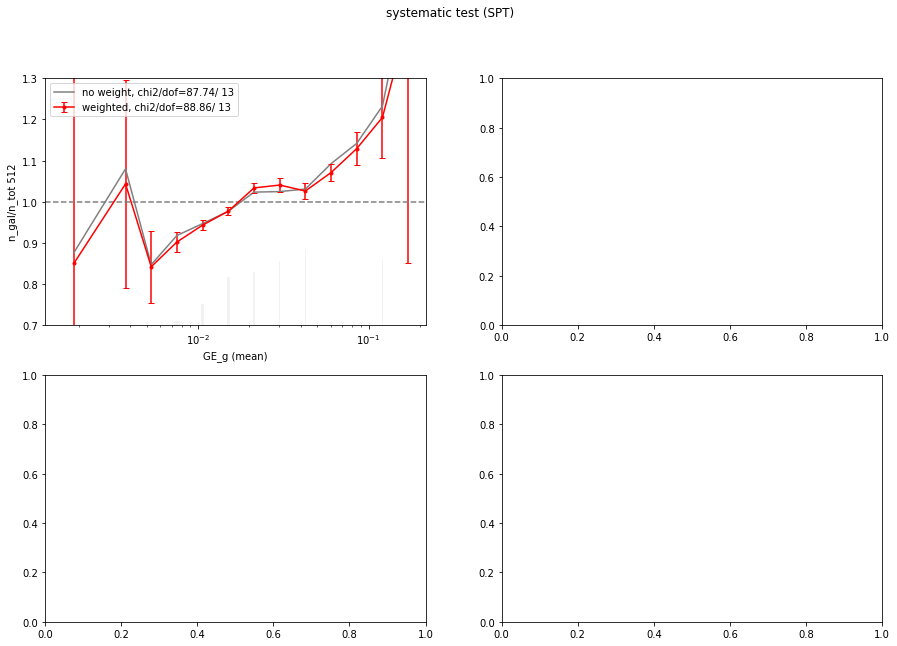

In [129]:
from systematics_module.contCorrection import plot_sysweight
plot_sysweight(property = 'GE', nside = 1024, kind = 'SPT', 
           suffix1='no_weight', suffix2=suffix, inputdir1 = inputdir, inputdir2 = inputdir, outdir=figoutdir)

saving fig to  ../data_txt/systematics/6th_ignore_ge//figure/comparison_systematic_DEPTH_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.png
saving fig to  ../data_txt/systematics/6th_ignore_ge//figure/comparison_systematic_EXPTIME_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.png
saving fig to  ../data_txt/systematics/6th_ignore_ge//figure/comparison_systematic_AIRMASS_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.png
saving fig to  ../data_txt/systematics/6th_ignore_ge//figure/comparison_systematic_SKYBRITE_SPT_wg_fwhm_r_airmass_z_airmass_i_nstars_allband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.png
saving fig to  ../data_txt/systematics/6th_ignore_ge//figure/comparison_systematic_FWHM_SPT_wg_fwhm_r_airmass_z_airmass_i

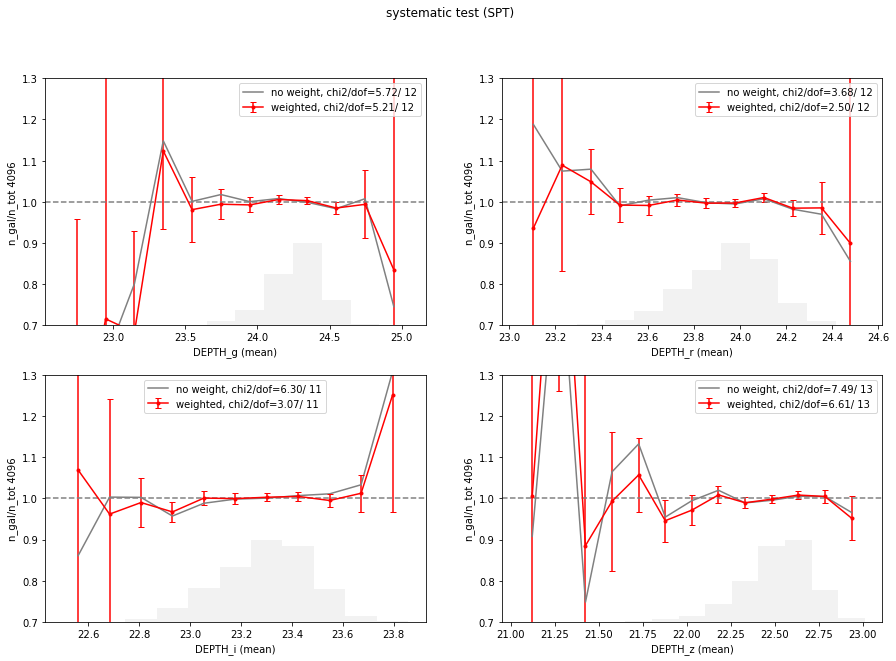

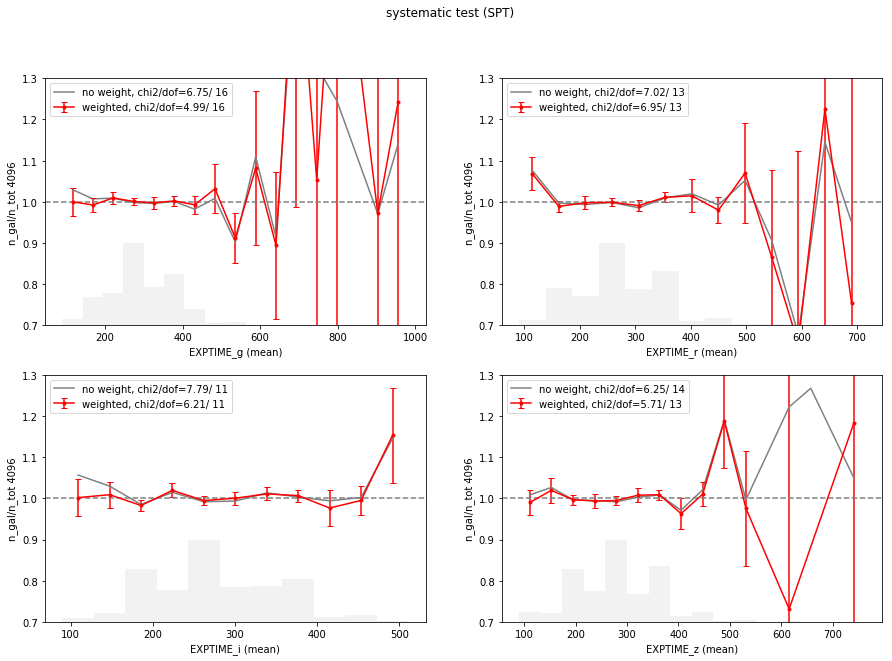

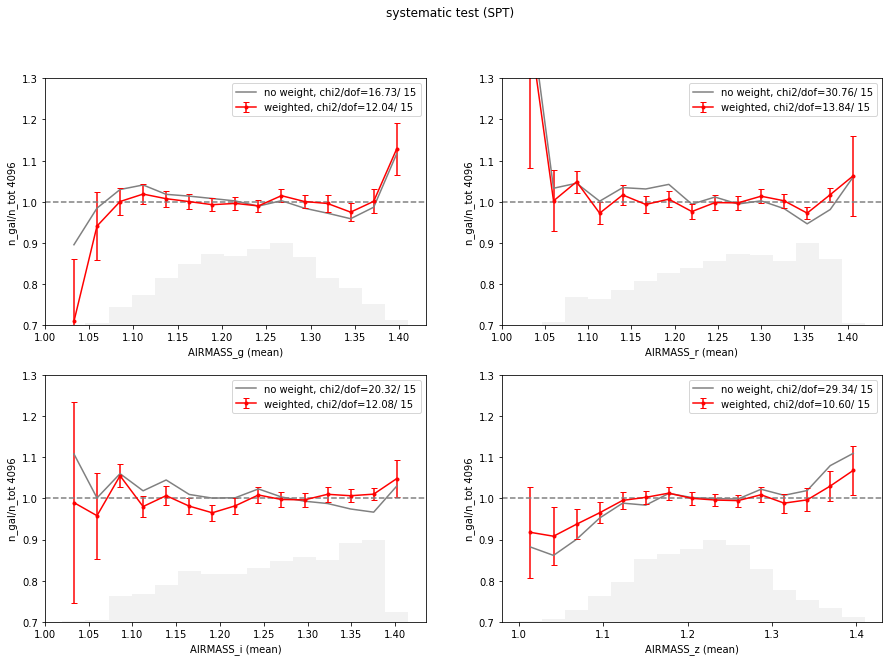

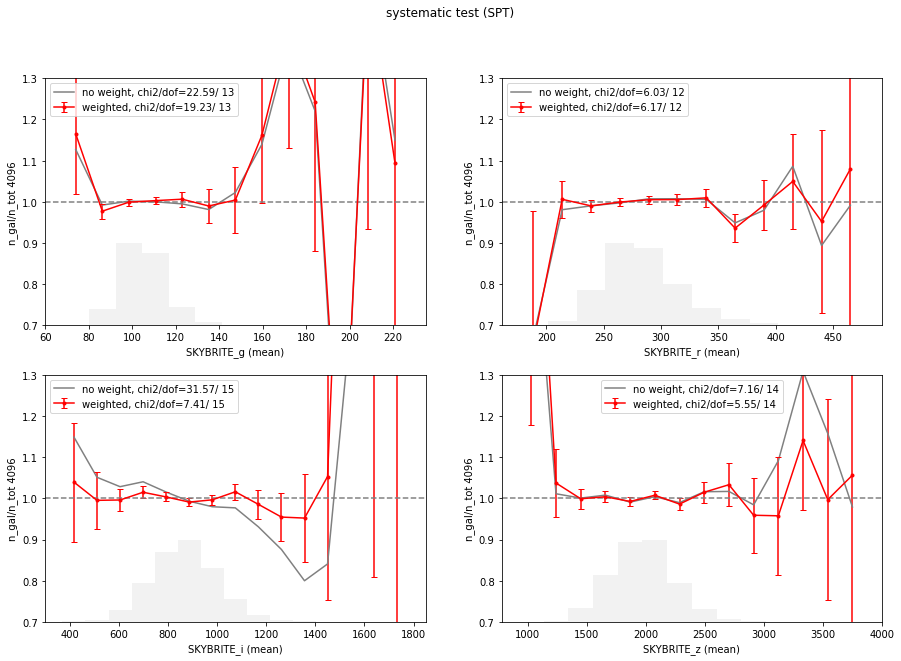

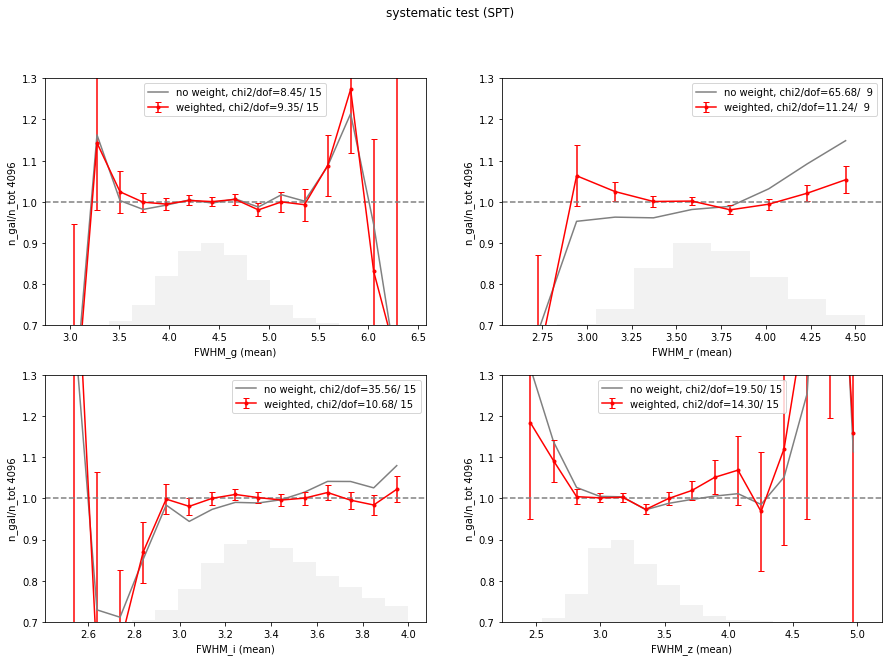

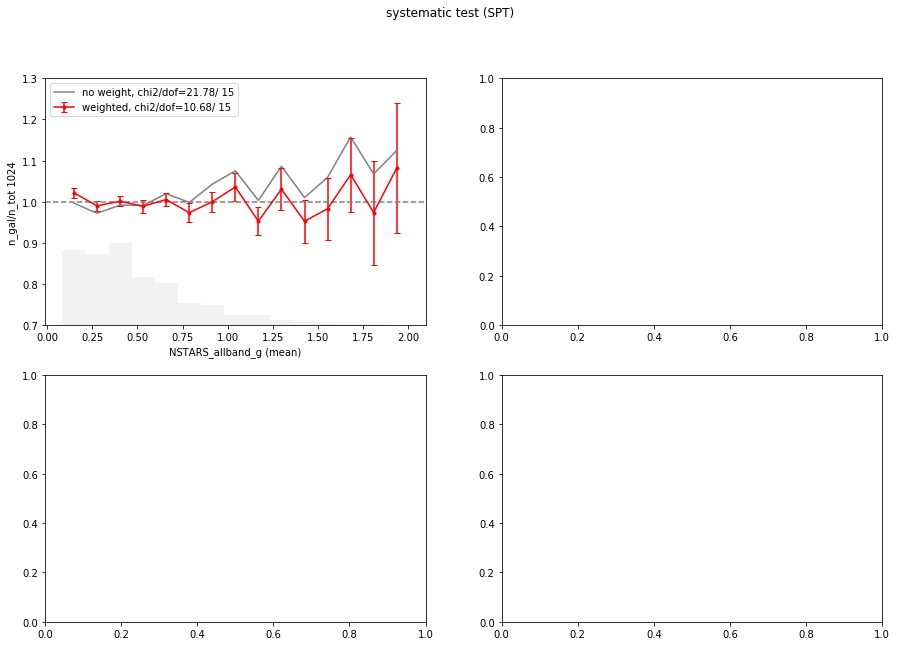

In [105]:
from systematics_module.contCorrection import plot_sysweight
for pr in properties:
    plot_sysweight(property = pr, nside = 4096, kind = 'SPT', 
               suffix1='no_weight', suffix2=suf2, inputdir1 = inputdir, inputdir2 = inputdir, outdir=figoutdir)



saving fig to  ../data_txt/systematics/6th_ignore_ge//figure/comparison_systematic_GE_SPT_wg_fwhm_r_airmass_z_airmass_i_nstarsallband_g_skybrite_i_fwhm_g_skybrite_r_exptime_i_fwhm_z_exptime_g_exptime_z_depth_r.png


0

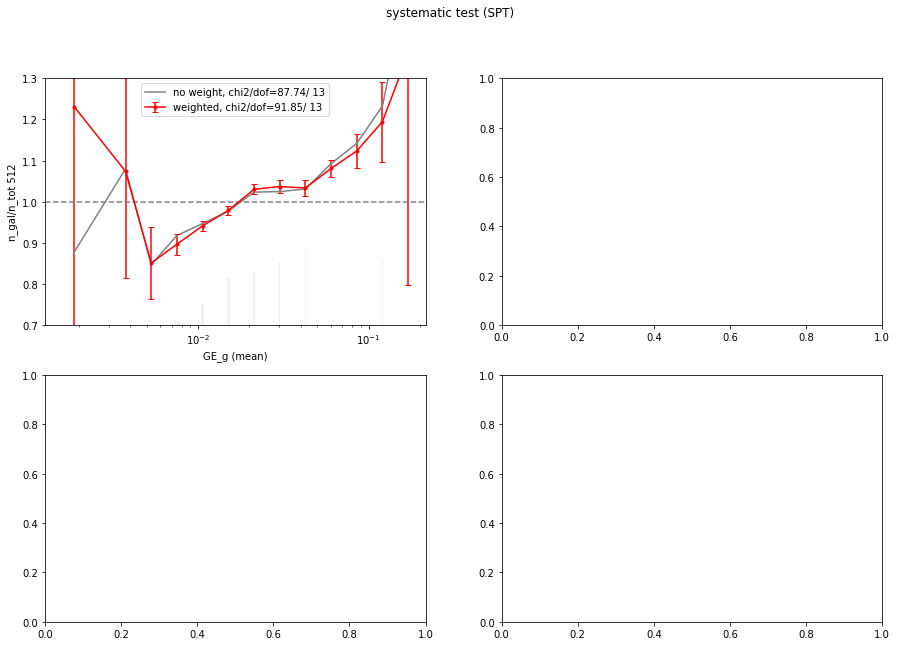

In [126]:
plot_sysweight(property = 'GE', nside = 4096, kind = 'SPT', 
           suffix1='no_weight', suffix2=suf2, inputdir1 = inputdir, inputdir2 = inputdir, outdir=figoutdir)